## Final Project Submission

Please fill out:
* Student name: 
* Student pace: self paced / part time / full time
* Scheduled project review date/time: 
* Instructor name: 
* Blog post URL:


# OBTAIN

In [1]:
# Importing libraries that I will use
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from scipy.spatial import distance

# Setting default seaborn setting for my visuals
sns.set(style="whitegrid")

# Supressing warnings
import warnings
warnings.filterwarnings('ignore')

RUN_CELLS = False


Bad key "text.kerning_factor" on line 4 in
C:\Users\drudi\Anaconda3\envs\learn-env\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
http://github.com/matplotlib/matplotlib/blob/master/matplotlibrc.template
or from the matplotlib source distribution


In [2]:
# Setting pandas to display max columns and rows
pd.set_option('display.max_columns', 0)
pd.set_option('display.max_rows', None)

# Turning off scientific notation in pandas
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [3]:
values = pd.read_csv('TrainingSetValues.csv', index_col='id')
labels = pd.read_csv('TrainingSetLabels.csv', index_col='id')

In [4]:
df = pd.concat([values, labels], axis=1)

In [5]:
df.shape

(59400, 40)

In [6]:
df.head()

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
69572,6000.000,2011-03-14,Roman,1390,Roman,34.938,-9.856,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
8776,0.000,2013-03-06,Grumeti,1399,GRUMETI,34.699,-2.147,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
34310,25.000,2013-02-25,Lottery Club,686,World vision,37.461,-3.821,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
67743,0.000,2013-01-28,Unicef,263,UNICEF,38.486,-11.155,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
19728,0.000,2011-07-13,Action In A,0,Artisan,31.131,-1.825,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


### Competition Predictions

In [7]:
compdf = pd.read_csv('TestSetValues.csv', index_col='id')

In [8]:
compdf.shape

(14850, 39)

In [9]:
compdf.head()

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
50785,0.000,2013-02-04,Dmdd,1996,DMDD,35.291,-4.060,Dinamu Secondary School,0,Internal,Magoma,Manyara,21,3,Mbulu,Bashay,321,True,GeoData Consultants Ltd,Parastatal,NaN,True,2012,other,other,other,parastatal,parastatal,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,other,other
51630,0.000,2013-02-04,Government Of Tanzania,1569,DWE,36.657,-3.309,Kimnyak,0,Pangani,Kimnyak,Arusha,2,2,Arusha Rural,Kimnyaki,300,True,GeoData Consultants Ltd,VWC,TPRI pipe line,True,2000,gravity,gravity,gravity,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe
17168,0.000,2013-02-01,NaN,1567,NaN,34.768,-5.004,Puma Secondary,0,Internal,Msatu,Singida,13,2,Singida Rural,Puma,500,True,GeoData Consultants Ltd,VWC,P,NaN,2010,other,other,other,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,other,other
45559,0.000,2013-01-22,Finn Water,267,FINN WATER,38.058,-9.419,Kwa Mzee Pange,0,Ruvuma / Southern Coast,Kipindimbi,Lindi,80,43,Liwale,Mkutano,250,NaN,GeoData Consultants Ltd,VWC,NaN,True,1987,other,other,other,vwc,user-group,unknown,unknown,soft,good,dry,dry,shallow well,shallow well,groundwater,other,other
49871,500.000,2013-03-27,Bruder,1260,BRUDER,35.006,-10.950,Kwa Mzee Turuka,0,Ruvuma / Southern Coast,Losonga,Ruvuma,10,3,Mbinga,Mbinga Urban,60,NaN,GeoData Consultants Ltd,Water Board,BRUDER,True,2000,gravity,gravity,gravity,water board,user-group,pay monthly,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe


# SCRUB

## Looking at the values in each column

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 69572 to 26348
Data columns (total 40 columns):
amount_tsh               59400 non-null float64
date_recorded            59400 non-null object
funder                   55765 non-null object
gps_height               59400 non-null int64
installer                55745 non-null object
longitude                59400 non-null float64
latitude                 59400 non-null float64
wpt_name                 59400 non-null object
num_private              59400 non-null int64
basin                    59400 non-null object
subvillage               59029 non-null object
region                   59400 non-null object
region_code              59400 non-null int64
district_code            59400 non-null int64
lga                      59400 non-null object
ward                     59400 non-null object
population               59400 non-null int64
public_meeting           56066 non-null object
recorded_by              59400 non-null obj

In [11]:
compdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14850 entries, 50785 to 68707
Data columns (total 39 columns):
amount_tsh               14850 non-null float64
date_recorded            14850 non-null object
funder                   13981 non-null object
gps_height               14850 non-null int64
installer                13973 non-null object
longitude                14850 non-null float64
latitude                 14850 non-null float64
wpt_name                 14850 non-null object
num_private              14850 non-null int64
basin                    14850 non-null object
subvillage               14751 non-null object
region                   14850 non-null object
region_code              14850 non-null int64
district_code            14850 non-null int64
lga                      14850 non-null object
ward                     14850 non-null object
population               14850 non-null int64
public_meeting           14029 non-null object
recorded_by              14850 non-null obj

In [12]:
df.isna().sum()

amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0
water_quality                0
quality_group                0
quantity

In [13]:
compdf.isna().sum()

amount_tsh                  0
date_recorded               0
funder                    869
gps_height                  0
installer                 877
longitude                   0
latitude                    0
wpt_name                    0
num_private                 0
basin                       0
subvillage                 99
region                      0
region_code                 0
district_code               0
lga                         0
ward                        0
population                  0
public_meeting            821
recorded_by                 0
scheme_management         969
scheme_name              7092
permit                    737
construction_year           0
extraction_type             0
extraction_type_group       0
extraction_type_class       0
management                  0
management_group            0
payment                     0
payment_type                0
water_quality               0
quality_group               0
quantity                    0
quantity_g

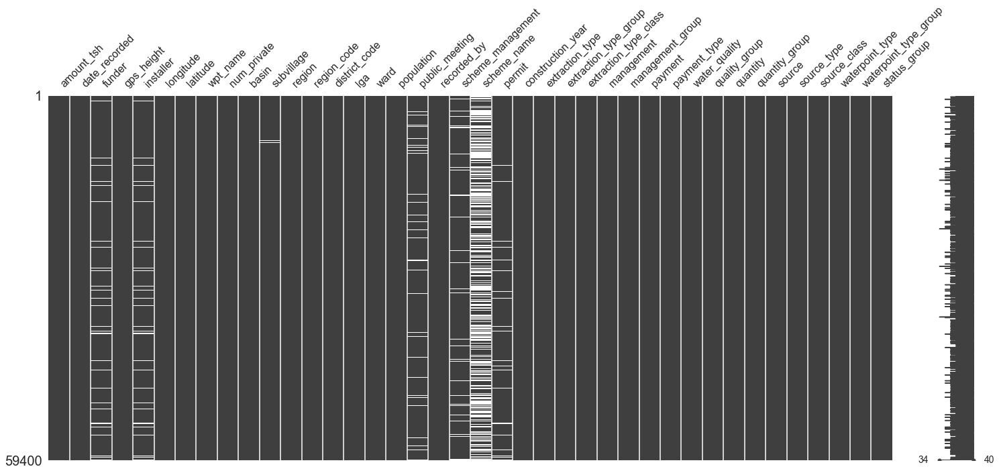

In [14]:
import missingno as ms
ms.matrix(df)

In [15]:
df.describe()

,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.000,59400.000,59400.000,59400.000,59400.000,59400.000,59400.000,59400.000,59400.000
mean,317.650,668.297,34.077,-5.706,0.474,15.297,5.630,179.910,1300.652
std,2997.575,693.116,6.567,2.946,12.236,17.587,9.634,471.482,951.621
min,0.000,-90.000,0.000,-11.649,0.000,1.000,0.000,0.000,0.000
25%,0.000,0.000,33.090,-8.541,0.000,5.000,2.000,0.000,0.000
50%,0.000,369.000,34.909,-5.022,0.000,12.000,3.000,25.000,1986.000
75%,20.000,1319.250,37.178,-3.326,0.000,17.000,5.000,215.000,2004.000
max,350000.000,2770.000,40.345,-0.000,1776.000,99.000,80.000,30500.000,2013.000


In [16]:
df.status_group.value_counts()

functional                 32259
non functional             22824
functional needs repair     4317
Name: status_group, dtype: int64

In [17]:
df.amount_tsh.value_counts(normalize=True)

0.000        0.701
500.000      0.052
50.000       0.042
1000.000     0.025
20.000       0.025
200.000      0.021
100.000      0.014
10.000       0.014
30.000       0.013
2000.000     0.012
250.000      0.010
300.000      0.009
5000.000     0.008
5.000        0.006
25.000       0.006
3000.000     0.006
1200.000     0.004
1500.000     0.003
6.000        0.003
600.000      0.003
4000.000     0.003
2400.000     0.002
2500.000     0.002
6000.000     0.002
7.000        0.001
8000.000     0.001
750.000      0.001
40.000       0.001
10000.000    0.001
12000.000    0.001
20000.000    0.001
3600.000     0.001
400.000      0.001
450.000      0.001
2200.000     0.001
700.000      0.000
4700.000     0.000
70.000       0.000
150.000      0.000
33.000       0.000
15000.000    0.000
60.000       0.000
15.000       0.000
2800.000     0.000
2.000        0.000
7200.000     0.000
1300.000     0.000
6500.000     0.000
25000.000    0.000
30000.000    0.000
7500.000     0.000
35.000       0.000
7000.000    

In [18]:
df.amount_tsh = df.amount_tsh.astype('int64')
compdf.amount_tsh = compdf.amount_tsh.astype('int64')

In [19]:
df.date_recorded.value_counts()

2011-03-15    572
2011-03-17    558
2013-02-03    546
2011-03-14    520
2011-03-16    513
2011-03-18    497
2011-03-19    466
2013-02-04    464
2013-01-29    459
2011-03-04    458
2013-02-14    444
2013-01-24    435
2011-03-05    434
2013-02-15    429
2013-03-15    428
2011-03-11    426
2013-01-30    421
2013-02-16    418
2011-03-23    417
2011-03-09    416
2013-01-18    409
2013-02-26    391
2011-03-30    391
2011-03-24    381
2013-03-19    381
2013-02-13    380
2013-01-23    379
2011-03-12    379
2011-03-03    378
2013-01-28    376
2011-03-13    373
2011-07-27    373
2013-02-19    371
2013-02-02    370
2013-02-18    369
2013-01-19    368
2011-03-22    364
2013-01-22    364
2011-03-10    364
2013-02-08    363
2013-03-18    360
2012-10-22    353
2011-03-21    351
2011-02-26    351
2013-03-04    347
2013-03-13    346
2011-07-30    345
2011-03-26    342
2013-01-16    342
2011-02-28    341
2013-02-27    340
2013-01-25    338
2013-02-01    338
2011-07-19    338
2013-02-12    337
2011-03-28

In [20]:
df.drop('date_recorded', axis=1, inplace=True)
compdf.drop('date_recorded', axis=1, inplace=True)

In [21]:
df.funder.value_counts(dropna=False, normalize=True)

Government Of Tanzania           0.153
NaN                              0.061
Danida                           0.052
Hesawa                           0.037
Rwssp                            0.023
World Bank                       0.023
Kkkt                             0.022
World Vision                     0.021
Unicef                           0.018
Tasaf                            0.015
District Council                 0.014
Dhv                              0.014
Private Individual               0.014
Dwsp                             0.014
0                                0.013
Norad                            0.013
Germany Republi                  0.010
Tcrs                             0.010
Ministry Of Water                0.010
Water                            0.010
Dwe                              0.008
Netherlands                      0.008
Hifab                            0.008
Adb                              0.008
Lga                              0.007
Amref                    

In [22]:
df.funder.fillna('other', inplace=True)
compdf.funder.fillna('other', inplace=True)

In [23]:
df.gps_height.value_counts(dropna=False, normalize=True)

 0      0.344
-15     0.001
-16     0.001
-13     0.001
-20     0.001
 1290   0.001
-14     0.001
 303    0.001
-18     0.001
-19     0.001
 1269   0.001
 1295   0.001
 1304   0.001
-23     0.001
 280    0.001
 1538   0.001
 1286   0.001
-8      0.001
-17     0.001
 1332   0.001
 320    0.001
 1317   0.001
 1293   0.001
 1319   0.001
 1359   0.001
 1264   0.001
 1288   0.001
 1401   0.001
 1303   0.001
-27     0.001
-6      0.001
 1272   0.001
 1613   0.001
 1152   0.001
 12     0.001
-11     0.001
 309    0.001
 1602   0.001
 1342   0.001
 1323   0.001
 336    0.001
 1322   0.001
 338    0.001
 1325   0.001
 1330   0.001
-21     0.001
 1180   0.001
-2      0.001
 1311   0.001
 1240   0.001
 1271   0.001
 1384   0.001
 1307   0.001
 1597   0.001
 1314   0.001
 17     0.001
 1289   0.001
 1370   0.001
 1329   0.001
 1582   0.001
 1270   0.001
 1407   0.001
 1306   0.001
-3      0.001
 1266   0.001
 1252   0.001
 306    0.001
 1362   0.001
-7      0.001
 1161   0.001
 259    0.001
-22   

In [24]:
df.installer.value_counts(dropna=False, normalize=True)

DWE                              0.293
NaN                              0.062
Government                       0.031
RWE                              0.020
Commu                            0.018
DANIDA                           0.018
KKKT                             0.015
Hesawa                           0.014
0                                0.013
TCRS                             0.012
Central government               0.010
CES                              0.010
Community                        0.009
DANID                            0.009
District Council                 0.009
HESAWA                           0.009
World vision                     0.007
LGA                              0.007
WEDECO                           0.007
TASAF                            0.007
District council                 0.007
Gover                            0.006
AMREF                            0.006
TWESA                            0.005
WU                               0.005
Dmdd                     

In [25]:
df.installer.fillna('other', inplace=True)
compdf.installer.fillna('other', inplace=True)

In [26]:
df.installer = df.installer.replace({'World vision': 'World Vision', 
                      'District council': 'District Council', 
                      'Central government': 'Government',
                    'Central Government': 'Government',
                    'Gover': 'Government',
                    'KKKT _ Konde and DWE': 'KKKT',
                     'Hesawa': 'HESAWA',
                    'DANID': 'DANIDA', 'Commu':'Community'})

In [27]:
compdf.installer.value_counts(dropna=False, normalize=True)

DWE                              0.293
other                            0.059
Government                       0.031
RWE                              0.020
Commu                            0.019
DANIDA                           0.017
Hesawa                           0.015
KKKT                             0.015
0                                0.014
TCRS                             0.012
CES                              0.010
Central government               0.010
HESAWA                           0.009
DANID                            0.009
Community                        0.009
District Council                 0.008
World vision                     0.007
TASAF                            0.007
Gover                            0.007
WEDECO                           0.007
District council                 0.007
LGA                              0.006
TWESA                            0.005
WU                               0.005
AMREF                            0.005
Dmdd                     

In [28]:
compdf.installer = compdf.installer.replace({'World vision': 'World Vision', 
                      'District council': 'District Council', 
                      'Central government': 'Government',
                    'Central Government': 'Government',
                    'Gover': 'Government',
                    'KKKT _ Konde and DWE': 'KKKT',
                     'Hesawa': 'HESAWA',
                    'DANID': 'DANIDA', 'Commu':'Community'})

In [29]:
df.installer.value_counts(dropna=False, normalize=True)

DWE                              0.293
other                            0.062
Government                       0.049
Community                        0.027
DANIDA                           0.027
HESAWA                           0.023
RWE                              0.020
KKKT                             0.018
District Council                 0.016
0                                0.013
TCRS                             0.012
World Vision                     0.011
CES                              0.010
LGA                              0.007
WEDECO                           0.007
TASAF                            0.007
AMREF                            0.006
TWESA                            0.005
WU                               0.005
Dmdd                             0.005
ACRA                             0.005
SEMA                             0.004
DW                               0.004
OXFAM                            0.004
Da                               0.004
Gove                     

In [30]:
compdf.installer.value_counts(dropna=False, normalize=True)

DWE                              0.293
other                            0.059
Government                       0.049
Community                        0.028
DANIDA                           0.026
HESAWA                           0.025
RWE                              0.020
KKKT                             0.018
District Council                 0.014
0                                0.014
TCRS                             0.012
World Vision                     0.011
CES                              0.010
TASAF                            0.007
WEDECO                           0.007
LGA                              0.006
TWESA                            0.005
WU                               0.005
AMREF                            0.005
Dmdd                             0.005
ACRA                             0.005
UNICEF                           0.004
Da                               0.004
Villagers                        0.004
DW                               0.004
SEMA                     

In [31]:
df.longitude.value_counts(dropna=False)

0.000     1812
37.541       2
33.011       2
39.093       2
32.973       2
33.006       2
39.104       2
37.543       2
36.802       2
39.098       2
33.090       2
33.005       2
32.978       2
39.089       2
31.620       2
39.093       2
39.105       2
32.937       2
32.988       2
39.091       2
37.314       2
32.985       2
39.091       2
37.274       2
32.920       2
37.531       2
32.956       2
39.099       2
32.989       2
32.988       2
32.993       2
37.298       2
37.252       2
32.983       2
39.096       2
37.533       2
39.096       2
37.374       2
37.319       2
37.376       2
38.181       2
39.086       2
39.092       2
37.269       2
39.104       2
32.994       2
37.250       2
39.096       2
39.099       2
37.281       2
39.101       2
39.095       2
39.092       2
32.926       2
37.539       2
37.542       2
37.340       2
37.329       2
37.543       2
32.957       2
32.967       2
39.086       2
37.534       2
39.086       2
32.966       2
39.090       2
32.925    

In [32]:
df.latitude.value_counts(dropna=False)

-0.000     1812
-6.986        2
-3.798        2
-6.982        2
-7.105        2
-7.057        2
-7.175        2
-6.991        2
-6.979        2
-6.995        2
-2.495        2
-6.964        2
-2.507        2
-6.991        2
-2.485        2
-2.494        2
-6.962        2
-6.989        2
-6.957        2
-6.959        2
-6.993        2
-6.991        2
-7.177        2
-2.502        2
-1.793        2
-7.102        2
-2.467        2
-2.517        2
-7.095        2
-6.981        2
-6.980        2
-7.177        2
-6.990        2
-2.480        2
-6.964        2
-6.957        2
-2.465        2
-6.978        2
-6.975        2
-6.978        2
-2.504        2
-6.964        2
-2.490        2
-6.976        2
-2.520        2
-2.464        2
-6.984        2
-7.105        2
-2.515        2
-7.094        2
-7.065        2
-2.496        2
-2.517        2
-6.982        2
-7.104        2
-6.983        2
-2.529        2
-9.289        2
-6.980        2
-2.492        2
-2.487        2
-2.489        2
-2.511  

In [33]:
df.wpt_name.value_counts(dropna=False, normalize=True)

none                             0.060
Shuleni                          0.029
Zahanati                         0.014
Msikitini                        0.009
Kanisani                         0.005
Bombani                          0.005
Sokoni                           0.004
Ofisini                          0.004
School                           0.004
Shule Ya Msingi                  0.003
Shule                            0.003
Sekondari                        0.002
Muungano                         0.002
Mkombozi                         0.002
Madukani                         0.002
Mbugani                          0.002
Hospital                         0.002
Upendo                           0.002
Kituo Cha Afya                   0.002
Mkuyuni                          0.001
Umoja                            0.001
Center                           0.001
Ccm                              0.001
Kisimani                         0.001
Ofisi Ya Kijiji                  0.001
Mtakuja                  

In [34]:
df.drop('wpt_name', axis=1, inplace=True)
compdf.drop('wpt_name', axis=1, inplace=True)

In [35]:
df.num_private.value_counts(dropna=False, normalize=True)

0      0.987
6      0.001
1      0.001
5      0.001
8      0.001
32     0.001
45     0.001
15     0.001
39     0.001
93     0.000
3      0.000
7      0.000
2      0.000
65     0.000
47     0.000
102    0.000
4      0.000
17     0.000
80     0.000
20     0.000
25     0.000
11     0.000
41     0.000
34     0.000
16     0.000
120    0.000
150    0.000
22     0.000
12     0.000
24     0.000
50     0.000
38     0.000
58     0.000
9      0.000
10     0.000
14     0.000
61     0.000
27     0.000
26     0.000
160    0.000
30     0.000
698    0.000
60     0.000
1402   0.000
450    0.000
668    0.000
131    0.000
35     0.000
672    0.000
42     0.000
136    0.000
87     0.000
300    0.000
280    0.000
141    0.000
62     0.000
111    0.000
240    0.000
1776   0.000
755    0.000
180    0.000
213    0.000
23     0.000
55     0.000
94     0.000
Name: num_private, dtype: float64

In [36]:
df.drop('num_private', axis=1, inplace=True)
compdf.drop('num_private', axis=1, inplace=True)

In [37]:
df.basin.value_counts(dropna=False, normalize=True)

Lake Victoria             0.173
Pangani                   0.151
Rufiji                    0.134
Internal                  0.131
Lake Tanganyika           0.108
Wami / Ruvu               0.101
Lake Nyasa                0.086
Ruvuma / Southern Coast   0.076
Lake Rukwa                0.041
Name: basin, dtype: float64

In [38]:
df.subvillage.value_counts(dropna=False, normalize=True)

Madukani                         0.009
Shuleni                          0.009
Majengo                          0.008
Kati                             0.006
NaN                              0.006
Mtakuja                          0.004
Sokoni                           0.004
M                                0.003
Muungano                         0.003
Mbuyuni                          0.003
Mlimani                          0.003
Songambele                       0.002
Miembeni                         0.002
Msikitini                        0.002
1                                0.002
Kibaoni                          0.002
Kanisani                         0.002
Mapinduzi                        0.002
I                                0.002
Mjini                            0.002
Mjimwema                         0.002
Mkwajuni                         0.002
Mwenge                           0.002
Azimio                           0.002
Mabatini                         0.002
Mission                  

In [39]:
df.drop('subvillage', axis=1, inplace=True)
compdf.drop('subvillage', axis=1, inplace=True)

In [40]:
df.region.value_counts(dropna=False, normalize=True)

Iringa          0.089
Shinyanga       0.084
Mbeya           0.078
Kilimanjaro     0.074
Morogoro        0.067
Arusha          0.056
Kagera          0.056
Mwanza          0.052
Kigoma          0.047
Ruvuma          0.044
Pwani           0.044
Tanga           0.043
Dodoma          0.037
Singida         0.035
Mara            0.033
Tabora          0.033
Rukwa           0.030
Mtwara          0.029
Manyara         0.027
Lindi           0.026
Dar es Salaam   0.014
Name: region, dtype: float64

In [41]:
df.region_code.value_counts(dropna=False, normalize=True)

11   0.089
17   0.084
12   0.078
3    0.074
5    0.068
18   0.056
19   0.051
2    0.051
16   0.047
10   0.044
4    0.042
1    0.037
13   0.035
14   0.033
20   0.033
15   0.030
6    0.027
21   0.027
80   0.021
60   0.017
90   0.015
7    0.014
99   0.007
9    0.007
24   0.005
8    0.005
40   0.000
Name: region_code, dtype: float64

In [42]:
df.drop('region_code', axis=1, inplace=True)
compdf.drop('region_code', axis=1, inplace=True)

In [43]:
df.district_code.value_counts(dropna=False, normalize=True)

1    0.205
2    0.188
3    0.168
4    0.151
5    0.073
6    0.069
7    0.056
8    0.018
30   0.017
33   0.015
53   0.013
43   0.009
13   0.007
23   0.005
63   0.003
62   0.002
60   0.001
0    0.000
80   0.000
67   0.000
Name: district_code, dtype: float64

In [44]:
df.drop('district_code', axis=1, inplace=True)
compdf.drop('district_code', axis=1, inplace=True)

In [45]:
df.lga.value_counts(dropna=False, normalize=True)

Njombe             0.042
Arusha Rural       0.021
Moshi Rural        0.021
Bariadi            0.020
Rungwe             0.019
Kilosa             0.018
Kasulu             0.018
Mbozi              0.017
Meru               0.017
Bagamoyo           0.017
Singida Rural      0.017
Kilombero          0.016
Same               0.015
Kibondo            0.015
Kyela              0.014
Kahama             0.014
Kigoma Rural       0.014
Magu               0.014
Maswa              0.014
Karagwe            0.013
Mbinga             0.013
Iringa Rural       0.012
Serengeti          0.012
Namtumbo           0.012
Lushoto            0.012
Songea Rural       0.012
Mpanda             0.011
Mvomero            0.011
Ngara              0.011
Ulanga             0.011
Makete             0.011
Kwimba             0.011
Mbarali            0.011
Hai                0.011
Rombo              0.010
Shinyanga Rural    0.010
Nzega              0.010
Ludewa             0.009
Mkuranga           0.009
Iramba             0.009


In [46]:
df.ward.value_counts(dropna=False)

Igosi                      307
Imalinyi                   252
Siha Kati                  232
Mdandu                     231
Nduruma                    217
Kitunda                    203
Mishamo                    203
Msindo                     201
Chalinze                   196
Maji ya Chai               190
Usuka                      187
Ngarenanyuki               172
Chanika                    171
Vikindu                    162
Mtwango                    153
Matola                     145
Zinga/Ikerege              141
Wanging'ombe               139
Maramba                    139
Itete                      137
Magomeni                   135
Kikatiti                   134
Ifakara                    134
Olkokola                   133
Maposeni                   130
Mvomero                    129
Igongolo                   129
Mlangali                   125
Nkoma                      122
Mahongole                  121
Nkungulu                   121
Rujewa                     120
Simbo   

In [47]:
df.drop('ward', axis=1, inplace=True)
compdf.drop('ward', axis=1, inplace=True)

In [48]:
df.population.value_counts(dropna=False, normalize=True)

0       0.360
1       0.118
200     0.033
150     0.032
250     0.028
300     0.025
100     0.019
50      0.019
500     0.017
350     0.017
120     0.015
400     0.013
60      0.012
30      0.011
40      0.009
80      0.009
450     0.008
20      0.008
600     0.007
230     0.007
75      0.005
1000    0.005
800     0.005
90      0.004
130     0.004
25      0.004
320     0.004
35      0.004
360     0.004
140     0.004
210     0.004
70      0.004
45      0.003
15      0.003
700     0.003
1500    0.003
180     0.003
650     0.003
65      0.003
1200    0.003
10      0.003
420     0.003
240     0.003
750     0.003
56      0.003
2000    0.002
160     0.002
260     0.002
55      0.002
125     0.002
96      0.002
540     0.002
560     0.002
280     0.002
550     0.002
86      0.002
380     0.001
98      0.001
340     0.001
220     0.001
170     0.001
270     0.001
85      0.001
900     0.001
520     0.001
256     0.001
530     0.001
110     0.001
950     0.001
145     0.001
156     0.001
89    

In [49]:
df.public_meeting.value_counts(dropna=False, normalize=True)

True    0.859
False   0.085
NaN     0.056
Name: public_meeting, dtype: float64

In [50]:
compdf.public_meeting.value_counts(dropna=False, normalize=True)

True    0.858
False   0.087
NaN     0.055
Name: public_meeting, dtype: float64

In [51]:
df.public_meeting.fillna('unknown', inplace=True)
compdf.public_meeting.fillna('unknown', inplace=True)

In [52]:
df.public_meeting = df.public_meeting.astype('str')
compdf.public_meeting = compdf.public_meeting.astype('str')

In [53]:
df['public_meeting'] = df['public_meeting'].map({'True': 'yes', 'False': 'no', 'unknown': 'unknown'})
compdf['public_meeting'] = compdf['public_meeting'].map({'True': 'yes', 'False': 'no', 'unknown': 'unknown'})

In [54]:
df.recorded_by.value_counts(dropna=False, normalize=True)

GeoData Consultants Ltd   1.000
Name: recorded_by, dtype: float64

In [55]:
df.drop('recorded_by', axis=1, inplace=True)
compdf.drop('recorded_by', axis=1, inplace=True)

In [56]:
df.scheme_management.value_counts(dropna=False, normalize=True)

VWC                0.619
WUG                0.088
NaN                0.065
Water authority    0.053
WUA                0.049
Water Board        0.046
Parastatal         0.028
Private operator   0.018
Company            0.018
Other              0.013
SWC                0.002
Trust              0.001
None               0.000
Name: scheme_management, dtype: float64

In [57]:
df.scheme_management.fillna('Other', inplace=True)
compdf.scheme_management.fillna('Other', inplace=True)

In [58]:
df.scheme_name.value_counts(dropna=False, normalize=True)

NaN                                              0.474
K                                                0.011
None                                             0.011
Borehole                                         0.009
Chalinze wate                                    0.007
M                                                0.007
DANIDA                                           0.006
Government                                       0.005
Ngana water supplied scheme                      0.005
wanging'ombe water supply s                      0.004
wanging'ombe supply scheme                       0.004
Bagamoyo wate                                    0.004
I                                                0.004
Uroki-Bomang'ombe water sup                      0.004
N                                                0.003
Kirua kahe gravity water supply trust            0.003
Machumba estate pipe line                        0.003
Makwale water supplied sche                      0.003
Kijiji    

In [59]:
df.drop('scheme_name', axis=1, inplace=True)
compdf.drop('scheme_name', axis=1, inplace=True)

In [60]:
df.permit.value_counts(dropna=False, normalize=True)

True    0.654
False   0.294
NaN     0.051
Name: permit, dtype: float64

In [61]:
df.permit.fillna('unknown', inplace=True)
compdf.permit.fillna('unknown', inplace=True)

In [62]:
df.permit = df.permit.astype('str')
compdf.permit = compdf.permit.astype('str')

In [63]:
df['permit'] = df['permit'].map({'True': 'yes', 'False': 'no', 'unknown': 'unknown'})
compdf['permit'] = compdf['permit'].map({'True': 'yes', 'False': 'no', 'unknown': 'unknown'})

In [64]:
df.construction_year.value_counts(dropna=False, normalize=True)

0      0.349
2010   0.045
2008   0.044
2009   0.043
2000   0.035
2007   0.027
2006   0.025
2003   0.022
2011   0.021
2004   0.019
2012   0.018
2002   0.018
1978   0.017
1995   0.017
2005   0.017
1999   0.016
1998   0.016
1990   0.016
1985   0.016
1980   0.014
1996   0.014
1984   0.013
1982   0.013
1994   0.012
1972   0.012
1974   0.011
1997   0.011
1992   0.011
1993   0.010
2001   0.009
1988   0.009
1983   0.008
1975   0.007
1986   0.007
1976   0.007
1970   0.007
1991   0.005
1989   0.005
1987   0.005
1981   0.004
1977   0.003
1979   0.003
1973   0.003
2013   0.003
1971   0.002
1960   0.002
1967   0.001
1963   0.001
1968   0.001
1969   0.001
1964   0.001
1962   0.001
1961   0.000
1965   0.000
1966   0.000
Name: construction_year, dtype: float64

In [65]:
df.extraction_type.value_counts(dropna=False, normalize=True)

gravity                     0.451
nira/tanira                 0.137
other                       0.108
submersible                 0.080
swn 80                      0.062
mono                        0.048
india mark ii               0.040
afridev                     0.030
ksb                         0.024
other - rope pump           0.008
other - swn 81              0.004
windmill                    0.002
india mark iii              0.002
cemo                        0.002
other - play pump           0.001
walimi                      0.001
climax                      0.001
other - mkulima/shinyanga   0.000
Name: extraction_type, dtype: float64

In [66]:
df.extraction_type_group.value_counts(dropna=False, normalize=True)

gravity           0.451
nira/tanira       0.137
other             0.108
submersible       0.104
swn 80            0.062
mono              0.048
india mark ii     0.040
afridev           0.030
rope pump         0.008
other handpump    0.006
other motorpump   0.002
wind-powered      0.002
india mark iii    0.002
Name: extraction_type_group, dtype: float64

In [67]:
df.extraction_type_class.value_counts(dropna=False, normalize=True)

gravity        0.451
handpump       0.277
other          0.108
submersible    0.104
motorpump      0.050
rope pump      0.008
wind-powered   0.002
Name: extraction_type_class, dtype: float64

In [68]:
df.drop(columns=['extraction_type_group', 'extraction_type_class'], 
        inplace=True)
compdf.drop(columns=['extraction_type_group', 'extraction_type_class'], 
            inplace=True)

In [69]:
df.management.value_counts(dropna=False, normalize=True)

vwc                0.682
wug                0.110
water board        0.049
wua                0.043
private operator   0.033
parastatal         0.030
water authority    0.015
other              0.014
company            0.012
unknown            0.009
other - school     0.002
trust              0.001
Name: management, dtype: float64

In [70]:
df.management_group.value_counts(dropna=False, normalize=True)

user-group   0.884
commercial   0.061
parastatal   0.030
other        0.016
unknown      0.009
Name: management_group, dtype: float64

In [71]:
df.drop('management_group', axis=1, inplace=True)
compdf.drop('management_group', axis=1, inplace=True)

In [72]:
df.payment.value_counts(dropna=False, normalize=True)

never pay               0.427
pay per bucket          0.151
pay monthly             0.140
unknown                 0.137
pay when scheme fails   0.066
pay annually            0.061
other                   0.018
Name: payment, dtype: float64

In [73]:
df.payment_type.value_counts(dropna=False, normalize=True)

never pay    0.427
per bucket   0.151
monthly      0.140
unknown      0.137
on failure   0.066
annually     0.061
other        0.018
Name: payment_type, dtype: float64

In [74]:
df.drop('payment', axis=1, inplace=True)
compdf.drop('payment', axis=1, inplace=True)

In [75]:
df.water_quality.value_counts(dropna=False, normalize=True)

soft                 0.856
salty                0.082
unknown              0.032
milky                0.014
coloured             0.008
salty abandoned      0.006
fluoride             0.003
fluoride abandoned   0.000
Name: water_quality, dtype: float64

In [76]:
df.quality_group.value_counts(dropna=False, normalize=True)

good       0.856
salty      0.087
unknown    0.032
milky      0.014
colored    0.008
fluoride   0.004
Name: quality_group, dtype: float64

In [77]:
df.drop('quality_group', axis=1, inplace=True)
compdf.drop('quality_group', axis=1, inplace=True)

In [78]:
df.quantity.value_counts(dropna=False, normalize=True)

enough         0.559
insufficient   0.255
dry            0.105
seasonal       0.068
unknown        0.013
Name: quantity, dtype: float64

In [79]:
df.quantity_group.value_counts(dropna=False, normalize=True)

enough         0.559
insufficient   0.255
dry            0.105
seasonal       0.068
unknown        0.013
Name: quantity_group, dtype: float64

In [80]:
df.drop('quantity_group', axis=1, inplace=True)
compdf.drop('quantity_group', axis=1, inplace=True)

In [81]:
df.source.value_counts(dropna=False, normalize=True)

spring                 0.287
shallow well           0.283
machine dbh            0.186
river                  0.162
rainwater harvesting   0.039
hand dtw               0.015
lake                   0.013
dam                    0.011
other                  0.004
unknown                0.001
Name: source, dtype: float64

In [82]:
df.source_type.value_counts(dropna=False, normalize=True)

spring                 0.287
shallow well           0.283
borehole               0.201
river/lake             0.175
rainwater harvesting   0.039
dam                    0.011
other                  0.005
Name: source_type, dtype: float64

In [83]:
df.drop('source_type', axis=1, inplace=True)
compdf.drop('source_type', axis=1, inplace=True)

In [84]:
df.source_class.value_counts(dropna=False, normalize=True)

groundwater   0.771
surface       0.224
unknown       0.005
Name: source_class, dtype: float64

In [85]:
df.drop('source_class', axis=1, inplace=True)
compdf.drop('source_class', axis=1, inplace=True)

In [86]:
df.waterpoint_type.value_counts(dropna=False, normalize=True)

communal standpipe            0.480
hand pump                     0.294
other                         0.107
communal standpipe multiple   0.103
improved spring               0.013
cattle trough                 0.002
dam                           0.000
Name: waterpoint_type, dtype: float64

In [87]:
df.waterpoint_type_group.value_counts(dropna=False, normalize=True)

communal standpipe   0.583
hand pump            0.294
other                0.107
improved spring      0.013
cattle trough        0.002
dam                  0.000
Name: waterpoint_type_group, dtype: float64

In [88]:
df.drop('waterpoint_type_group', axis=1, inplace=True)
compdf.drop('waterpoint_type_group', axis=1, inplace=True)

In [89]:
print(df.shape)
print(compdf.shape)

(59400, 22)
(14850, 21)


In [90]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 69572 to 26348
Data columns (total 22 columns):
amount_tsh           59400 non-null int64
funder               59400 non-null object
gps_height           59400 non-null int64
installer            59400 non-null object
longitude            59400 non-null float64
latitude             59400 non-null float64
basin                59400 non-null object
region               59400 non-null object
lga                  59400 non-null object
population           59400 non-null int64
public_meeting       59400 non-null object
scheme_management    59400 non-null object
permit               59400 non-null object
construction_year    59400 non-null int64
extraction_type      59400 non-null object
management           59400 non-null object
payment_type         59400 non-null object
water_quality        59400 non-null object
quantity             59400 non-null object
source               59400 non-null object
waterpoint_type      59400 no

In [91]:
compdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14850 entries, 50785 to 68707
Data columns (total 21 columns):
amount_tsh           14850 non-null int64
funder               14850 non-null object
gps_height           14850 non-null int64
installer            14850 non-null object
longitude            14850 non-null float64
latitude             14850 non-null float64
basin                14850 non-null object
region               14850 non-null object
lga                  14850 non-null object
population           14850 non-null int64
public_meeting       14850 non-null object
scheme_management    14850 non-null object
permit               14850 non-null object
construction_year    14850 non-null int64
extraction_type      14850 non-null object
management           14850 non-null object
payment_type         14850 non-null object
water_quality        14850 non-null object
quantity             14850 non-null object
source               14850 non-null object
waterpoint_type      14850 no

In [92]:
df.isna().sum()

amount_tsh           0
funder               0
gps_height           0
installer            0
longitude            0
latitude             0
basin                0
region               0
lga                  0
population           0
public_meeting       0
scheme_management    0
permit               0
construction_year    0
extraction_type      0
management           0
payment_type         0
water_quality        0
quantity             0
source               0
waterpoint_type      0
status_group         0
dtype: int64

In [93]:
compdf.isna().sum()

amount_tsh           0
funder               0
gps_height           0
installer            0
longitude            0
latitude             0
basin                0
region               0
lga                  0
population           0
public_meeting       0
scheme_management    0
permit               0
construction_year    0
extraction_type      0
management           0
payment_type         0
water_quality        0
quantity             0
source               0
waterpoint_type      0
dtype: int64

In [94]:
compdf.shape

(14850, 21)

In [95]:
df.shape

(59400, 22)

## Train Test Split

In [96]:
from sklearn.model_selection import train_test_split

In [97]:
X = df.drop('status_group', axis=1)
y = df['status_group'].map({'functional': 0, 'non functional': 2, 
                            'functional needs repair': 1})

In [98]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, 
                                                random_state=123, stratify=y)

In [99]:
y_train.value_counts(normalize=True)

0   0.543
2   0.384
1   0.073
Name: status_group, dtype: float64

In [100]:
y_test.value_counts(normalize=True)

0   0.543
2   0.384
1   0.073
Name: status_group, dtype: float64

## Filling Zero Values

https://www.iedepot.ie/blog/what-is-pump-head/#:~:text=At%20the%20maximum%20pump%20head,is%20already%20in%20the%20system

Pump Head vs. Performance (Flow)

At the maximum pump head, the flow of a water pump system is zero. This is because the pump cannot generate any pressure to move water since all of the power is being used to lift the water that is already in the system.

When the pump head is zero, the water flows at the maximum rate. The result of zero pump head is that the pump’s energy can be entirely applied to moving water, rather than lifting it, so flow is faster.

As pump head increases, flow decreases and vice versa. This relationship creates a unique graph of an individual pump’s operating field that can be used to select the correct water pump for any job.

### Latitude and Longitude

In [101]:
def fix_lat(x):
    if x['longitude'] != 0:
        lat = x['latitude']
        return lat
    else:
        lga = x['lga']
        region = x['region']
        tempdf = X_train[(X_train['lga'] == lga) & (X_train['longitude'] !=0)]
        if tempdf.shape[0] != 0:
            lat_mean = tempdf['latitude'].mean()
        else:
            tempdf = X_train[(X_train['region'] == region) & (X_train['longitude'] !=0)]
            lat_mean = tempdf['latitude'].mean()
        return lat_mean

In [102]:
def fix_long(x):
    if x['longitude'] != 0:
        long = x['longitude']
        return long
    else:
        lga = x['lga']
        region = x['region']
        tempdf = X_train[(X_train['lga'] == lga) & (X_train['longitude'] !=0)]
        if tempdf.shape[0] != 0:
            long_mean = tempdf['longitude'].mean()
        else:
            tempdf = X_train[(X_train['region'] == region) & (X_train['longitude'] !=0)]
            long_mean = tempdf['longitude'].mean()
        return long_mean

In [103]:
X_train['latitude'] = X_train.apply(fix_lat, axis=1)
X_test['latitude'] = X_test.apply(fix_lat, axis=1)
compdf['latitude'] = compdf.apply(fix_lat, axis=1)

In [104]:
X_train['latitude'].value_counts()

-2.964     739
-2.618     375
-2.574     231
-6.960       2
-7.105       2
-6.991       2
-7.065       2
-2.496       2
-6.976       2
-6.981       2
-2.487       2
-2.490       2
-6.976       2
-2.467       2
-7.056       2
-6.990       2
-3.342       2
-6.978       2
-7.175       2
-2.520       2
-6.993       2
-2.517       2
-2.507       2
-2.529       2
-6.984       2
-6.975       2
-2.489       2
-6.983       2
-6.982       2
-2.517       2
-2.495       2
-6.964       2
-6.983       2
-2.492       2
-6.982       2
-7.102       2
-2.464       2
-6.685       1
-6.180       1
-3.353       1
-8.521       1
-8.376       1
-4.104       1
-10.371      1
-8.219       1
-5.373       1
-3.209       1
-3.872       1
-3.239       1
-4.963       1
-3.258       1
-5.388       1
-1.051       1
-3.900       1
-4.448       1
-1.725       1
-3.202       1
-6.639       1
-4.597       1
-4.901       1
-9.215       1
-4.561       1
-9.794       1
-3.195       1
-7.057       1
-2.592       1
-3.759    

In [105]:
X_train['longitude'] = X_train.apply(fix_long, axis=1)
X_test['longitude'] = X_test.apply(fix_long, axis=1)
compdf['longitude'] = compdf.apply(fix_long, axis=1)

In [106]:
X_train['longitude'].value_counts()

34.158    739
33.087    375
33.301    231
37.541      2
32.973      2
32.937      2
32.926      2
39.098      2
32.989      2
39.092      2
39.086      2
37.274      2
39.091      2
37.340      2
39.096      2
32.988      2
33.090      2
32.994      2
33.016      2
37.376      2
32.967      2
37.329      2
39.101      2
37.531      2
39.092      2
39.091      2
32.985      2
39.089      2
39.095      2
33.006      2
39.096      2
39.105      2
32.977      2
39.104      2
33.005      2
32.988      2
37.250      2
37.293      1
35.486      1
33.795      1
31.989      1
33.011      1
32.963      1
33.902      1
35.667      1
35.323      1
34.259      1
33.195      1
33.884      1
34.640      1
37.038      1
31.423      1
36.425      1
31.709      1
36.821      1
36.557      1
33.633      1
39.273      1
36.704      1
32.639      1
35.895      1
37.441      1
30.345      1
34.581      1
34.448      1
39.399      1
34.662      1
32.867      1
32.610      1
36.875      1
32.338      1
37.704

In [107]:
X_test['longitude'].value_counts()

34.158    266
33.087    113
33.301     88
32.983      2
39.093      2
32.925      2
39.099      2
37.269      2
32.957      2
37.319      2
32.956      2
37.543      2
35.798      1
33.058      1
40.066      1
38.858      1
37.711      1
31.665      1
35.177      1
36.832      1
34.609      1
35.730      1
33.681      1
38.712      1
30.607      1
33.272      1
31.546      1
36.193      1
33.423      1
37.371      1
33.513      1
37.640      1
29.761      1
33.213      1
40.080      1
36.969      1
31.142      1
32.996      1
35.526      1
35.062      1
31.793      1
37.364      1
33.532      1
31.917      1
34.207      1
31.265      1
31.663      1
29.662      1
29.742      1
32.240      1
34.774      1
39.378      1
34.711      1
35.863      1
34.135      1
37.850      1
35.191      1
34.401      1
38.358      1
34.952      1
36.416      1
37.171      1
38.389      1
34.802      1
30.272      1
39.402      1
36.755      1
34.565      1
36.661      1
39.957      1
36.679      1
34.728

In [108]:
compdf['longitude'].value_counts()

34.158    254
33.087    115
33.301     88
32.921      2
37.260      2
37.302      2
39.081      2
34.866      1
35.521      1
33.409      1
33.903      1
32.583      1
31.130      1
37.704      1
39.220      1
36.988      1
35.724      1
34.706      1
37.986      1
36.862      1
31.000      1
33.441      1
38.480      1
35.605      1
34.934      1
33.583      1
37.272      1
37.613      1
36.748      1
37.118      1
35.424      1
37.116      1
35.031      1
35.029      1
32.549      1
38.925      1
33.298      1
31.367      1
29.636      1
35.816      1
39.221      1
32.795      1
36.326      1
29.898      1
36.656      1
30.713      1
33.781      1
33.718      1
37.703      1
33.866      1
29.730      1
35.136      1
34.664      1
37.369      1
34.225      1
35.869      1
33.814      1
32.845      1
33.571      1
37.585      1
34.135      1
38.885      1
30.978      1
35.432      1
30.943      1
30.752      1
38.852      1
37.558      1
36.996      1
34.015      1
37.919      1
33.866

### Year Built

In [109]:
X_train.construction_year.value_counts()

0       15531
2010     1989
2008     1958
2009     1887
2000     1562
2007     1161
2006     1108
2003      958
2011      931
2004      842
2012      821
2002      787
1978      782
1995      773
2005      769
1985      721
1998      721
1999      709
1990      705
1996      630
1980      616
1984      593
1982      561
1994      549
1972      518
1974      506
1992      488
1997      468
1993      463
2001      397
1988      385
1983      374
1986      346
1975      342
1976      326
1970      308
1991      244
1987      234
1989      229
1981      178
1977      151
1979      144
1973      136
2013      135
1971       99
1960       79
1967       72
1963       64
1968       61
1969       44
1964       28
1962       25
1961       17
1965       15
1966       10
Name: construction_year, dtype: int64

In [110]:
yr_median = int(X_train[X_train['construction_year'] != 0]['construction_year'].median())
X_train.replace(0, yr_median, inplace=True)
X_test.replace(0, yr_median, inplace=True)
compdf.replace(0, yr_median, inplace=True)

In [111]:
X_train.construction_year.value_counts(dropna=False)

2000    17093
2010     1989
2008     1958
2009     1887
2007     1161
2006     1108
2003      958
2011      931
2004      842
2012      821
2002      787
1978      782
1995      773
2005      769
1985      721
1998      721
1999      709
1990      705
1996      630
1980      616
1984      593
1982      561
1994      549
1972      518
1974      506
1992      488
1997      468
1993      463
2001      397
1988      385
1983      374
1986      346
1975      342
1976      326
1970      308
1991      244
1987      234
1989      229
1981      178
1977      151
1979      144
1973      136
2013      135
1971       99
1960       79
1967       72
1963       64
1968       61
1969       44
1964       28
1962       25
1961       17
1965       15
1966       10
Name: construction_year, dtype: int64

In [112]:
X_test.construction_year.value_counts(dropna=False)

2000    5707
2010     656
2008     655
2009     646
2007     426
2006     363
2003     328
2011     325
2002     288
2004     281
1999     270
2012     263
1978     255
1990     249
1998     245
2005     242
1995     241
1985     224
1980     195
1972     190
1994     189
1984     186
1982     183
1996     181
1997     176
1974     170
1992     152
1993     145
2001     143
1988     136
1983     114
1970     103
1975      95
1986      88
1976      88
1989      87
1991      80
1987      68
1981      60
1977      51
1979      48
1973      48
1971      46
2013      41
1960      23
1963      21
1967      16
1968      16
1969      15
1964      12
1966       7
1962       5
1961       4
1965       4
Name: construction_year, dtype: int64

In [113]:
compdf.construction_year.value_counts(dropna=False)

2000    5747
2010     669
2009     663
2008     630
2006     421
2007     373
2011     335
2004     294
2003     293
1995     269
2002     268
2005     264
2012     263
1999     243
1985     232
1978     230
1998     224
1990     222
1996     209
1994     202
1980     194
1984     191
1972     184
1982     182
1997     177
1992     167
2001     140
1974     138
1993     137
1988     136
1975     124
1986     119
1976     111
1983     106
1991      83
1970      82
1989      80
1987      68
1979      53
1981      53
1977      45
1973      43
2013      33
1971      32
1963      22
1960      22
1969      18
1967      18
1968      16
1964       8
1961       7
1962       6
1965       2
1966       2
Name: construction_year, dtype: int64

### Population

In [114]:
X_train.population.value_counts()

2000     16161
1         5254
200       1428
150       1401
250       1257
300       1114
50         873
100        867
500        769
350        736
120        698
400        583
60         541
30         493
40         414
80         410
450        390
20         345
600        328
230        304
1000       211
75         209
800        204
130        200
90         190
25         186
320        185
35         183
360        162
140        159
70         158
210        157
45         156
700        151
65         145
180        142
1500       140
15         138
650        134
10         121
1200       119
750        115
420        110
56         109
240        105
55          92
260         91
540         87
160         87
96          82
560         81
86          79
125         77
280         76
550         76
340         61
900         58
530         58
98          56
170         55
220         55
380         55
270         53
256         51
520         49
36          46
85        

In [115]:
def fix_pop(x):
    if x['population'] != 0:
        pop = int(x['population'])
        return pop
    else:
        lga = x['lga']
        region = x['region']
        tempdf = X_train[(X_train['lga'] == lga) & (X_train['population'] !=0)]
        if tempdf.shape[0] != 0:
            pop_med = int(tempdf['population'].median())
            return pop_med
        else:
            tempdf = X_train[(X_train['region'] == region) & (X_train['population'] !=0)]
            if tempdf.shape[0] != 0:
                pop_med = int(tempdf['population'].median())
                return pop_med
            else:
                tempdf= X_train[X_train['population'] != 0]
                pop_med = int(tempdf['population'].median())
                return pop_med

In [116]:
X_train['population'] = X_train.apply(fix_pop, axis=1)
X_test['population'] = X_test.apply(fix_pop, axis=1)
compdf['population'] = compdf.apply(fix_pop, axis=1)

In [117]:
X_train.population.value_counts(dropna=False)

2000     16161
1         5254
200       1428
150       1401
250       1257
300       1114
50         873
100        867
500        769
350        736
120        698
400        583
60         541
30         493
40         414
80         410
450        390
20         345
600        328
230        304
1000       211
75         209
800        204
130        200
90         190
25         186
320        185
35         183
360        162
140        159
70         158
210        157
45         156
700        151
65         145
180        142
1500       140
15         138
650        134
10         121
1200       119
750        115
420        110
56         109
240        105
55          92
260         91
540         87
160         87
96          82
560         81
86          79
125         77
280         76
550         76
340         61
900         58
530         58
98          56
170         55
220         55
380         55
270         53
256         51
520         49
36          46
85        

In [118]:
X_test.population.value_counts(dropna=False)

2000     5350
1        1771
200       512
150       491
250       424
300       362
100       279
50        266
350       250
500       240
120       218
400       192
60        165
40        138
30        133
80        123
20        117
600       110
450       109
230        84
75         80
90         75
25         69
1000       67
800        65
130        64
320        64
35         62
360        60
140        56
15         55
210        52
420        52
70         51
1500       50
45         49
240        49
1200       49
650        43
10         42
700        41
180        41
56         41
160        40
750        38
125        36
260        34
65         30
96         30
280        28
380        25
550        25
560        25
950        24
55         24
85         24
540        23
2500       21
89         21
98         21
86         20
520        20
630        19
110        19
220        19
270        19
145        18
156        17
123        17
170        17
245        16
340   

In [119]:
compdf.population.value_counts()

2000     5483
1        1757
150       436
200       430
250       406
300       366
50        298
100       273
350       266
500       265
120       219
400       207
30        153
60        150
80        149
40        132
450       117
600       113
230       102
20         96
90         81
800        78
130        67
35         66
25         65
75         62
320        62
70         61
1000       58
15         58
45         55
360        54
210        49
1500       47
180        43
1200       41
10         40
560        39
700        39
65         38
140        38
125        37
240        37
650        37
55         31
420        31
160        31
96         30
750        30
86         27
260        25
270        25
220        24
98         24
56         24
850        23
340        23
540        23
280        22
145        21
380        20
900        19
530        19
520        19
550        18
170        18
3000       18
480        17
950        16
245        16
430        16
156   

## Creating New Columns

### Water Quality Lab

In [120]:
labs_df = pd.read_csv('WaterQualityServiceLocations.csv')

In [121]:
labs_df

,CITY OF LABORATORY,SERVICED REGIONS,LGA,LATITUDE,LONGITUDE
0,Arusha,Arusha,NaN,-3.372,36.695
1,Arusha,Kilimanjaro,"Rombo, Moshi Urban, Hai, Siha, Moshi Rural",-3.372,36.695
2,Arusha,Manyara,"Babati, Mbulu, Hanang",-3.372,36.695
3,Bukoba,Kagera,NaN,-1.325,31.818
4,Bukoba,Geita,Chato,-1.325,31.818
5,Dar es Salaam,Dar es Salaam,NaN,-6.815,39.288
6,Dar es Salaam,Pwani,NaN,-6.815,39.288
7,Dodoma,Dodoma,NaN,-6.181,35.748
8,Dodoma,Manyara,"Kiteto, Simanjiro",-6.181,35.748
9,Iringa,Iringa,NaN,-7.771,35.695


In [122]:
labs_dict_list = []
for index, row in labs_df.iterrows():
    d=row.to_dict()
    labs_dict_list.append(d)
    for dicts in labs_dict_list:
        for keys in dicts:
            dicts[keys] = str(dicts[keys])

In [123]:
labs_dict_list

[{'CITY OF LABORATORY': 'Arusha',
  'SERVICED REGIONS': 'Arusha',
  'LGA': 'nan',
  'LATITUDE': '-3.3717099999999998',
  'LONGITUDE': '36.694771'},
 {'CITY OF LABORATORY': 'Arusha',
  'SERVICED REGIONS': 'Kilimanjaro',
  'LGA': 'Rombo, Moshi Urban, Hai, Siha, Moshi Rural',
  'LATITUDE': '-3.3717099999999998',
  'LONGITUDE': '36.694771'},
 {'CITY OF LABORATORY': 'Arusha',
  'SERVICED REGIONS': 'Manyara',
  'LGA': 'Babati, Mbulu, Hanang',
  'LATITUDE': '-3.3717099999999998',
  'LONGITUDE': '36.694771'},
 {'CITY OF LABORATORY': 'Bukoba',
  'SERVICED REGIONS': 'Kagera',
  'LGA': 'nan',
  'LATITUDE': '-1.3246200000000001',
  'LONGITUDE': '31.81813'},
 {'CITY OF LABORATORY': 'Bukoba',
  'SERVICED REGIONS': 'Geita ',
  'LGA': 'Chato',
  'LATITUDE': '-1.3246200000000001',
  'LONGITUDE': '31.81813'},
 {'CITY OF LABORATORY': 'Dar es Salaam',
  'SERVICED REGIONS': 'Dar es Salaam',
  'LGA': 'nan',
  'LATITUDE': '-6.81492',
  'LONGITUDE': '39.28841'},
 {'CITY OF LABORATORY': 'Dar es Salaam',
  'SER

In [124]:
def servicing_lab(x):
    reg = x['region']
    lga = x['lga']
    lab_list = []
    lga_lookup = ['Kilimanjaro', 'Manyara', 'Geita', 'Njombe', 'Tabora', 'Simiyu']
    for dic in labs_dict_list:
        if reg in lga_lookup:
            if lga in dic['LGA'].split(', '):
                lab = dic['CITY OF LABORATORY'] 
                lab_list.append(str(lab))
        else:
            if dic['SERVICED REGIONS'] == reg:
                lab = dic['CITY OF LABORATORY']
                lab_list.append(lab)
    
    return lab_list[0]


In [125]:
X_train['servicing_water_lab'] = X_train.apply(servicing_lab, axis=1)
X_test['servicing_water_lab'] = X_test.apply(servicing_lab, axis=1)
compdf['servicing_water_lab'] = compdf.apply(servicing_lab, axis=1)

In [126]:
X_train.head()

,amount_tsh,funder,gps_height,installer,longitude,latitude,basin,region,lga,population,public_meeting,scheme_management,permit,construction_year,extraction_type,management,payment_type,water_quality,quantity,source,waterpoint_type,servicing_water_lab
id,,,,,,,,,,,,,,,,,,,,,,
2218,2000,Government Of Tanzania,485,Government,38.082,-4.491,Pangani,Kilimanjaro,Same,120,yes,Water authority,yes,1961,gravity,vwc,never pay,soft,enough,spring,communal standpipe multiple,Tanga
41466,2000,Wsdp,1480,KILANGANI CO,34.051,-1.906,Lake Victoria,Mara,Bunda,250,yes,WUG,no,2009,india mark ii,wug,on failure,soft,enough,shallow well,hand pump,Musoma
49804,2000,Save The Rain Usa,936,Save the rain USA,36.883,-3.524,Pangani,Arusha,Meru,500,yes,WUA,no,2011,gravity,wua,unknown,soft,insufficient,rainwater harvesting,communal standpipe,Arusha
65860,2000,Government Of Tanzania,2000,Government,33.656,-8.999,Lake Nyasa,Mbeya,Mbeya Rural,2000,yes,VWC,no,2000,gravity,wug,on failure,soft,enough,river,communal standpipe,Mbeya
15139,2000,Government Of Tanzania,1341,DWE,38.344,-4.572,Pangani,Tanga,Lushoto,1,yes,VWC,yes,1963,gravity,vwc,never pay,soft,enough,spring,communal standpipe,Tanga


In [127]:
X_test['servicing_water_lab'].value_counts(dropna=False)

Arusha           1870
Shinyanga        1536
Iringa           1328
Mbeya            1134
Morogoro          992
Tanga             975
Kigoma            858
Bukoba            855
Dar es Salaam     837
Mwanza            794
Mtwara            786
Dodoma            661
Songea            657
Singida           633
Musoma            490
Sumbawanga        444
Name: servicing_water_lab, dtype: int64

### Water Lab Distance

In [128]:
def distance_servicing_lab(x):
    lab = x['servicing_water_lab']
    A = [x['latitude'], x['longitude']]
   
    for dic in labs_dict_list:
        if lab == dic['CITY OF LABORATORY']:
            B = [float(dic['LATITUDE']), float(dic['LONGITUDE'])]
            dist = distance.euclidean(A, B)
            return dist

In [129]:
X_train['lab_distance'] = X_train.apply(distance_servicing_lab, axis=1)
X_test['lab_distance'] = X_test.apply(distance_servicing_lab, axis=1)
compdf['lab_distance'] = compdf.apply(distance_servicing_lab, axis=1)

In [130]:
X_train['lab_distance'].value_counts(dropna=False)

1.019    739
0.219    375
0.402    231
0.250      2
0.200      2
0.100      2
0.262      2
0.081      2
0.266      2
0.080      2
0.512      2
0.417      2
0.254      2
0.073      2
0.244      2
0.108      2
0.080      2
0.254      2
0.258      2
0.074      2
0.077      2
0.086      2
0.250      2
0.039      2
0.250      2
0.061      2
0.209      2
0.268      2
0.491      2
0.384      2
0.034      2
0.256      2
0.501      2
0.102      2
0.259      2
0.256      2
0.683      1
2.247      1
0.392      1
2.392      1
0.332      1
2.350      1
1.189      1
0.739      1
1.427      1
0.346      1
0.993      1
1.931      1
1.117      1
0.646      1
0.817      1
1.609      1
1.877      1
0.249      1
0.731      1
1.526      1
0.367      1
0.462      1
1.798      1
0.531      1
0.155      1
1.734      1
0.551      1
0.870      1
1.703      1
1.125      1
0.310      1
2.989      1
0.458      1
0.565      1
0.493      1
1.020      1
0.510      1
1.679      1
0.807      1
1.132      1
1.524      1

### Closest City

In [131]:
cities_df = pd.read_csv('LargestCities.csv')

In [132]:
cities_df

,CITY,LATITUDE,LONGITUDE
0,Dar es Salaam,-6.815,39.288
1,Mwanza,-2.493,32.908
2,Arusha,-3.372,36.695
3,Dodoma,-6.181,35.748
4,Mbeya,-8.905,33.463
5,Morogoro,-6.802,37.663
6,Tanga,-5.083,39.101
7,Kahama,-3.827,32.597
8,Tabora,-5.030,32.818
9,Zanzibar City,-6.168,39.206


In [133]:
cities_dict_list = []
for index, row in cities_df.iterrows():
    d=row.to_dict()
    cities_dict_list.append(d)
    for dicts in cities_dict_list:
        for keys in dicts:
            dicts[keys] = str(dicts[keys])

In [134]:
cities_dict_list

[{'CITY': 'Dar es Salaam', 'LATITUDE': '-6.81492', 'LONGITUDE': '39.28841'},
 {'CITY': 'Mwanza',
  'LATITUDE': '-2.4927740000000003',
  'LONGITUDE': '32.907765999999995'},
 {'CITY': 'Arusha',
  'LATITUDE': '-3.3717099999999998',
  'LONGITUDE': '36.694771'},
 {'CITY': 'Dodoma', 'LATITUDE': '-6.18124', 'LONGITUDE': '35.74816'},
 {'CITY': 'Mbeya', 'LATITUDE': '-8.90519', 'LONGITUDE': '33.463428'},
 {'CITY': 'Morogoro',
  'LATITUDE': '-6.802225999999999',
  'LONGITUDE': '37.663418'},
 {'CITY': 'Tanga', 'LATITUDE': '-5.082829', 'LONGITUDE': '39.101496999999995'},
 {'CITY': 'Kahama',
  'LATITUDE': '-3.8272699999999995',
  'LONGITUDE': '32.597309'},
 {'CITY': 'Tabora', 'LATITUDE': '-5.029853', 'LONGITUDE': '32.817851'},
 {'CITY': 'Zanzibar City', 'LATITUDE': '-6.167662', 'LONGITUDE': '39.205908'},
 {'CITY': 'Kigoma', 'LATITUDE': '-4.880948', 'LONGITUDE': '29.659303'},
 {'CITY': 'Sumbawanga', 'LATITUDE': '-7.961031', 'LONGITUDE': '31.624759'},
 {'CITY': 'Kasulu', 'LATITUDE': '-4.571847', 'LONG

In [135]:
def closest_city(x):
    A = [x['latitude'], x['longitude']]
    distance = 10000
    city = ''
    for dic in cities_dict_list:
        B = [float(dic['LATITUDE']), float(dic['LONGITUDE'])]
        B = np.array(B)
        dist = np.linalg.norm(A - B)
        if dist < distance:
            distance = dist
            city = dic['CITY']
    return city

In [136]:
X_train['closest_city'] = X_train.apply(closest_city, axis=1)
X_test['closest_city'] = X_test.apply(closest_city, axis=1)
compdf['closest_city'] = compdf.apply(closest_city, axis=1)

In [137]:
X_train['closest_city'].value_counts(dropna=False)

Mbeya            3388
Moshi            3306
Njombe           3125
Shinyanga        3029
Arusha           2819
Mwanza           2365
Singida          2314
Mtwara           2299
Morogoro         2201
Iringa           2119
Bukoba           2086
Songea           1969
Tanga            1830
Kasulu           1635
Kahama           1538
Dodoma           1530
Kibaha           1460
Musoma           1422
Dar es Salaam    1118
Tabora            896
Sumbawanga        891
Kigoma            579
Mpanda            499
Zanzibar City     132
Name: closest_city, dtype: int64

### Closest City Distance

In [138]:
def city_distance(x):
    city = x['closest_city']
    A = [x['latitude'], x['longitude']]

    for dic in cities_dict_list:
        if city == dic['CITY']:
            B = [float(dic['LATITUDE']), float(dic['LONGITUDE'])]
            dist = distance.euclidean(A, B)
            return dist        

In [139]:
X_train['city_distance'] = X_train.apply(city_distance, axis=1)
X_test['city_distance'] = X_test.apply(city_distance, axis=1)
compdf['city_distance'] = compdf.apply(city_distance, axis=1)

In [140]:
X_train['city_distance'].value_counts(dropna=False)

1.019    739
0.219    375
0.402    231
0.100      2
0.501      2
0.108      2
0.200      2
0.222      2
0.034      2
0.417      2
0.491      2
0.061      2
0.231      2
0.228      2
0.081      2
0.102      2
0.080      2
0.225      2
0.209      2
0.224      2
0.080      2
0.074      2
0.077      2
0.221      2
0.232      2
0.230      2
0.236      2
0.226      2
0.073      2
0.086      2
0.229      2
0.220      2
0.231      2
0.384      2
0.512      2
0.039      2
0.313      1
1.083      1
0.625      1
0.296      1
0.689      1
0.263      1
0.651      1
0.470      1
0.343      1
0.188      1
0.131      1
1.394      1
0.313      1
0.448      1
0.557      1
0.027      1
0.569      1
0.891      1
0.329      1
1.033      1
0.138      1
0.509      1
0.697      1
1.135      1
1.020      1
0.552      1
0.392      1
0.245      1
0.517      1
0.475      1
0.132      1
0.092      1
0.186      1
0.816      1
0.531      1
0.750      1
0.110      1
0.454      1
1.639      1
0.231      1
0.846      1

## Creating Buckets

### Funder

In [141]:
X_train.funder.value_counts(dropna=False, normalize=True)

Government Of Tanzania           0.152
other                            0.061
Danida                           0.052
Hesawa                           0.037
Rwssp                            0.023
World Bank                       0.023
Kkkt                             0.022
World Vision                     0.021
Unicef                           0.018
Tasaf                            0.015
District Council                 0.015
Dhv                              0.014
Dwsp                             0.014
Private Individual               0.014
0                                0.013
Norad                            0.013
Tcrs                             0.010
Water                            0.010
Germany Republi                  0.010
Ministry Of Water                0.010
Dwe                              0.008
Netherlands                      0.008
Adb                              0.008
Hifab                            0.008
Lga                              0.007
Amref                    

In [142]:
funder_cats = X_train.funder.value_counts(normalize=True) >= 0.010
funder_cats = funder_cats[funder_cats == True]
funder_cats.drop('0', inplace=True)
funder_cats

Government Of Tanzania    True
other                     True
Danida                    True
Hesawa                    True
Rwssp                     True
World Bank                True
Kkkt                      True
World Vision              True
Unicef                    True
Tasaf                     True
District Council          True
Dhv                       True
Dwsp                      True
Private Individual        True
Norad                     True
Tcrs                      True
Water                     True
Germany Republi           True
Name: funder, dtype: bool

In [143]:
def funder_buckets(x):
    if x in funder_cats:
        return x
    else:
        return 'other'

In [144]:
X_train['funder'] = X_train['funder'].map(funder_buckets)
X_test['funder'] = X_test['funder'].map(funder_buckets)
compdf['funder'] = compdf['funder'].map(funder_buckets)

In [145]:
X_test.funder.value_counts(normalize=True)

other                    0.538
Government Of Tanzania   0.156
Danida                   0.053
Hesawa                   0.038
Rwssp                    0.022
World Bank               0.022
World Vision             0.020
Kkkt                     0.020
Unicef                   0.018
Private Individual       0.015
Norad                    0.014
Dwsp                     0.014
Tasaf                    0.014
Dhv                      0.013
District Council         0.013
Germany Republi          0.011
Tcrs                     0.009
Water                    0.009
Name: funder, dtype: float64

In [146]:
X_train.funder.value_counts(dropna=False, normalize=True)

other                    0.538
Government Of Tanzania   0.152
Danida                   0.052
Hesawa                   0.037
Rwssp                    0.023
World Bank               0.023
Kkkt                     0.022
World Vision             0.021
Unicef                   0.018
Tasaf                    0.015
District Council         0.015
Dhv                      0.014
Dwsp                     0.014
Private Individual       0.014
Norad                    0.013
Tcrs                     0.010
Water                    0.010
Germany Republi          0.010
Name: funder, dtype: float64

In [147]:
compdf.funder.value_counts(dropna=False, normalize=True)

other                    0.534
Government Of Tanzania   0.149
Danida                   0.053
Hesawa                   0.039
World Bank               0.024
Kkkt                     0.023
Rwssp                    0.022
World Vision             0.021
Unicef                   0.018
Tasaf                    0.017
Dhv                      0.016
Private Individual       0.014
Dwsp                     0.014
District Council         0.013
Norad                    0.012
Water                    0.011
Germany Republi          0.010
Tcrs                     0.009
Name: funder, dtype: float64

### Installer

In [148]:
X_train.installer.value_counts(dropna=False, normalize=True)

DWE                              0.293
other                            0.062
Government                       0.049
Community                        0.027
DANIDA                           0.027
HESAWA                           0.023
RWE                              0.020
KKKT                             0.019
District Council                 0.016
0                                0.013
TCRS                             0.012
World Vision                     0.011
CES                              0.010
TASAF                            0.007
LGA                              0.007
WEDECO                           0.006
AMREF                            0.006
TWESA                            0.005
WU                               0.005
Dmdd                             0.005
ACRA                             0.005
SEMA                             0.004
DW                               0.004
Da                               0.004
OXFAM                            0.004
Sengerema Water Departmen

In [149]:
installer_cats = X_train.installer.value_counts(normalize=True) >= 0.010
installer_cats = installer_cats[installer_cats == True]
installer_cats.drop('0', inplace=True)
installer_cats

DWE                 True
other               True
Government          True
Community           True
DANIDA              True
HESAWA              True
RWE                 True
KKKT                True
District Council    True
TCRS                True
World Vision        True
CES                 True
Name: installer, dtype: bool

In [150]:
def installer_buckets(x):
    if x in installer_cats:
        return x
    else:
        return 'other'

In [151]:
X_train['installer'] = X_train['installer'].map(installer_buckets)
X_test['installer'] = X_test['installer'].map(installer_buckets)
compdf['installer'] = compdf['installer'].map(installer_buckets)

In [152]:
X_train.installer.value_counts(dropna=False, normalize=True)

other              0.492
DWE                0.293
Government         0.049
Community          0.027
DANIDA             0.027
HESAWA             0.023
RWE                0.020
KKKT               0.019
District Council   0.016
TCRS               0.012
World Vision       0.011
CES                0.010
Name: installer, dtype: float64

In [153]:
X_test.installer.value_counts(dropna=False, normalize=True)

other              0.495
DWE                0.293
Government         0.051
DANIDA             0.027
Community          0.027
HESAWA             0.023
RWE                0.020
KKKT               0.016
District Council   0.014
World Vision       0.012
TCRS               0.011
CES                0.011
Name: installer, dtype: float64

In [154]:
compdf.installer.value_counts(dropna=False, normalize=True)

other              0.493
DWE                0.293
Government         0.049
Community          0.028
DANIDA             0.026
HESAWA             0.025
RWE                0.020
KKKT               0.018
District Council   0.014
TCRS               0.012
World Vision       0.011
CES                0.010
Name: installer, dtype: float64

# EXPLORE

In [155]:
y_train_df = pd.DataFrame(y_train)
train_df = pd.concat([X_train, y_train_df], axis=1)

In [156]:
# train_df.to_csv('TrainDF.csv')

In [157]:
def plotting_counts(df, col):
    order_list = list(df[col].unique())
    order_list.sort()
    fig, ax = plt.subplots(figsize=(16,8))
    x, y = col, 'status_group'
    ax = sns.countplot(x=x, hue=y, data=df, order=order_list)
    plt.title(f'{col.title()} By Count Status Group', fontdict={'fontsize': 30})
    plt.xlabel(f'{col.title()}', fontdict={'fontsize': 20})
    plt.ylabel('Status Group Count', fontdict={'fontsize': 20})
    plt.xticks(rotation=75)

In [158]:
def plotting_percentages(df, col):
        x, y = col, 'status_group'
        temp_df = df.groupby(x)[y].value_counts(normalize=True)
        temp_df = temp_df.mul(100).rename('percent').reset_index()
        order_list = list(df[col].unique())
        order_list.sort()
        
        sns.set(font_scale=1.5)
        g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=temp_df, 
                        height=8, aspect=2, order=order_list, legend_out=False)
        g.ax.set_ylim(0,100)
        plt.title(f'{col.title()} By Percent Status Group', 
                  fontdict={'fontsize': 30})
        for p in g.ax.patches:
            txt = str(p.get_height().round(1)) + '%'
            txt_x = p.get_x() 
            txt_y = p.get_height()
            g.ax.text(txt_x,txt_y,txt)
        plt.xlabel(f'{col.title()}', fontdict={'fontsize': 20})
        plt.ylabel('Status Group Percentage', fontdict={'fontsize': 20})
        plt.xticks(rotation=75)
        

In [159]:
cat_cols = train_df.select_dtypes('O').columns
cat_cols

Index(['funder', 'installer', 'basin', 'region', 'lga', 'public_meeting',
       'scheme_management', 'permit', 'extraction_type', 'management',
       'payment_type', 'water_quality', 'quantity', 'source',
       'waterpoint_type', 'servicing_water_lab', 'closest_city'],
      dtype='object')

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


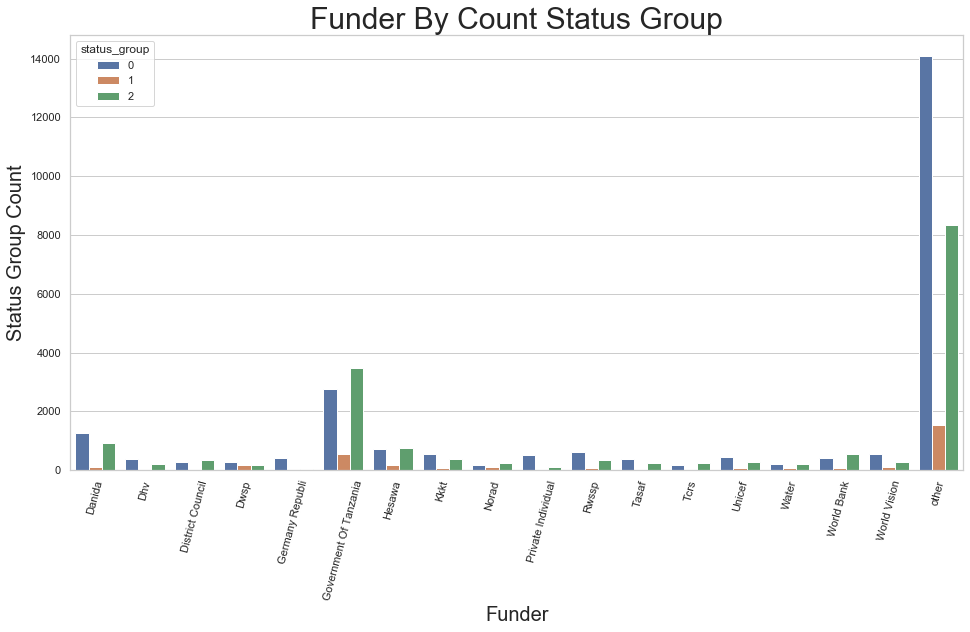

posx and posy should be finite values
posx and posy should be finite values


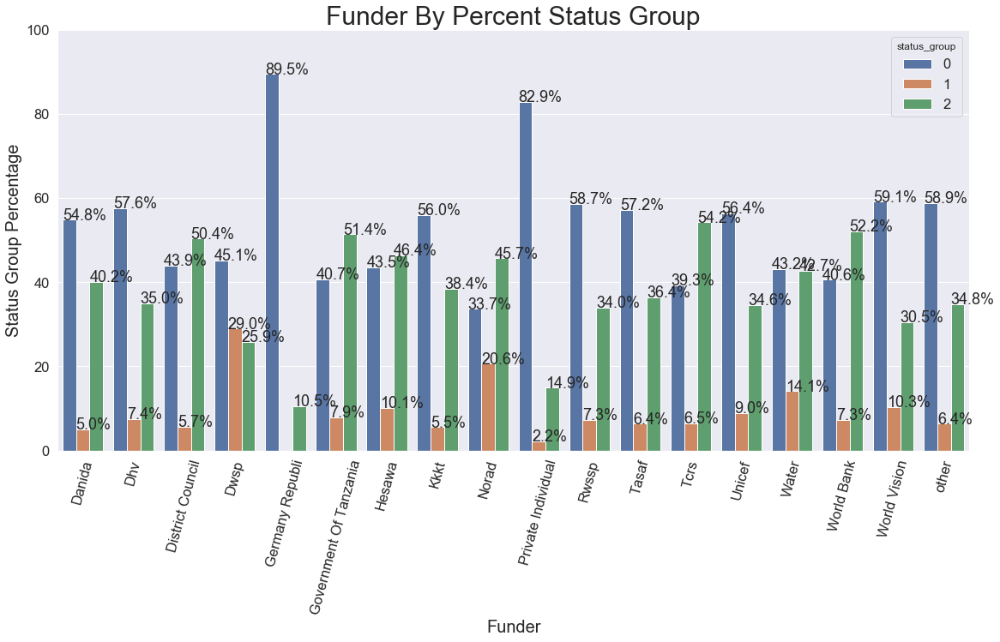

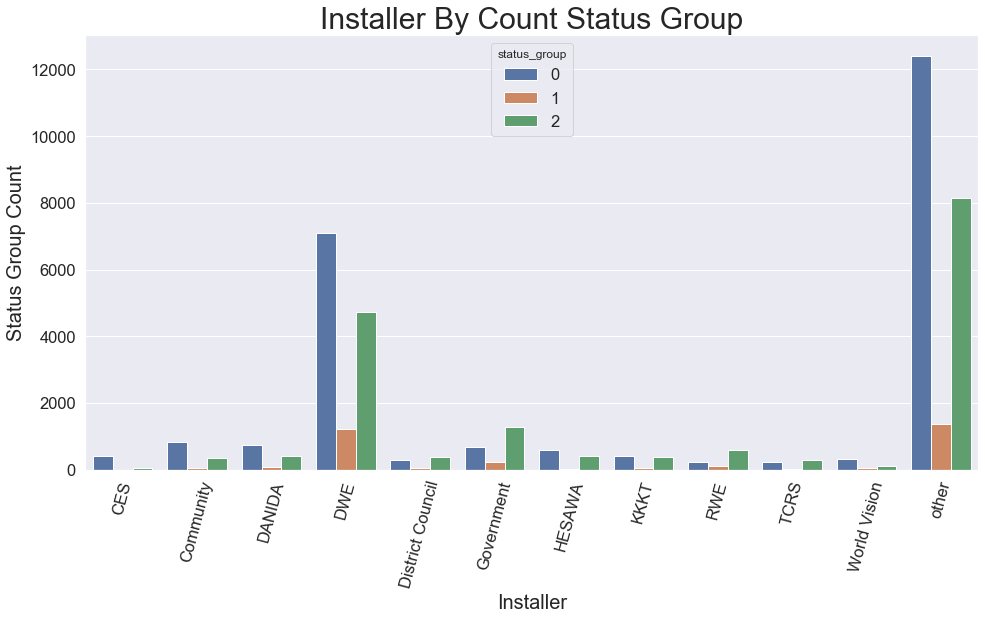

posx and posy should be finite values
posx and posy should be finite values


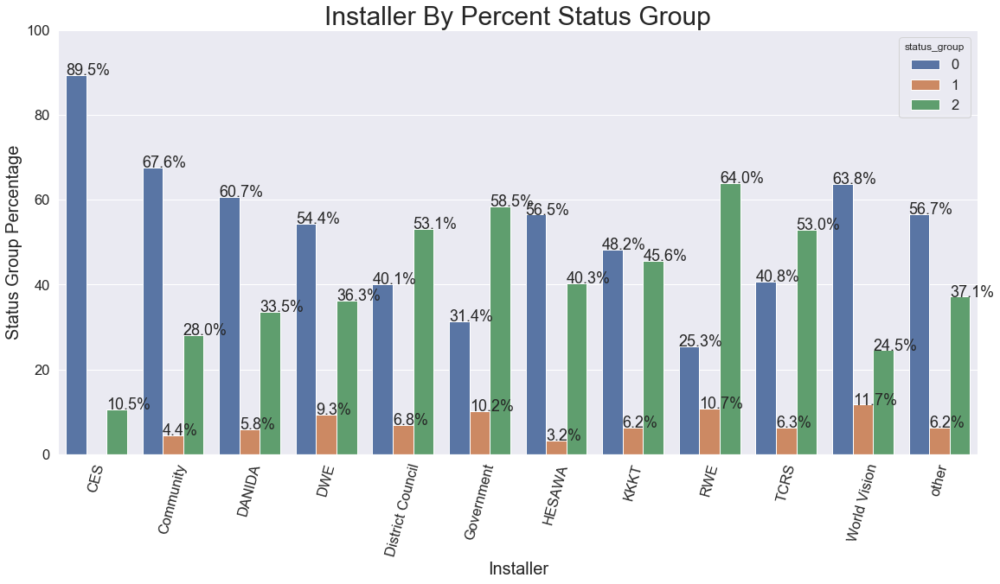

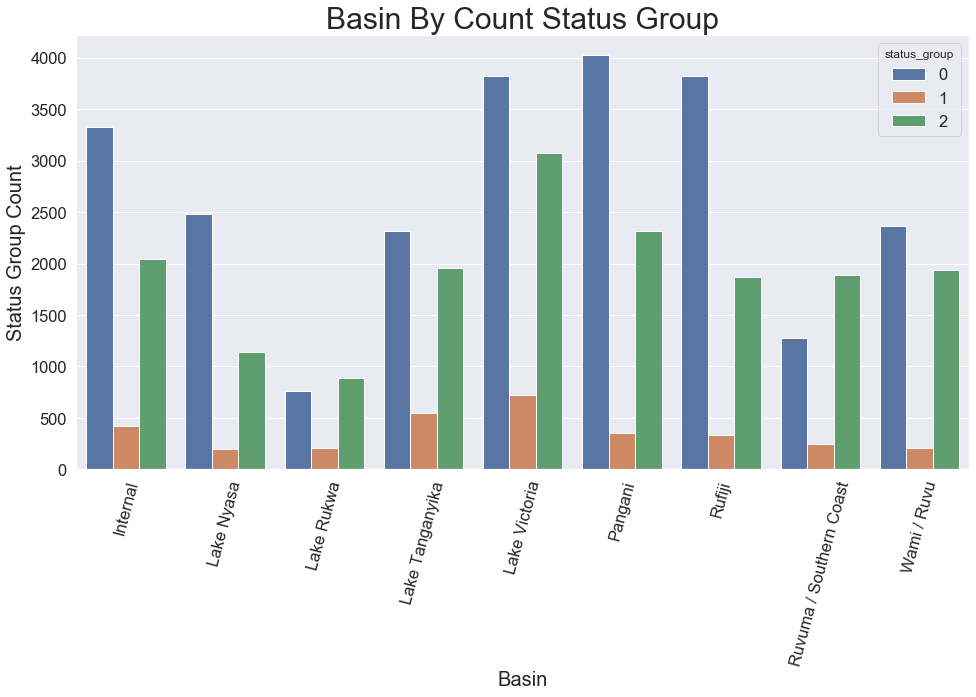

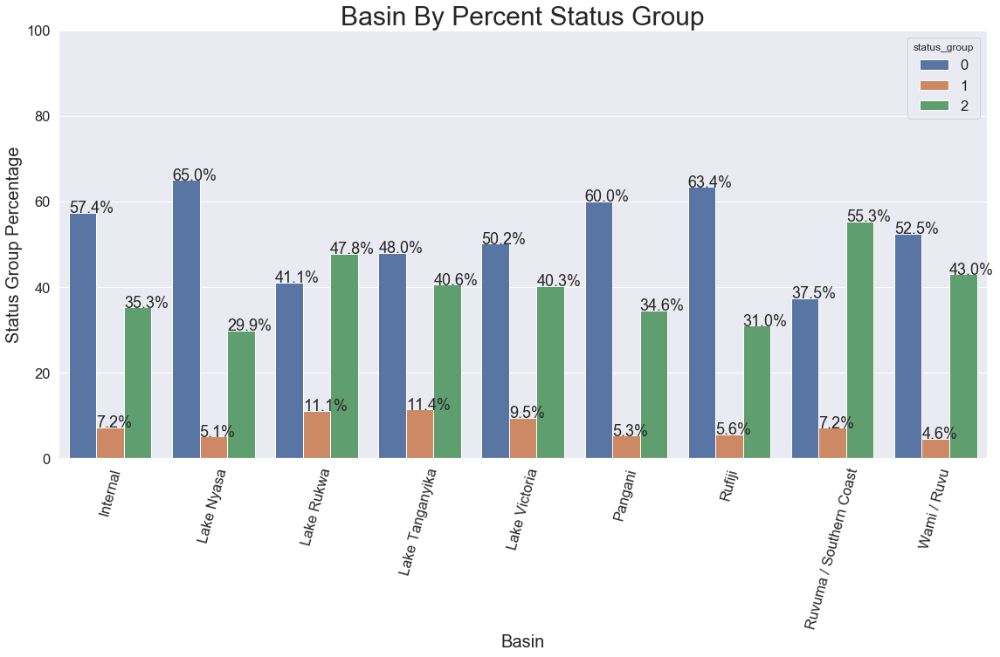

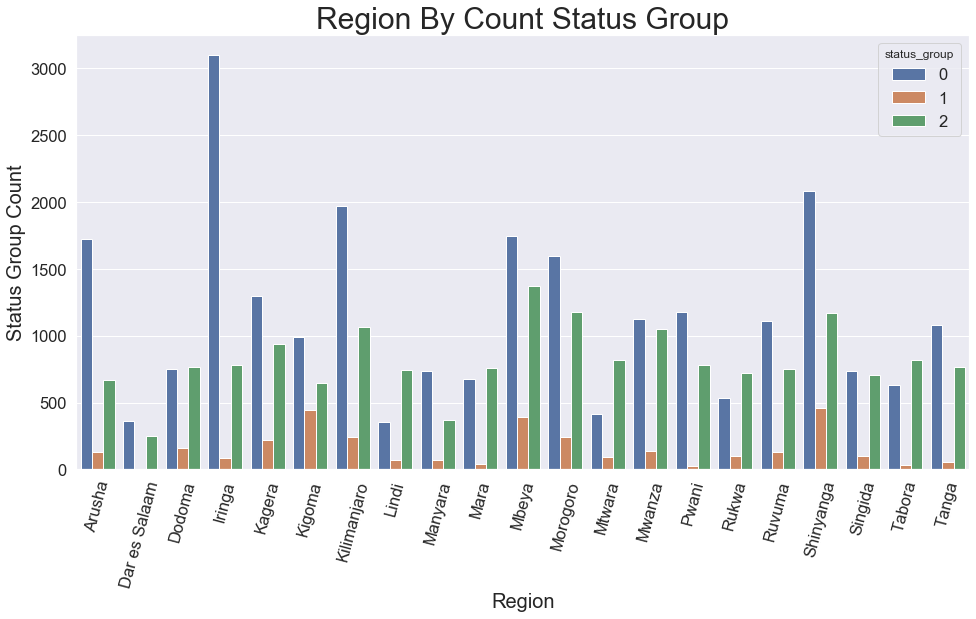

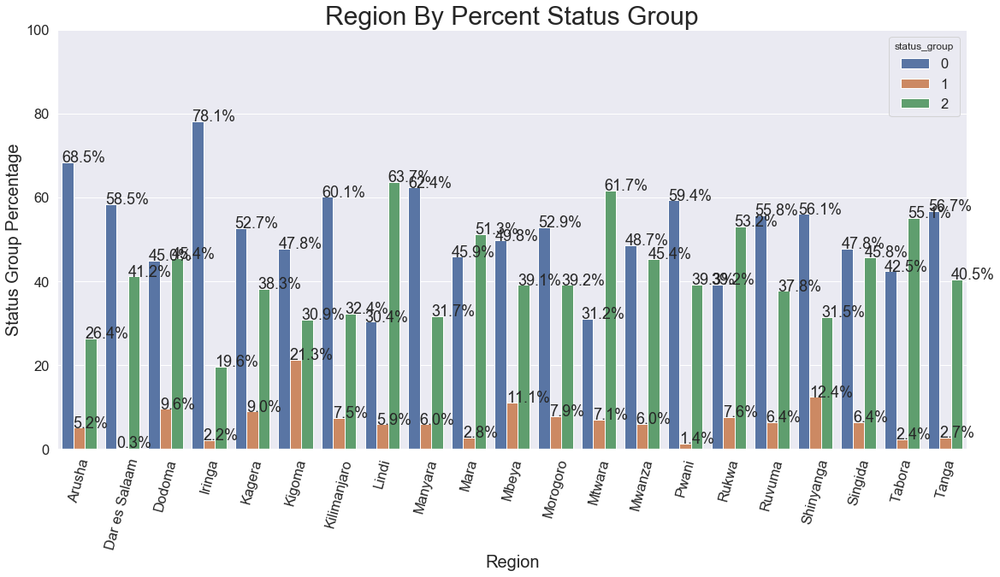

...

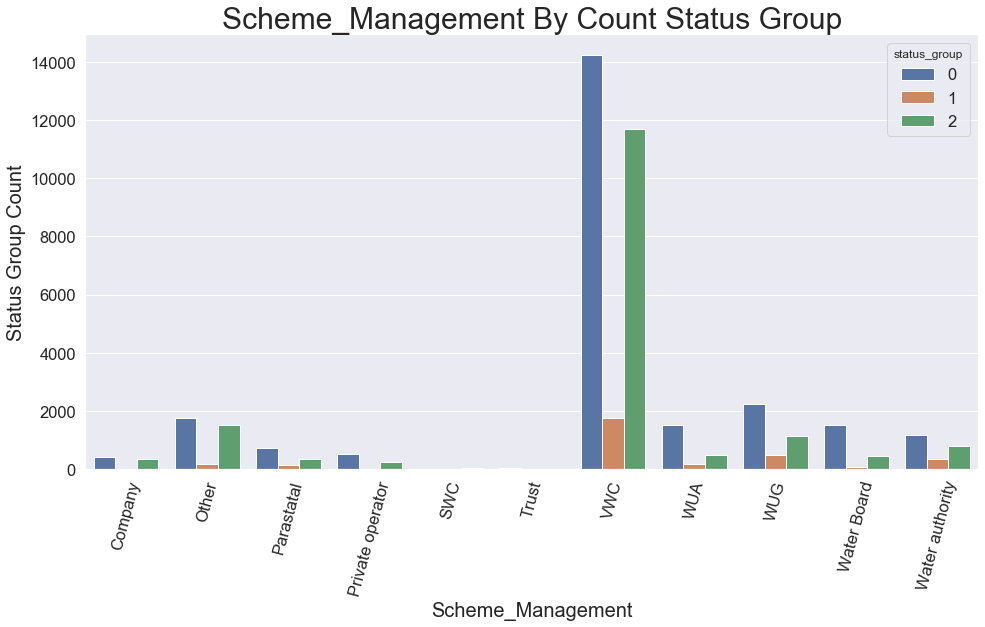

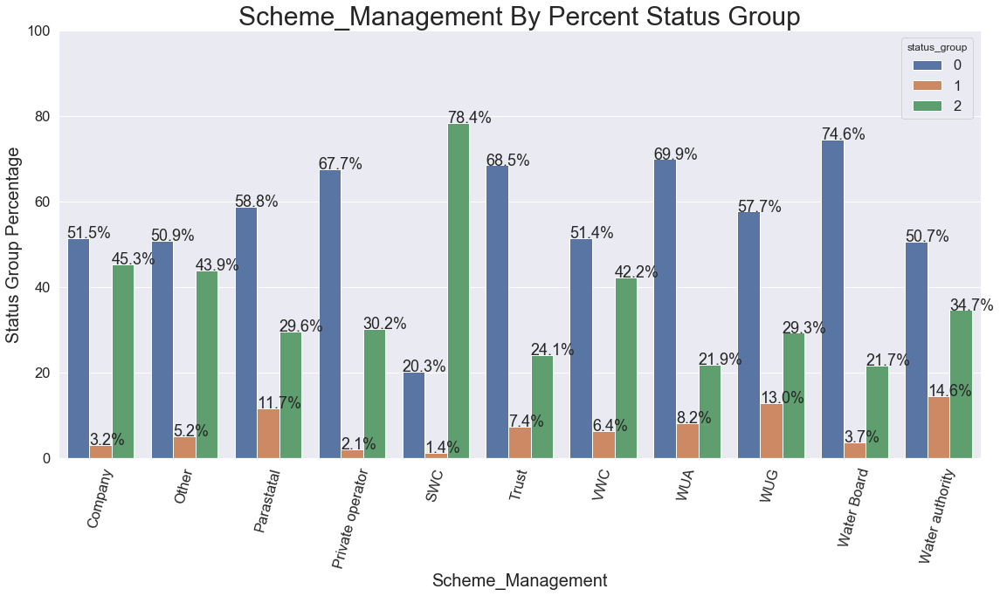

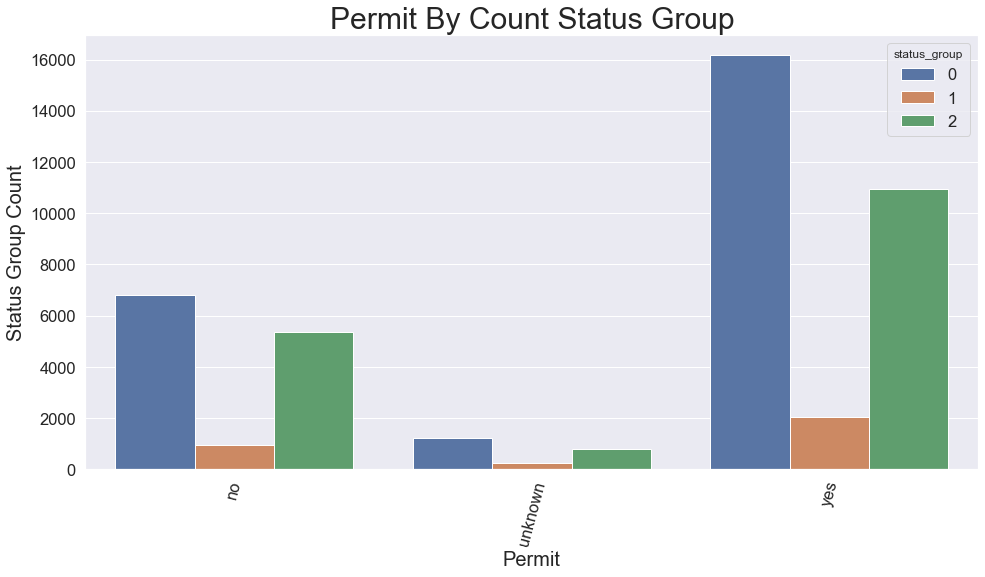

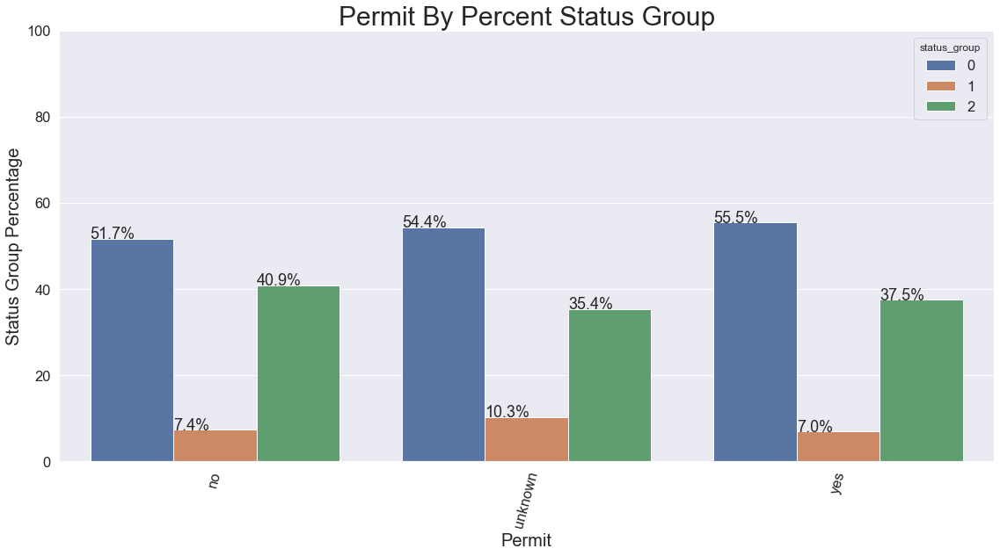

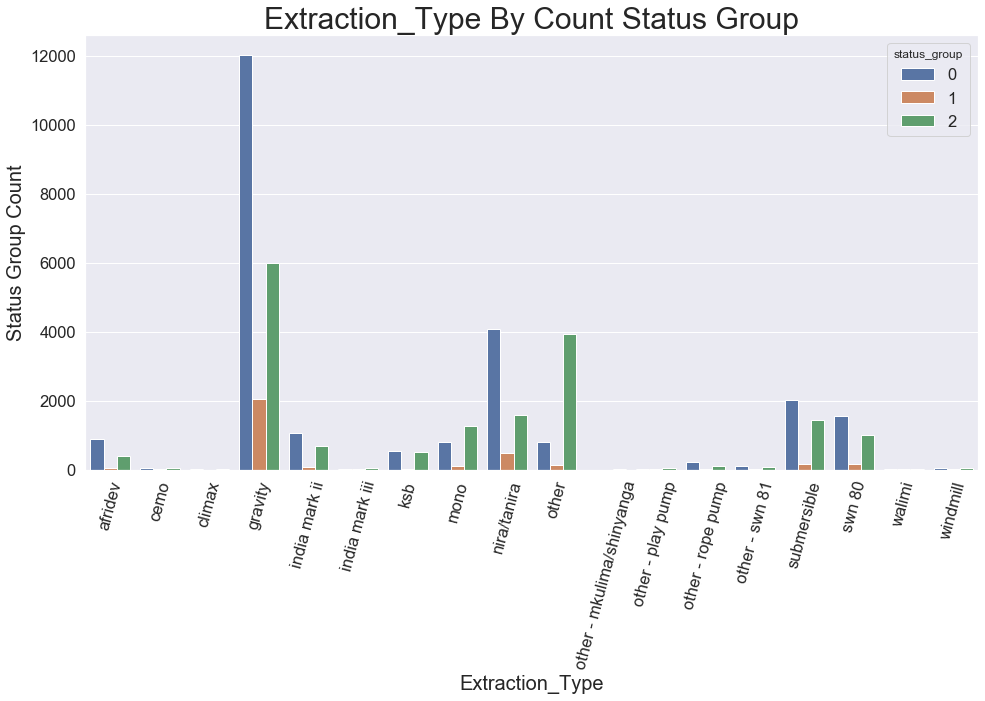

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


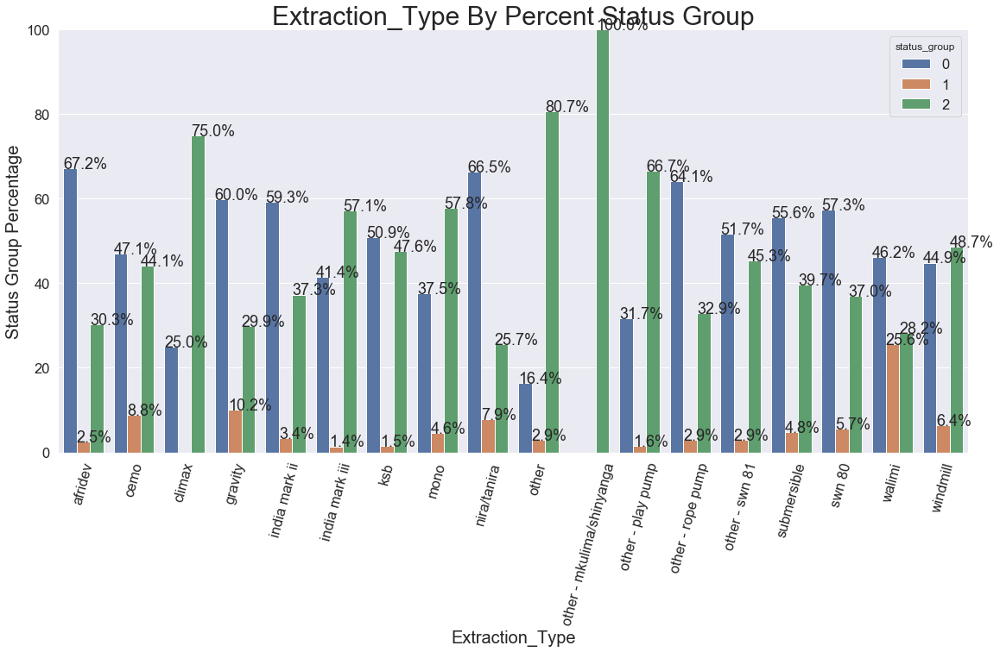

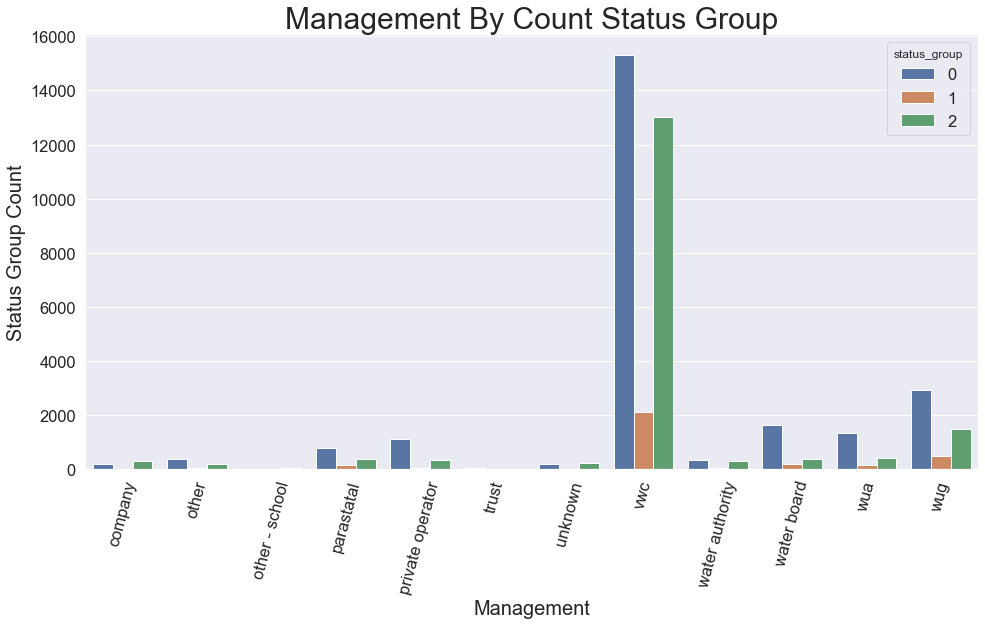

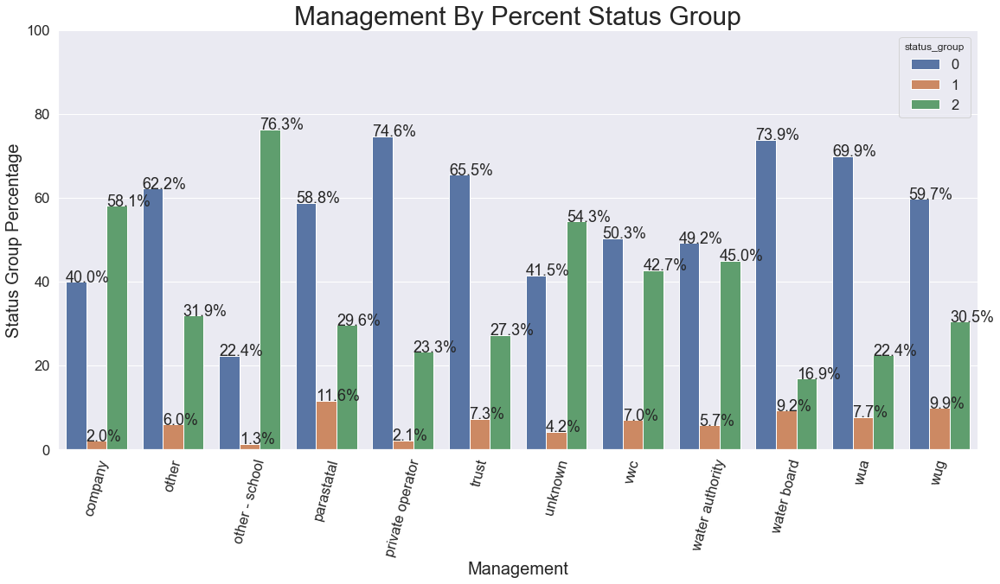

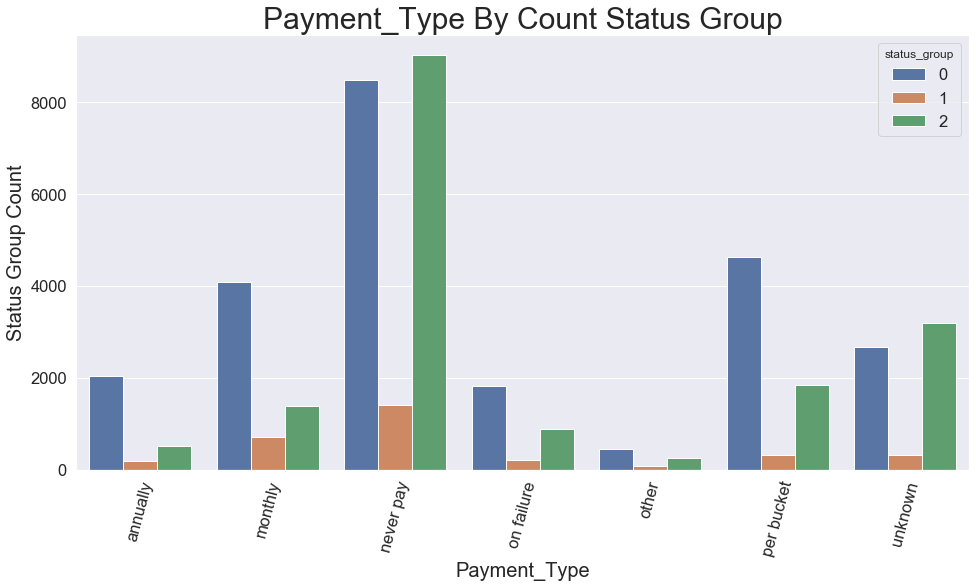

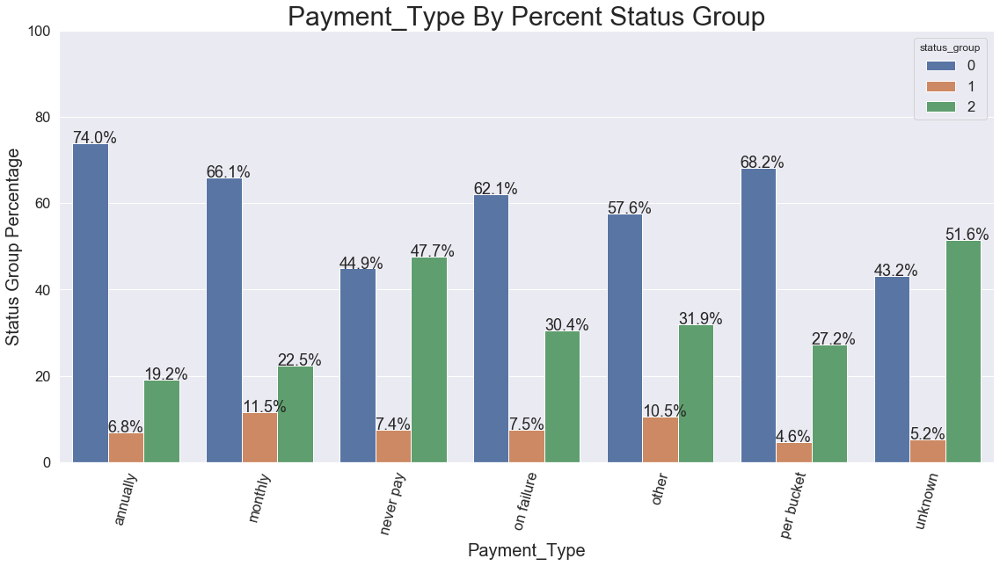

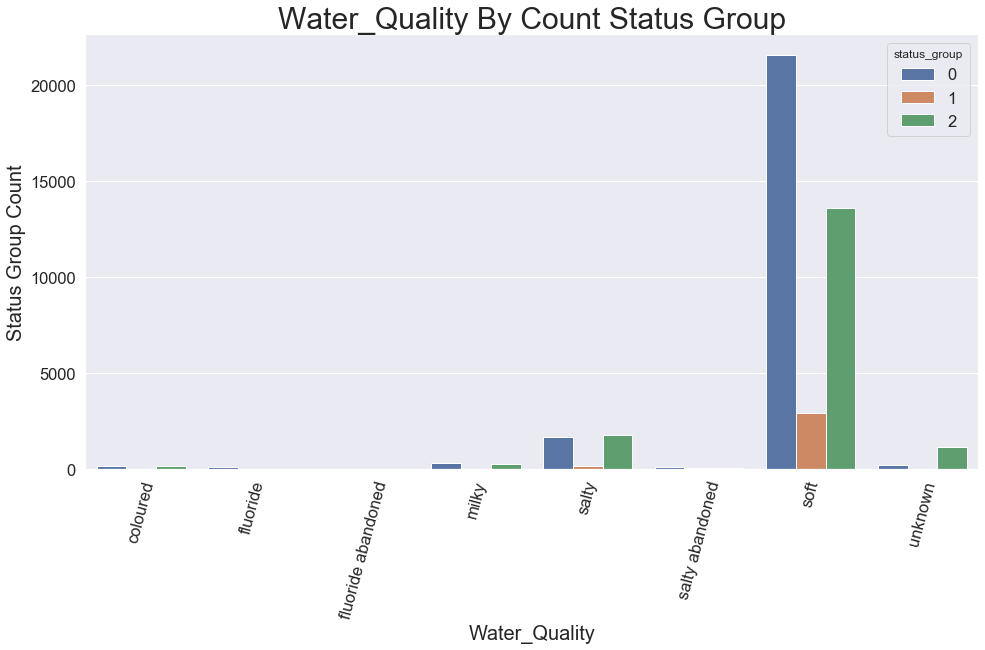

posx and posy should be finite values
posx and posy should be finite values


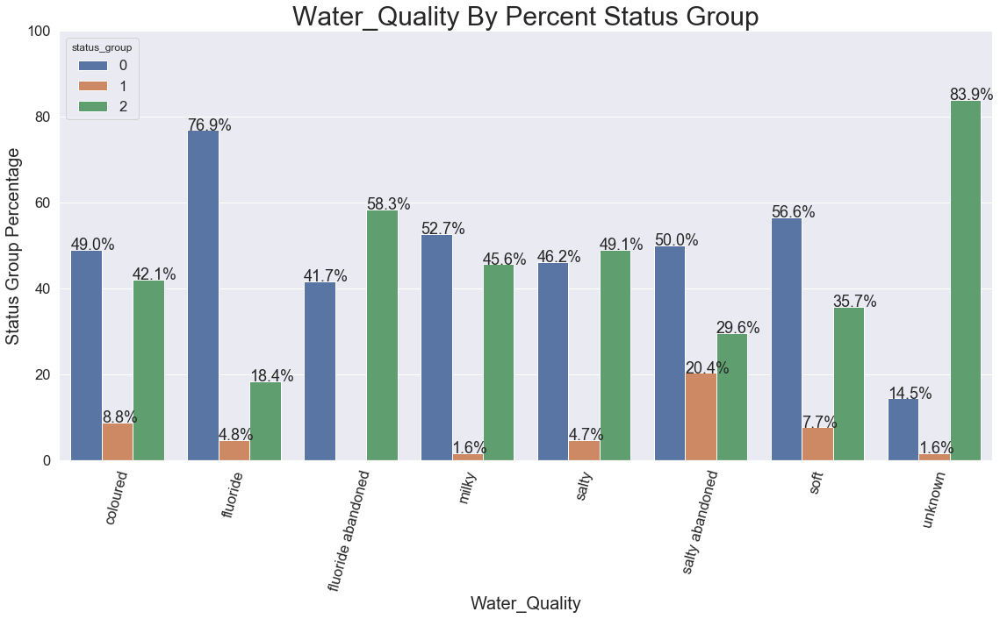

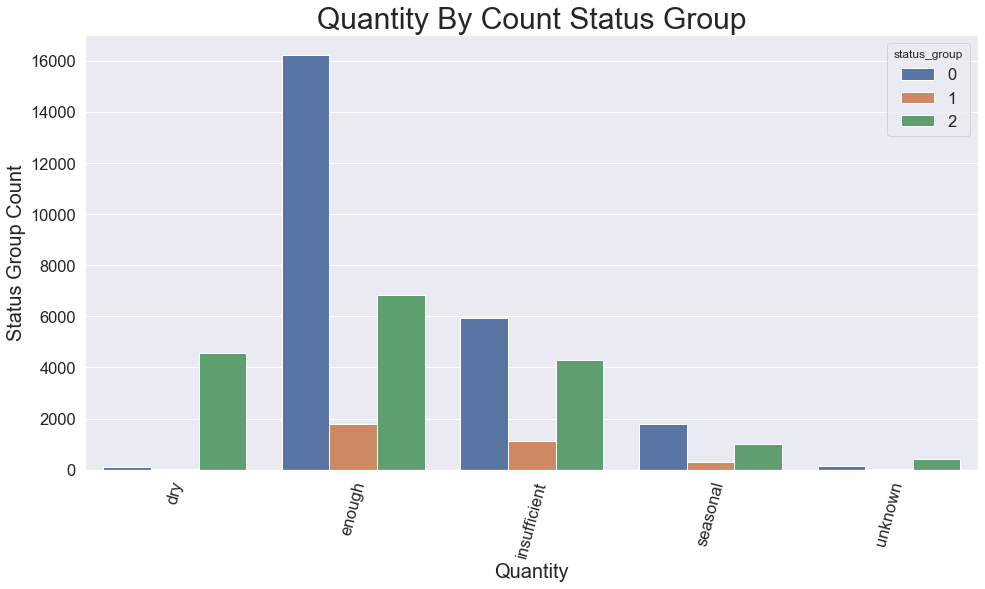

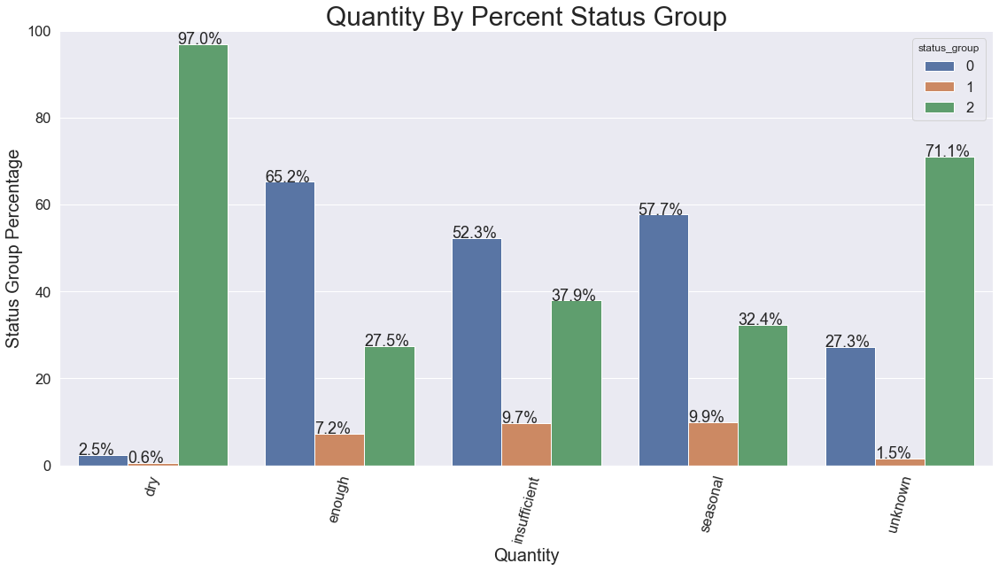

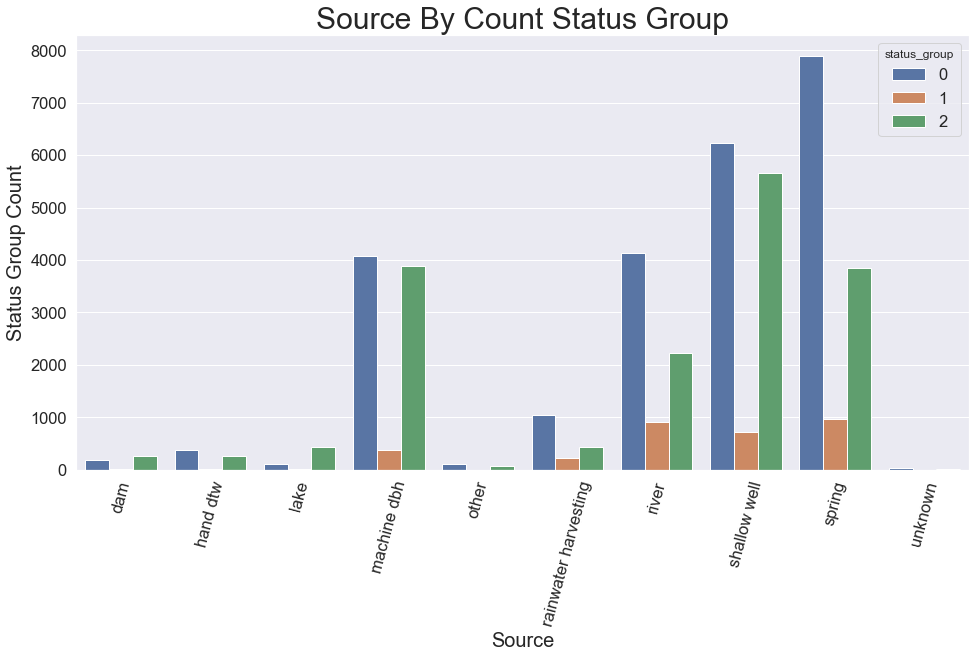

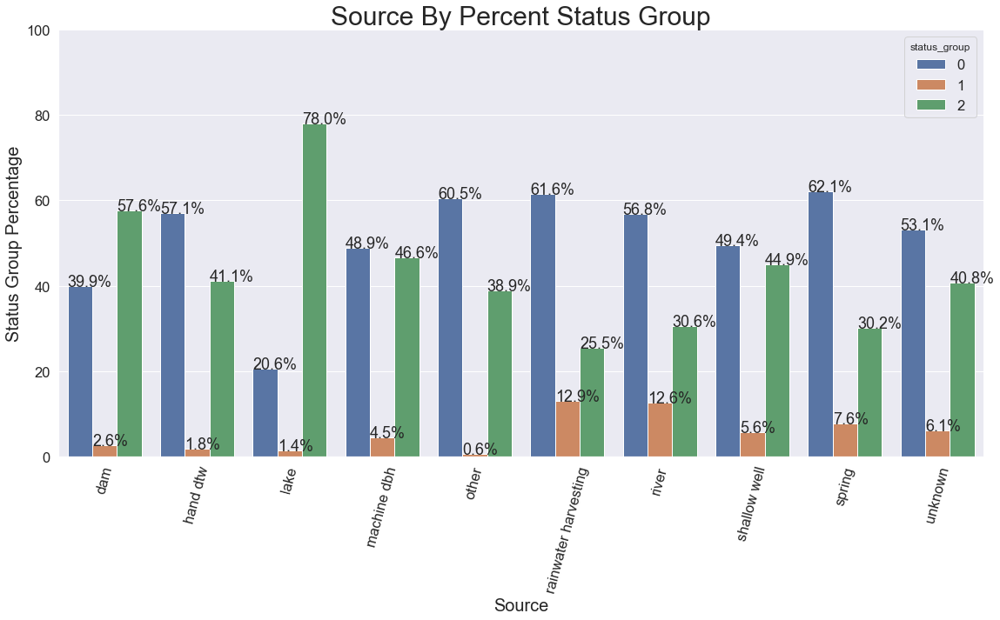

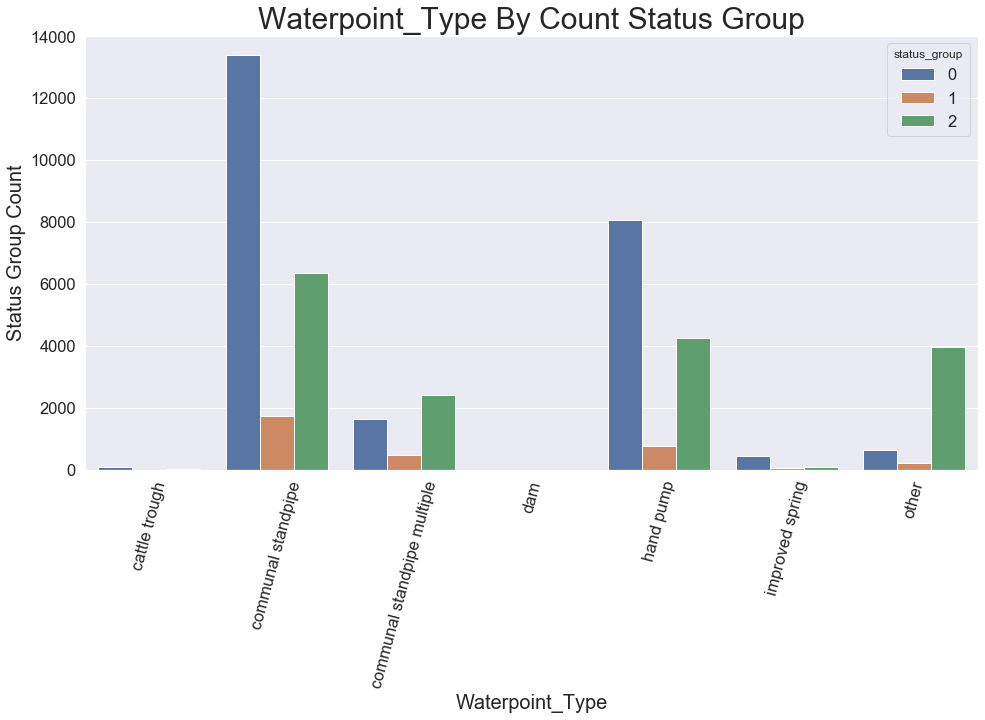

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


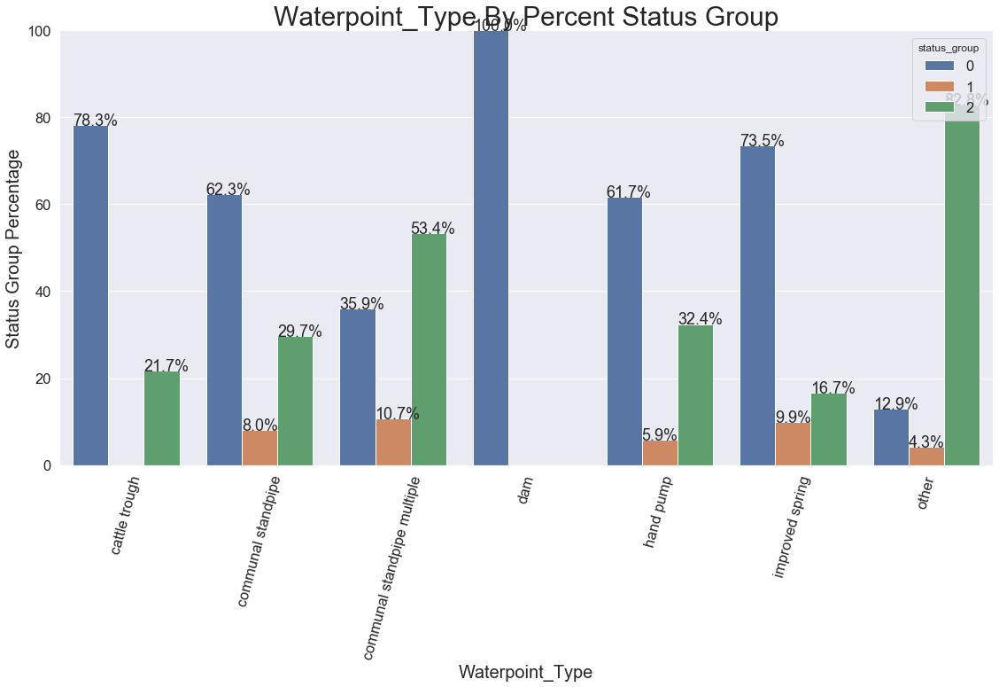

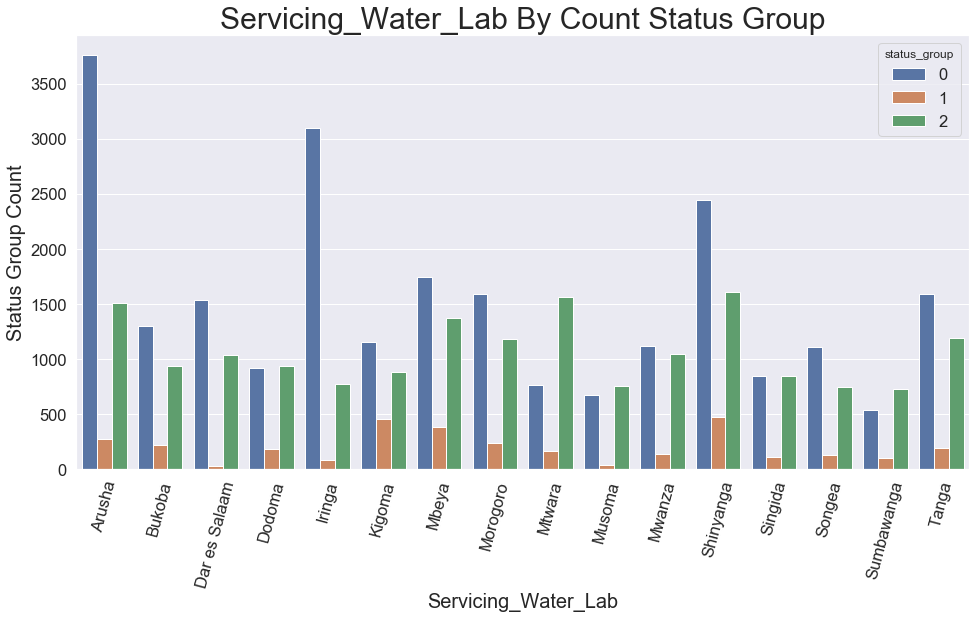

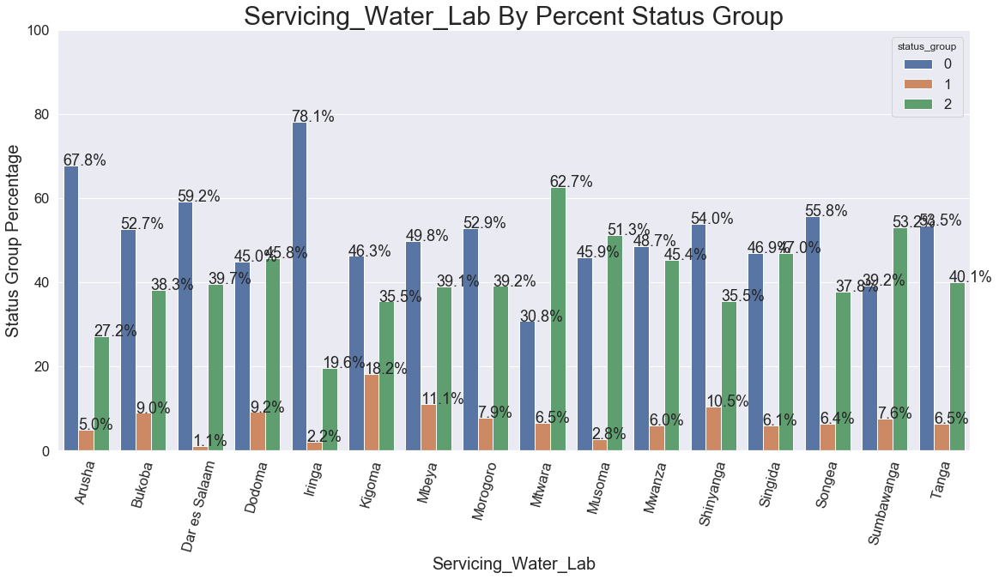

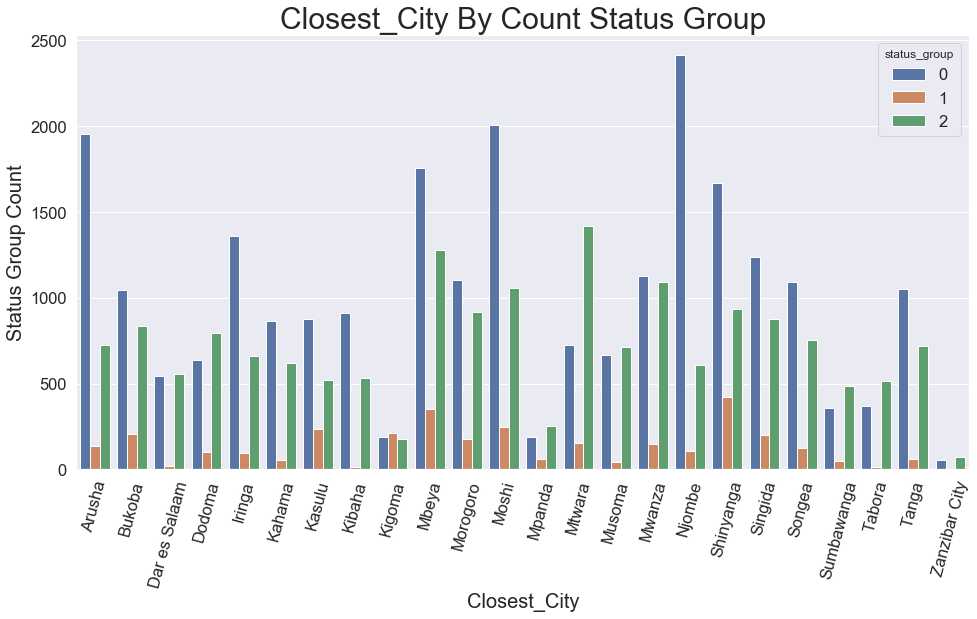

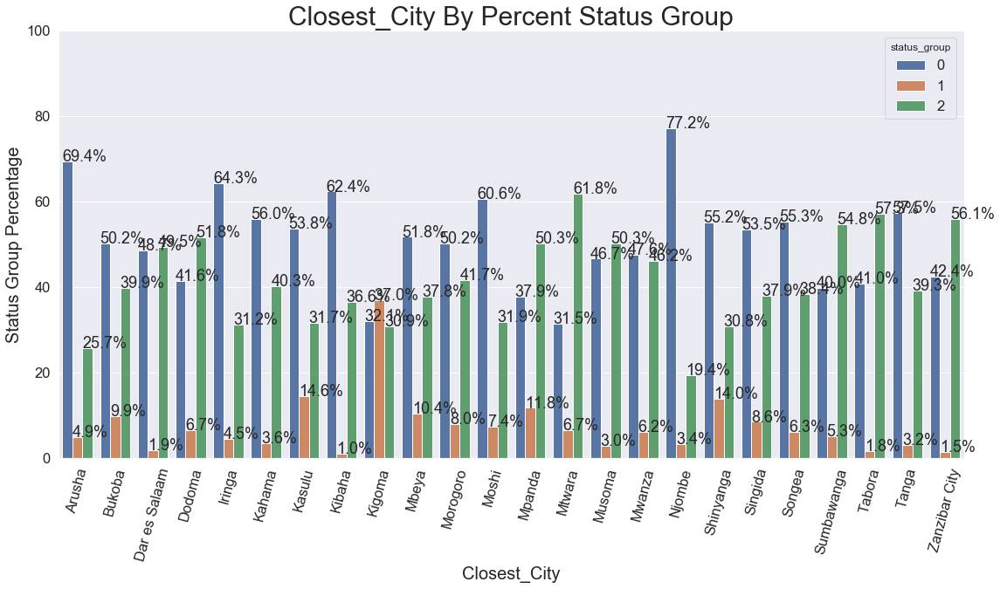

In [160]:
for col in cat_cols.drop('lga'):
    plotting_counts(train_df, col)
    plotting_percentages(train_df, col)

In [161]:
def plot_num_cols(df, col, target='status_group'):

    g = sns.catplot(x="status_group", y=col, data=train_df, kind='boxen', height=7, aspect=2)
    
    plt.suptitle(f'{col.title()} and {target.title()}', fontsize=30, y=1.05)

In [162]:
num_cols = train_df.select_dtypes('number').columns
num_cols = num_cols.drop('status_group')
num_cols

Index(['amount_tsh', 'gps_height', 'longitude', 'latitude', 'population',
       'construction_year', 'lab_distance', 'city_distance'],
      dtype='object')

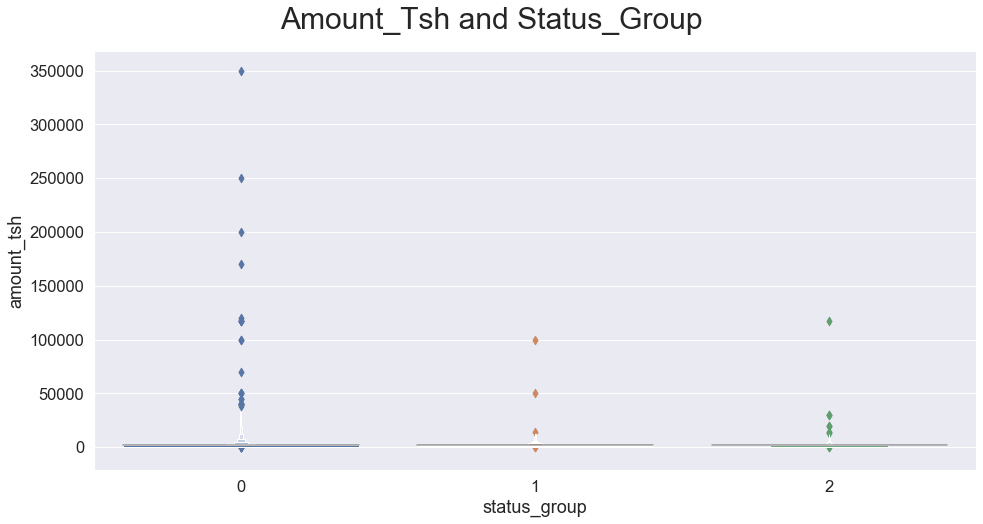

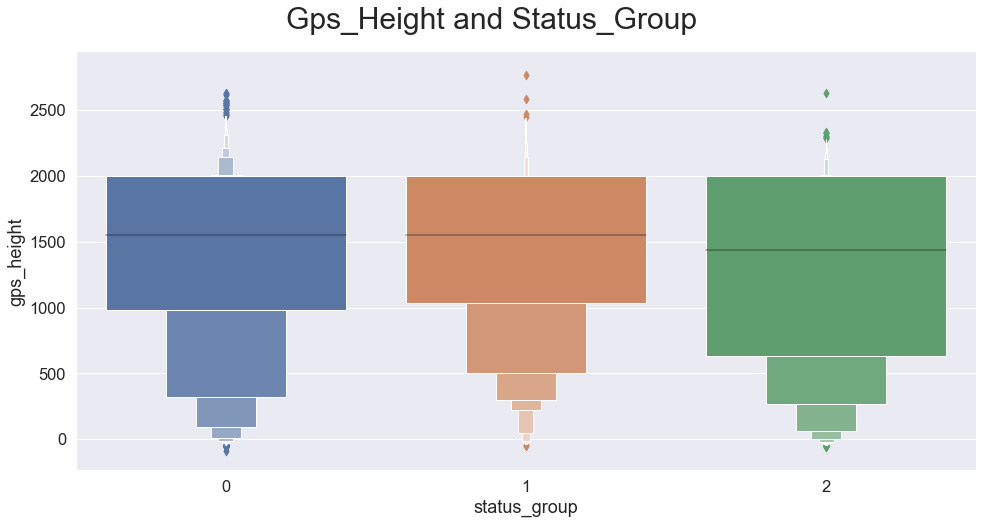

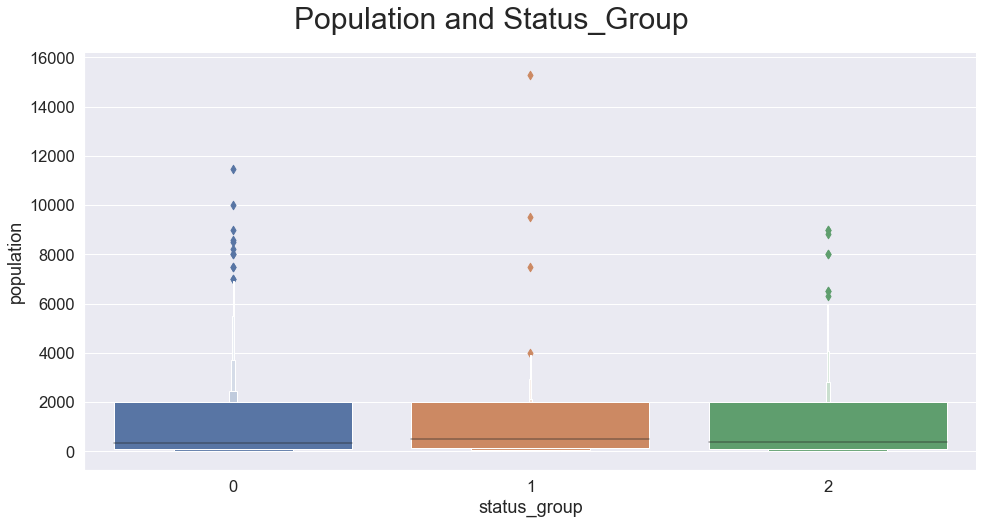

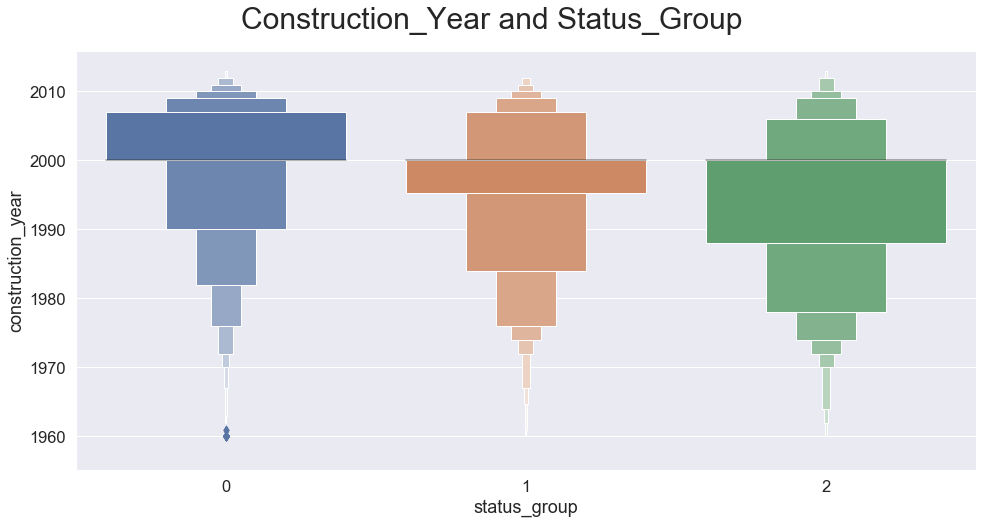

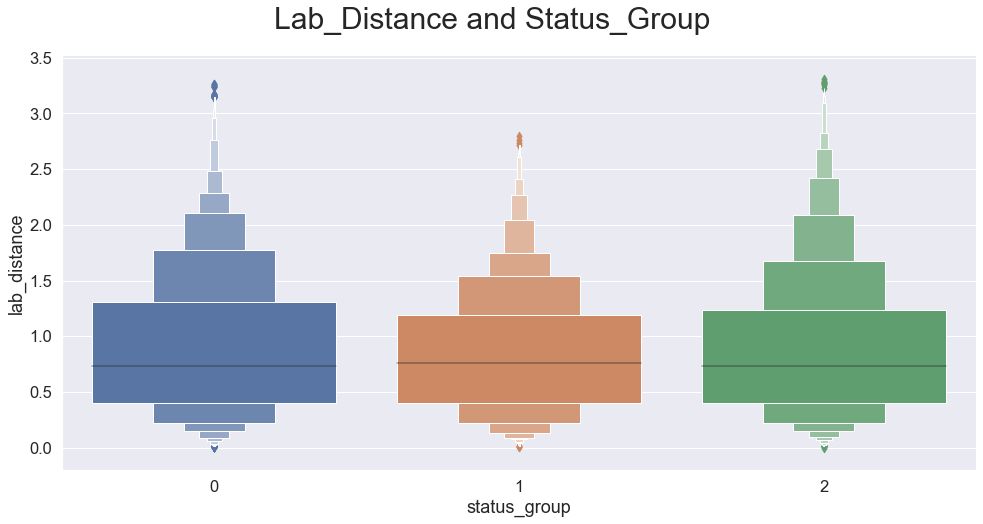

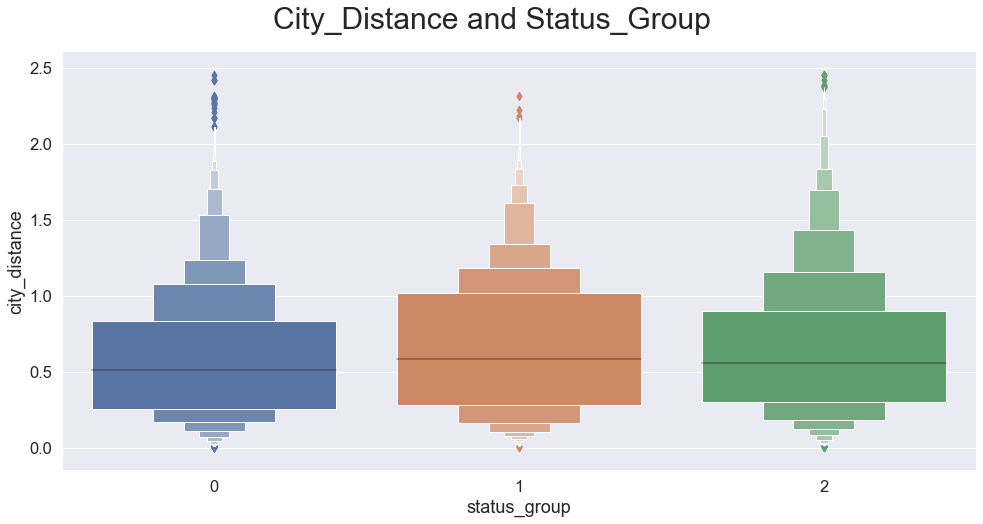

In [163]:
for col in num_cols.drop(['longitude', 'latitude']):
    plot_num_cols(train_df, col)

# MODEL PREPARATION

- One hot encode
- scale - standard scaler, robust scaler(median)
- make dummy model
- write function for evaluation, discuss how I will evaluate my models going forward
- logistic regression
- random forest
- either boosted or SVM or stacked
- smote - after a smart model to discuss the difference with smote


- What is the grid search params thing?
- Can I customize the columns for different models?
- Help with logistic regression: Assumptions, tuning, do I still need to remove unhelpful features and such? How would I identify those features?

## One Hot Encode

In [164]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)

In [165]:
ohe_train = encoder.fit_transform(X_train[cat_cols])
ohe_test = encoder.transform(X_test[cat_cols])
ohe_comp = encoder.transform(compdf[cat_cols])

In [166]:
col_names = encoder.get_feature_names(cat_cols)

In [167]:
ohe_train_df = pd.DataFrame(ohe_train, columns=col_names, index=X_train.index)
ohe_test_df = pd.DataFrame(ohe_test, columns=col_names, index=X_test.index)
ohe_comp_df = pd.DataFrame(ohe_comp, columns=col_names, index=compdf.index)

## Scaling

In [168]:
from sklearn.preprocessing import QuantileTransformer
qt = QuantileTransformer(random_state=123)

In [169]:
qt_train = qt.fit_transform(X_train[num_cols])
qt_test = qt.transform(X_test[num_cols])
qt_comp = qt.transform(compdf[num_cols])

In [170]:
qt_train_df = pd.DataFrame(qt_train, columns=X_train[num_cols].columns, index=X_train.index)
qt_test_df = pd.DataFrame(qt_test, columns=X_train[num_cols].columns, index=X_test.index)
qt_comp_df = pd.DataFrame(qt_comp, columns=X_train[num_cols].columns, index=compdf.index)

In [171]:
X_train_tf = pd.concat([qt_train_df, ohe_train_df], axis=1)
X_test_tf = pd.concat([qt_test_df, ohe_test_df], axis=1)
comp_tf = pd.concat([qt_comp_df, ohe_comp_df], axis=1)

In [172]:
X_train_tf.head()

,amount_tsh,gps_height,longitude,latitude,population,construction_year,lab_distance,city_distance,funder_Danida,funder_Dhv,funder_District Council,funder_Dwsp,funder_Germany Republi,funder_Government Of Tanzania,funder_Hesawa,funder_Kkkt,funder_Norad,funder_Private Individual,funder_Rwssp,funder_Tasaf,funder_Tcrs,funder_Unicef,funder_Water,funder_World Bank,funder_World Vision,funder_other,installer_CES,installer_Community,installer_DANIDA,installer_DWE,installer_District Council,installer_Government,installer_HESAWA,installer_KKKT,installer_RWE,installer_TCRS,installer_World Vision,installer_other,basin_Internal,basin_Lake Nyasa,...,servicing_water_lab_Arusha,servicing_water_lab_Bukoba,servicing_water_lab_Dar es Salaam,servicing_water_lab_Dodoma,servicing_water_lab_Iringa,servicing_water_lab_Kigoma,servicing_water_lab_Mbeya,servicing_water_lab_Morogoro,servicing_water_lab_Mtwara,servicing_water_lab_Musoma,servicing_water_lab_Mwanza,servicing_water_lab_Shinyanga,servicing_water_lab_Singida,servicing_water_lab_Songea,servicing_water_lab_Sumbawanga,servicing_water_lab_Tanga,closest_city_Arusha,closest_city_Bukoba,closest_city_Dar es Salaam,closest_city_Dodoma,closest_city_Iringa,closest_city_Kahama,closest_city_Kasulu,closest_city_Kibaha,closest_city_Kigoma,closest_city_Mbeya,closest_city_Morogoro,closest_city_Moshi,closest_city_Mpanda,closest_city_Mtwara,closest_city_Musoma,closest_city_Mwanza,closest_city_Njombe,closest_city_Shinyanga,closest_city_Singida,closest_city_Songea,closest_city_Sumbawanga,closest_city_Tabora,closest_city_Tanga,closest_city_Zanzibar City
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2218,0.614,0.188,0.847,0.581,0.280,0.002,0.728,0.901,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000
41466,0.614,0.484,0.361,0.943,0.420,0.892,0.303,0.443,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
49804,0.614,0.258,0.706,0.699,0.553,0.968,0.142,0.218,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
65860,0.614,0.807,0.303,0.195,0.811,0.499,0.114,0.177,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,...,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
15139,0.614,0.419,0.866,0.569,0.000,0.004,0.602,0.767,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.0

In [173]:
X_test_tf.head()

,amount_tsh,gps_height,longitude,latitude,population,construction_year,lab_distance,city_distance,funder_Danida,funder_Dhv,funder_District Council,funder_Dwsp,funder_Germany Republi,funder_Government Of Tanzania,funder_Hesawa,funder_Kkkt,funder_Norad,funder_Private Individual,funder_Rwssp,funder_Tasaf,funder_Tcrs,funder_Unicef,funder_Water,funder_World Bank,funder_World Vision,funder_other,installer_CES,installer_Community,installer_DANIDA,installer_DWE,installer_District Council,installer_Government,installer_HESAWA,installer_KKKT,installer_RWE,installer_TCRS,installer_World Vision,installer_other,basin_Internal,basin_Lake Nyasa,...,servicing_water_lab_Arusha,servicing_water_lab_Bukoba,servicing_water_lab_Dar es Salaam,servicing_water_lab_Dodoma,servicing_water_lab_Iringa,servicing_water_lab_Kigoma,servicing_water_lab_Mbeya,servicing_water_lab_Morogoro,servicing_water_lab_Mtwara,servicing_water_lab_Musoma,servicing_water_lab_Mwanza,servicing_water_lab_Shinyanga,servicing_water_lab_Singida,servicing_water_lab_Songea,servicing_water_lab_Sumbawanga,servicing_water_lab_Tanga,closest_city_Arusha,closest_city_Bukoba,closest_city_Dar es Salaam,closest_city_Dodoma,closest_city_Iringa,closest_city_Kahama,closest_city_Kasulu,closest_city_Kibaha,closest_city_Kigoma,closest_city_Mbeya,closest_city_Morogoro,closest_city_Moshi,closest_city_Mpanda,closest_city_Mtwara,closest_city_Musoma,closest_city_Mwanza,closest_city_Njombe,closest_city_Shinyanga,closest_city_Singida,closest_city_Songea,closest_city_Sumbawanga,closest_city_Tabora,closest_city_Tanga,closest_city_Zanzibar City
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
61898,0.614,0.807,0.217,0.128,0.811,0.499,0.435,0.592,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,1.000,...,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
74121,0.614,0.807,0.158,0.792,0.811,0.499,0.690,0.562,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
6464,0.998,0.553,0.429,0.178,0.206,0.025,0.889,0.309,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
46594,0.018,0.302,0.662,0.692,0.320,0.499,0.101,0.156,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
54244,0.614,0.807,0.312,0.763,0.811,0.499,0.304,0.444,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,1.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.0

In [174]:
comp_tf.head()

,amount_tsh,gps_height,longitude,latitude,population,construction_year,lab_distance,city_distance,funder_Danida,funder_Dhv,funder_District Council,funder_Dwsp,funder_Germany Republi,funder_Government Of Tanzania,funder_Hesawa,funder_Kkkt,funder_Norad,funder_Private Individual,funder_Rwssp,funder_Tasaf,funder_Tcrs,funder_Unicef,funder_Water,funder_World Bank,funder_World Vision,funder_other,installer_CES,installer_Community,installer_DANIDA,installer_DWE,installer_District Council,installer_Government,installer_HESAWA,installer_KKKT,installer_RWE,installer_TCRS,installer_World Vision,installer_other,basin_Internal,basin_Lake Nyasa,...,servicing_water_lab_Arusha,servicing_water_lab_Bukoba,servicing_water_lab_Dar es Salaam,servicing_water_lab_Dodoma,servicing_water_lab_Iringa,servicing_water_lab_Kigoma,servicing_water_lab_Mbeya,servicing_water_lab_Morogoro,servicing_water_lab_Mtwara,servicing_water_lab_Musoma,servicing_water_lab_Mwanza,servicing_water_lab_Shinyanga,servicing_water_lab_Singida,servicing_water_lab_Songea,servicing_water_lab_Sumbawanga,servicing_water_lab_Tanga,closest_city_Arusha,closest_city_Bukoba,closest_city_Dar es Salaam,closest_city_Dodoma,closest_city_Iringa,closest_city_Kahama,closest_city_Kasulu,closest_city_Kibaha,closest_city_Kigoma,closest_city_Mbeya,closest_city_Morogoro,closest_city_Moshi,closest_city_Mpanda,closest_city_Mtwara,closest_city_Musoma,closest_city_Mwanza,closest_city_Njombe,closest_city_Shinyanga,closest_city_Singida,closest_city_Songea,closest_city_Sumbawanga,closest_city_Tabora,closest_city_Tanga,closest_city_Zanzibar City
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
50785,0.614,0.635,0.536,0.637,0.478,0.987,0.831,0.779,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,...,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000
51630,0.614,0.524,0.662,0.761,0.459,0.499,0.020,0.031,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
17168,0.614,0.524,0.475,0.504,0.553,0.935,0.094,0.146,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000
45559,0.614,0.107,0.845,0.128,0.420,0.162,0.966,0.999,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
49871,0.194,0.371,0.514,0.018,0.206,0.499,0.478,0.640,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.

## SMOTE

In [175]:
import six
import sys
sys.modules['sklearn.externals.six'] = six
from imblearn.over_sampling import SMOTENC

In [176]:
cat_cols_tf = list(X_train_tf.columns)
print('Starting lenghth of all columns:', len(cat_cols_tf))
print('Length of num_cols:', len(num_cols))
for col in num_cols:
    cat_cols_tf.remove(col)
print('Length of categorical columns after OHE:', len(cat_cols_tf))

Starting lenghth of all columns: 316
Length of num_cols: 8
Length of categorical columns after OHE: 308


In [177]:
mask = []
for col in X_train_tf.columns:
    if col in cat_cols_tf:
        mask.append(True)
    else:
        mask.append(False)

In [178]:
y_train.value_counts(1)

0   0.543
2   0.384
1   0.073
Name: status_group, dtype: float64

In [179]:
smote = SMOTENC(categorical_features=mask, random_state=123, n_jobs=-1)
X_train_smote, y_train_smote = smote.fit_resample(X_train_tf, y_train)

In [180]:
y_train_smote = pd.Series(y_train_smote)

In [181]:
y_train_smote.value_counts(1)

2   0.333
1   0.333
0   0.333
dtype: float64

In [182]:
X_train_smote = pd.DataFrame(X_train_smote, columns=X_train_tf.columns)
X_train_smote.head()

,amount_tsh,gps_height,longitude,latitude,population,construction_year,lab_distance,city_distance,funder_Danida,funder_Dhv,funder_District Council,funder_Dwsp,funder_Germany Republi,funder_Government Of Tanzania,funder_Hesawa,funder_Kkkt,funder_Norad,funder_Private Individual,funder_Rwssp,funder_Tasaf,funder_Tcrs,funder_Unicef,funder_Water,funder_World Bank,funder_World Vision,funder_other,installer_CES,installer_Community,installer_DANIDA,installer_DWE,installer_District Council,installer_Government,installer_HESAWA,installer_KKKT,installer_RWE,installer_TCRS,installer_World Vision,installer_other,basin_Internal,basin_Lake Nyasa,...,servicing_water_lab_Arusha,servicing_water_lab_Bukoba,servicing_water_lab_Dar es Salaam,servicing_water_lab_Dodoma,servicing_water_lab_Iringa,servicing_water_lab_Kigoma,servicing_water_lab_Mbeya,servicing_water_lab_Morogoro,servicing_water_lab_Mtwara,servicing_water_lab_Musoma,servicing_water_lab_Mwanza,servicing_water_lab_Shinyanga,servicing_water_lab_Singida,servicing_water_lab_Songea,servicing_water_lab_Sumbawanga,servicing_water_lab_Tanga,closest_city_Arusha,closest_city_Bukoba,closest_city_Dar es Salaam,closest_city_Dodoma,closest_city_Iringa,closest_city_Kahama,closest_city_Kasulu,closest_city_Kibaha,closest_city_Kigoma,closest_city_Mbeya,closest_city_Morogoro,closest_city_Moshi,closest_city_Mpanda,closest_city_Mtwara,closest_city_Musoma,closest_city_Mwanza,closest_city_Njombe,closest_city_Shinyanga,closest_city_Singida,closest_city_Songea,closest_city_Sumbawanga,closest_city_Tabora,closest_city_Tanga,closest_city_Zanzibar City
0,0.614,0.188,0.847,0.581,0.280,0.002,0.728,0.901,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000
1,0.614,0.484,0.361,0.943,0.420,0.892,0.303,0.443,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2,0.614,0.258,0.706,0.699,0.553,0.968,0.142,0.218,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3,0.614,0.807,0.303,0.195,0.811,0.499,0.114,0.177,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,...,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,0.614,0.419,0.866,0.569,0.000,0.004,0.602,0.767,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00

In [183]:
print(X_train_smote.shape)
print(y_train_smote.shape)

(72582, 316)
(72582,)


In [184]:
# X_train_smote.to_csv('XTrainSMOTE.csv')
# y_train_smote.to_csv('yTrainSMOTE.csv')

## Model Evaluation Function

In [ ]:
# first line what this func does

In [185]:
import sklearn.metrics as metrics
from yellowbrick.classifier import ROCAUC

In [ ]:
def make_classification_report(model, y_true, x_test, title=''):
    
    '''
    Generate and return the classification report for a model.
    
    Args: 
        Model (classification model): SKlearn compatable model. Sentence explaining
        y_true (series or array): True labels to compare predictions
        x_test (dataframe or array): X data to generate predictions for
        title (str): Title for the report
        
    Returns:
        Report dict: Dictionary of the classification results
        
        '''
    y_preds = model.predict(x_test)
    print('__________________________________________________________________')
    print(f'CLASSIFICATION REPORT FOR: \n\t{title}')
    print('__________________________________________________________________')
    print('\n')
    report = metrics.classification_report(y_true, y_preds, 
                                    target_names=['functional', 'needs repair', 
                                             'nonfunctional'])
    report_dict = metrics.classification_report(y_true, y_preds, output_dict=True,
                            target_names=['functional', 'needs repair', 
                                     'nonfunctional'])
    report_dict['title'] = title
    print(report)
    print('__________________________________________________________________')
    return report_dict

In [187]:
def plot_confusion_matrix(model, X, y, title=''):
    fig = metrics.plot_confusion_matrix(model, X, y, normalize='true', cmap='Greens',
                                 display_labels=['functional', 'needs repair', 
                                             'nonfunctional'])
    plt.grid(False)
    plt.title(f'Confusion Matrix For {title}', fontdict={'fontsize':17})
    plt.show()
    print('__________________________________________________________________')
    return fig

In [188]:
def plot_ROC_curve(model, xtrain, ytrain, xtest, ytest):

    visualizer = ROCAUC(model, encoder={0: 'functional', 
                                        1: 'needs repair', 
                                        2: 'nonfunctional'})
    visualizer.fit(xtrain, ytrain)
    visualizer.score(xtest, ytest)
    visualizer.show()
    return visualizer

In [189]:
# write plot importance function
def plot_top_features(model, xtrain, title=''):
    importances = pd.Series(model.feature_importances_, index=xtrain.columns)
    importances.nlargest(20).sort_values().plot(kind='barh')
    plt.title(f'Most Important Features For {title}', fontdict={'fontsize':17})
    plt.xlabel('Importance')
    return importances

In [190]:
# def plot_bottom_features(model, xtrain, title=''):
#     importances = pd.Series(model.feature_importances_, index=xtrain.columns)
#     feat_importances.nlargest(20).sort_values().plot(kind='barh')
#     plt.title(f'Most Important Features For {title}', fontdict={'fontsize':17})
#     plt.xlabel('Importance')
#     return plt.show()

In [273]:
def evaluate_model(model, xtrain, ytrain, xtest, ytest, 
                   tree=False, title=''):
    report = make_classification_report(model, ytest, xtest, title=title)
    plot_confusion_matrix(model, xtest, ytest, title=title)
    plot_ROC_curve(model, xtrain, ytrain, xtest, ytest)
    if tree:
        plot_top_features(model, xtrain, title=title)
    return report

## Dummy Model

In [233]:
from sklearn.dummy import DummyClassifier
dummy_clf = DummyClassifier(strategy='stratified', random_state=123)
dummy_clf.fit(X_train_tf, y_train)

DummyClassifier(random_state=123, strategy='stratified')

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Dummy Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.54      0.53      0.53      8065
 needs repair       0.09      0.08      0.09      1079
nonfunctional       0.38      0.39      0.39      5706

     accuracy                           0.45     14850
    macro avg       0.34      0.34      0.34     14850
 weighted avg       0.45      0.45      0.45     14850

__________________________________________________________________


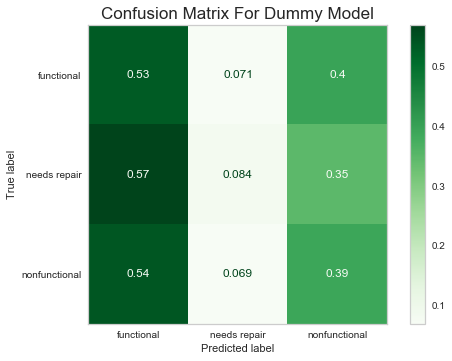

__________________________________________________________________


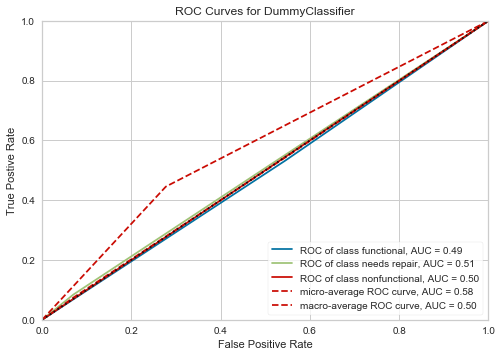

In [528]:
evaluate_model(dummy_clf, X_train_tf, y_train, X_test_tf, y_test, 
               title='Dummy Model')

# LOGISTIC REGRESSION

In [182]:
# normal, scaled
# logisticregressionCV
# look into not fitting an intercept vs dropping ohe column vs dropping binary
# don't worry multicolinearity
# ohe encoder is an either/or with ignoring vs dropping first

https://statisticsbyjim.com/regression/multicollinearity-in-regression-analysis/

Multicollinearity affects the coefficients and p-values, but it does not influence the predictions, precision of the predictions, and the goodness-of-fit statistics. If your primary goal is to make predictions, and you don’t need to understand the role of each independent variable, you don’t need to reduce severe multicollinearity.
Over the years, I’ve found that many people are incredulous over the third point, so here’s a reference!

The fact that some or all predictor variables are correlated among themselves does not, in general, inhibit our ability to obtain a good fit nor does it tend to affect inferences about mean responses or predictions of new observations.  —Applied Linear Statistical Models, p289, 4th Edition.

## Base Model

In [408]:
from sklearn.model_selection import RepeatedStratifiedKFold
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=123)

In [206]:
from sklearn.linear_model import LogisticRegressionCV
logreg_clf = LogisticRegressionCV(solver = 'lbfgs', class_weight='balanced', 
                                  random_state=123, scoring='recall_weighted', 
                                  n_jobs=-1, multi_class='multinomial')
logreg_base = logreg_clf.fit(X_train_tf, y_train)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Base Logistic Regression Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.80      0.66      0.72      8065
 needs repair       0.21      0.69      0.32      1079
nonfunctional       0.79      0.64      0.71      5706

     accuracy                           0.66     14850
    macro avg       0.60      0.66      0.58     14850
 weighted avg       0.75      0.66      0.69     14850

__________________________________________________________________


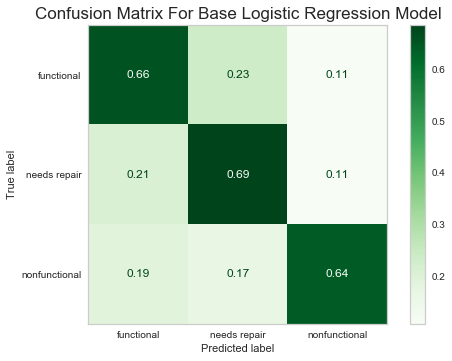

__________________________________________________________________


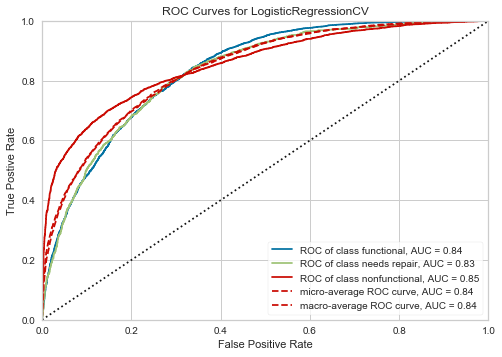

In [529]:
evaluate_model(logreg_base, X_train_tf, y_train, X_test_tf, y_test, 
               title='Base Logistic Regression Model')

In [384]:
coefs = logreg_base.coef_
pd.DataFrame(coefs).transpose()

,0,1,2
0,-0.097,0.188,-0.091
1,0.013,0.198,-0.211
2,0.019,0.090,-0.109
3,-0.341,0.357,-0.016
4,0.535,0.010,-0.545
5,0.715,-0.240,-0.475
6,-0.046,-0.312,0.358
7,-0.331,0.345,-0.014
8,0.043,-0.105,0.062
9,0.130,-0.071,-0.060


## Elastic Net

In [211]:
logreg_clf = LogisticRegressionCV(solver = 'saga', penalty='elasticnet', 
                                  class_weight='balanced', random_state=123,
                                  scoring='recall_weighted', n_jobs=-1, 
                                  l1_ratios=[.25, .5, .75], cv=3,
                                  multi_class='multinomial')
logreg_elasticnet = logreg_clf.fit(X_train_tf, y_train)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Elastic Net Logistic Regression Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.78      0.55      0.64      8065
 needs repair       0.14      0.72      0.23      1079
nonfunctional       0.85      0.52      0.65      5706

     accuracy                           0.55     14850
    macro avg       0.59      0.60      0.51     14850
 weighted avg       0.76      0.55      0.61     14850

__________________________________________________________________


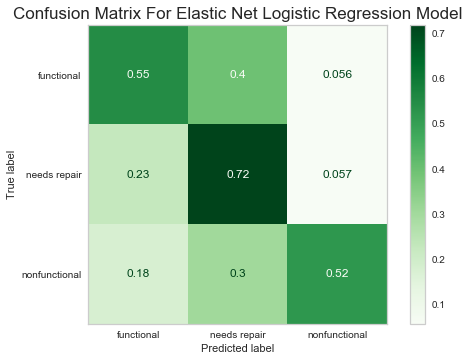

__________________________________________________________________


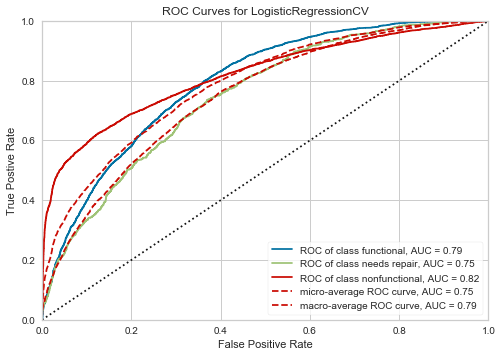

In [530]:
evaluate_model(logreg_elasticnet, X_train_tf, y_train, X_test_tf, y_test, 
               title='Elastic Net Logistic Regression Model')

## Grid Search

In [282]:
logreg_base.Cs_
Cs_list = list(logreg_base.Cs_)
Cs_list

[0.0001,
 0.000774263682681127,
 0.005994842503189409,
 0.046415888336127774,
 0.3593813663804626,
 2.782559402207126,
 21.54434690031882,
 166.81005372000558,
 1291.5496650148827,
 10000.0]

In [252]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

In [283]:
logreg_params = {'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'], 'C': Cs_list}
logreg_clf = LogisticRegression(class_weight='balanced', random_state=123, 
                                multi_class='multinomial')
grid = GridSearchCV(logreg_clf, logreg_params, scoring='recall_weighted', 
                    n_jobs=-1, cv=3)
logreg_grid = grid.fit(X_train_tf, y_train)

In [284]:
logreg_grid.best_params_

{'C': 0.3593813663804626, 'solver': 'saga'}

```python
{'C': 0.3593813663804626, 'solver': 'saga'}
```

In [289]:
C_drill_list = list(np.linspace(logreg_grid.best_params_['C']/5, logreg_grid.best_params_['C']*5, 10))
C_drill_list

[0.07187627327609251,
 0.26354633534567257,
 0.4552163974152526,
 0.6468864594848326,
 0.8385565215544126,
 1.0302265836239928,
 1.2218966456935727,
 1.4135667077631529,
 1.6052367698327328,
 1.796906831902313]

In [286]:
logreg_grid.best_estimator_

LogisticRegression(C=0.3593813663804626, class_weight='balanced',
                   multi_class='multinomial', random_state=123, solver='saga')

```python
LogisticRegression(C=0.3593813663804626, class_weight='balanced',
                   multi_class='multinomial', random_state=123, solver='saga')
```

In [290]:
logreg_params = {'C': C_drill_list
                }
logreg_clf = LogisticRegression(solver='saga', class_weight='balanced', 
                                random_state=123, multi_class='multinomial')
grid = GridSearchCV(logreg_clf, logreg_params, scoring='recall_weighted', 
                    n_jobs=-1, cv=3)
logreg_grid2 = grid.fit(X_train_tf, y_train)

In [300]:
logreg_grid2.best_params_

{'C': 0.4552163974152526}

```python
{'C': 0.4552163974152526}
```

In [350]:
logreg_gridmodel = logreg_grid2.best_estimator_
logreg_gridmodel

LogisticRegression(C=0.4552163974152526, class_weight='balanced',
                   multi_class='multinomial', random_state=123, solver='saga')

```python
LogisticRegression(C=0.4552163974152526, class_weight='balanced',
                   multi_class='multinomial', random_state=123, solver='saga')
```

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Grid Searched Logistic Regression Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.80      0.67      0.73      8065
 needs repair       0.21      0.62      0.32      1079
nonfunctional       0.76      0.66      0.70      5706

     accuracy                           0.66     14850
    macro avg       0.59      0.65      0.58     14850
 weighted avg       0.74      0.66      0.69     14850

__________________________________________________________________


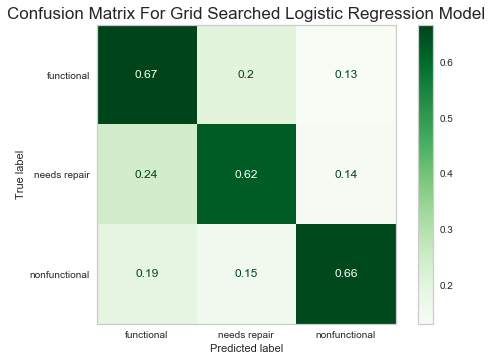

__________________________________________________________________


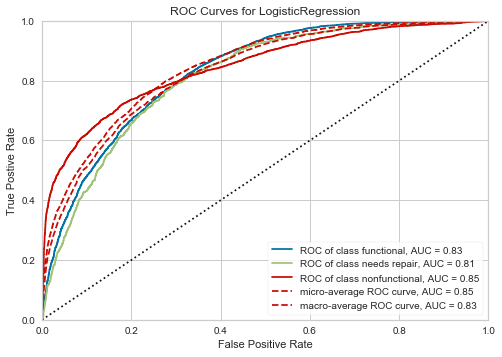

In [531]:
evaluate_model(logreg_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               title='Grid Searched Logistic Regression Model')

## SMOTE Model

In [375]:
logreg_gridmodel

LogisticRegression(C=0.4552163974152526, class_weight='balanced',
                   multi_class='multinomial', random_state=123, solver='saga')

In [305]:
best_c = logreg_grid2.best_params_['C']
best_c

0.4552163974152526

In [313]:
best_c = logreg_grid2.best_params_['C']
logreg_clf = LogisticRegressionCV(solver='saga', random_state=123, 
                                    scoring='recall_weighted', n_jobs=-1, 
                                    multi_class='multinomial', Cs=[best_c])

logreg_smote = logreg_clf.fit(X_train_smote, y_train_smote)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	SMOTE Logistic Regression Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.80      0.67      0.73      8065
 needs repair       0.22      0.63      0.32      1079
nonfunctional       0.78      0.67      0.72      5706

     accuracy                           0.67     14850
    macro avg       0.60      0.66      0.59     14850
 weighted avg       0.75      0.67      0.70     14850

__________________________________________________________________


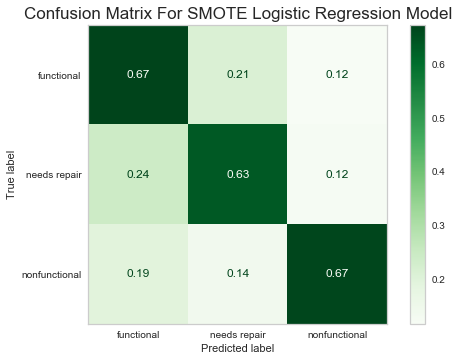

__________________________________________________________________


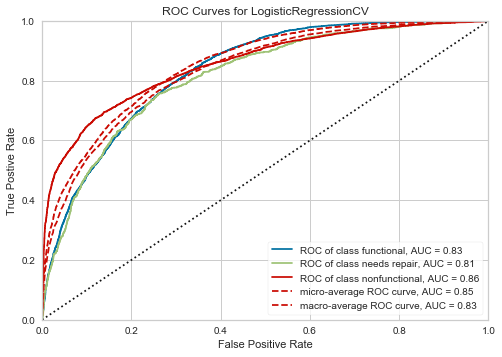

In [532]:
evaluate_model(logreg_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               title='SMOTE Logistic Regression Model')

## Pickle

In [224]:
import pickle

In [396]:
# pickle.dump(logreg_grid, open('logreg_grid.sav', 'wb'))
# pickle.dump(logreg_grid2, open('logreg_grid2.sav', 'wb'))
# pickle.dump(logreg_base, open('logreg_base.sav', 'wb'))
# pickle.dump(logreg_elasticnet, open('logreg_elasticnet.sav', 'wb'))
# pickle.dump(logreg_gridmodel, open('logreg_gridmodel.sav', 'wb'))
# pickle.dump(logreg_smote, open('logreg_smote.sav', 'wb'))

In [346]:
def pickle_model(model_list):
    for model in model_list:
        pickle.dump(model, open(f'{model}.sav', 'wb'))
        print(f'{model} successfully pickled!')

In [356]:
logreg_model_list = [logreg_base, logreg_elasticnet, logreg_gridmodel, 
                     logreg_smote]
pickle_model(logreg_model_list)

OSError: [Errno 22] Invalid argument: "LogisticRegressionCV(class_weight='balanced', multi_class='multinomial',\n                     n_jobs=-1, random_state=123, scoring='recall_weighted').sav"

In [316]:
# smote_model = pickle.load(open('logreg_smote.sav', 'rb'))

In [324]:
# evaluate_model(smote_model, X_train_smote, y_train_smote, X_test_tf, y_test)

# RANDOM FOREST

## Base Model

In [328]:
from sklearn.ensemble import RandomForestClassifier

forest_clf = RandomForestClassifier(n_jobs=-1, random_state=123, 
                                     class_weight='balanced')
forest_base = forest_clf.fit(X_train_tf, y_train)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Base Random Forest
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.81      0.88      0.84      8065
 needs repair       0.50      0.37      0.42      1079
nonfunctional       0.83      0.78      0.80      5706

     accuracy                           0.80     14850
    macro avg       0.71      0.67      0.69     14850
 weighted avg       0.79      0.80      0.80     14850

__________________________________________________________________


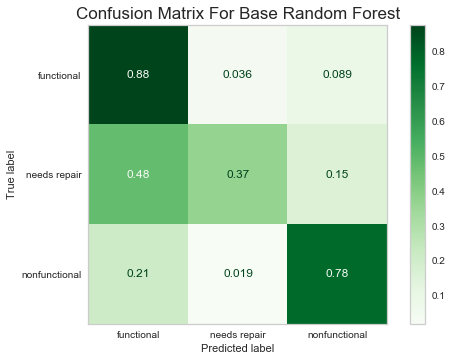

__________________________________________________________________


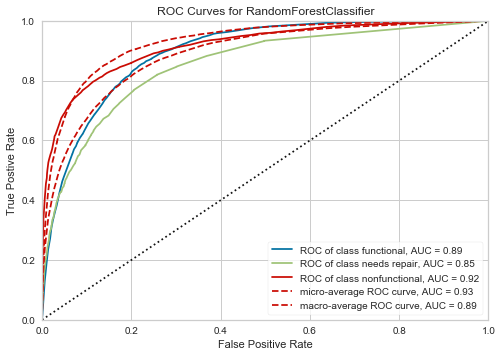

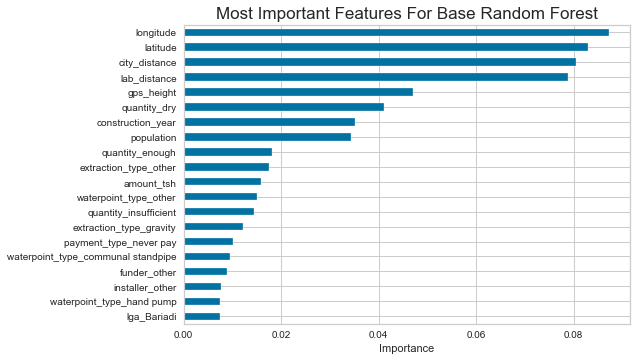

In [527]:
evaluate_model(forest_base, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Base Random Forest')

## Grid Search

In [332]:
forest_params = {'criterion': ['gini', 'entropy'], 
                 'max_depth': [None, 5, 10, 20, 50], 
                 'min_samples_leaf': [1, 10, 20], 
                 'max_features': ['auto', None], 
                 'class_weight': ['balanced', 'balanced_subsample'], 
                 'max_samples': [None, .5, .7, .9]}
forest_clf = RandomForestClassifier(random_state=123)
grid = GridSearchCV(forest_clf, forest_params, scoring='recall_weighted', 
                    n_jobs=-1, cv=3)

forest_grid = grid.fit(X_train_tf, y_train)

In [333]:
forest_grid.best_params_

{'class_weight': 'balanced_subsample',
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_samples': 0.5,
 'min_samples_leaf': 1}

```python
{'class_weight': 'balanced_subsample',
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_samples': 0.5,
 'min_samples_leaf': 1}
```

In [368]:
forest_params = {'max_depth': [None, 75, 100], 
                 'max_samples': [.3, .4, .5, .6], 
                 'min_samples_leaf': [1, 3, 6]}

forest_clf = RandomForestClassifier(random_state=123, criterion='gini', 
                                    class_weight='balanced_subsample', 
                                    max_features='auto', 
                                    n_estimators=150)

grid = GridSearchCV(forest_clf, forest_params, scoring='recall_weighted', 
                    n_jobs=-1, cv=3)

forest_grid2 = grid.fit(X_train_tf, y_train)

In [369]:
forest_grid2.best_params_

{'max_depth': None, 'max_samples': 0.4, 'min_samples_leaf': 1}

```python
{'max_depth': None, 'max_samples': 0.4, 'min_samples_leaf': 1}
```

In [370]:
forest_gridmodel = forest_grid2.best_estimator_
forest_gridmodel

RandomForestClassifier(class_weight='balanced_subsample', max_samples=0.4,
                       n_estimators=150, random_state=123)

```python
RandomForestClassifier(class_weight='balanced_subsample', max_samples=0.4,
                       n_estimators=150, random_state=123)
```

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Grid Searched Random Forest Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.80      0.90      0.85      8065
 needs repair       0.58      0.32      0.41      1079
nonfunctional       0.85      0.77      0.80      5706

     accuracy                           0.81     14850
    macro avg       0.74      0.66      0.69     14850
 weighted avg       0.80      0.81      0.80     14850

__________________________________________________________________


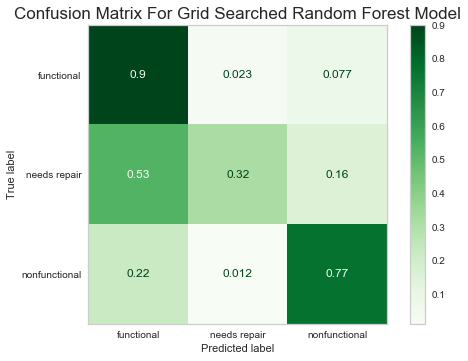

__________________________________________________________________


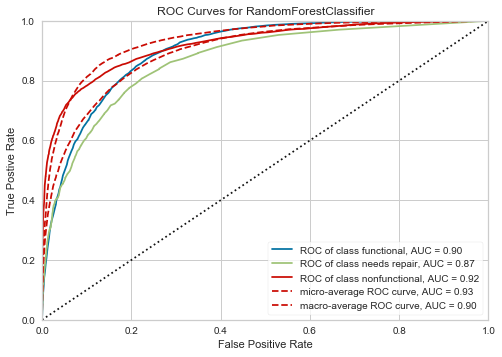

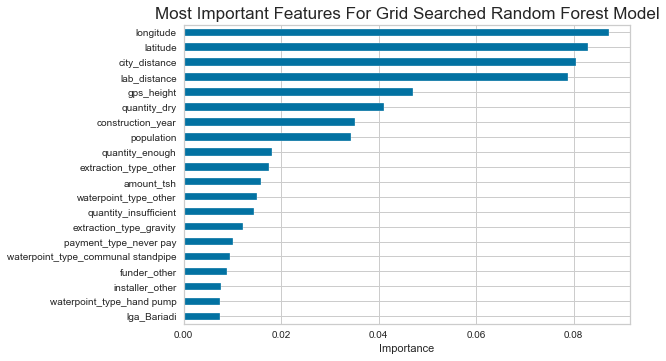

In [535]:
evaluate_model(forest_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Grid Searched Random Forest Model')

## SMOTE Model

In [372]:
forest_gridmodel

RandomForestClassifier(class_weight='balanced_subsample', max_samples=0.4,
                       n_estimators=150, random_state=123)

In [560]:
forest_clf = RandomForestClassifier(class_weight='balanced_subsample', 
                                    max_samples=0.4, random_state=123, 
                                    n_jobs=-1)

forest_smote = forest_clf.fit(X_train_smote, y_train_smote)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	SMOTE Random Forest Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.83      0.81      0.82      8065
 needs repair       0.37      0.50      0.43      1079
nonfunctional       0.82      0.79      0.80      5706

     accuracy                           0.78     14850
    macro avg       0.67      0.70      0.68     14850
 weighted avg       0.79      0.78      0.79     14850

__________________________________________________________________


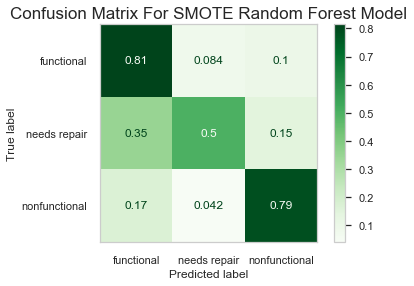

__________________________________________________________________


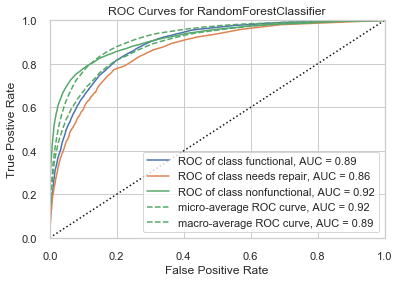

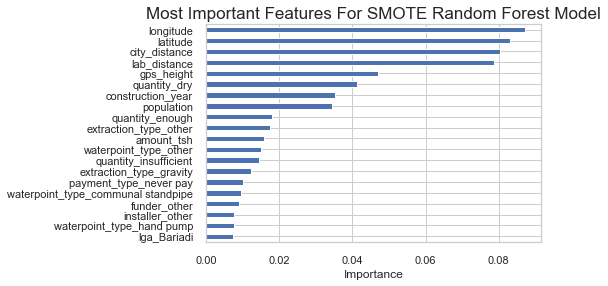

In [561]:
evaluate_model(forest_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               tree=True, title='SMOTE Random Forest Model')

## Pickle

In [562]:
# pickle.dump(forest_grid, open('forest_grid.sav', 'wb'))
# pickle.dump(forest_grid2, open('forest_grid2.sav', 'wb'))
# pickle.dump(forest_base, open('forest_base.sav', 'wb'))
# pickle.dump(forest_gridmodel, open('forest_gridmodel.sav', 'wb'))
# pickle.dump(forest_smote, open('forest_smote.sav', 'wb'))

# EXTRA TREES

## Base Model

In [403]:
from sklearn.ensemble import ExtraTreesClassifier

extratrees_clf = ExtraTreesClassifier(n_jobs=-1, random_state=123, 
                                      class_weight='balanced')

extratrees_base = extratrees_clf.fit(X_train_tf, y_train)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Base Extra Trees Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.81      0.85      0.83      8065
 needs repair       0.45      0.39      0.42      1079
nonfunctional       0.82      0.78      0.80      5706

     accuracy                           0.79     14850
    macro avg       0.69      0.67      0.68     14850
 weighted avg       0.79      0.79      0.79     14850

__________________________________________________________________


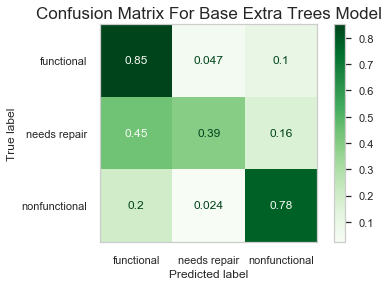

__________________________________________________________________


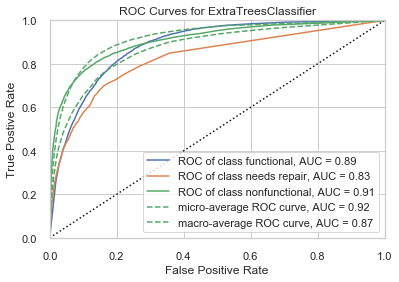

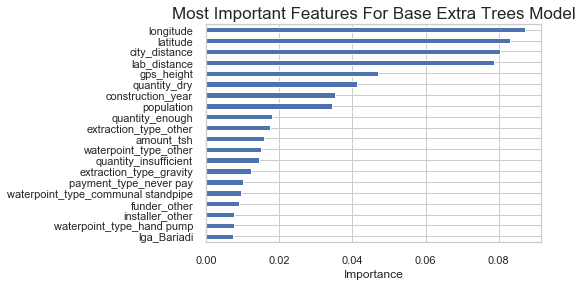

In [538]:
evaluate_model(extratrees_base, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Base Extra Trees Model')

## Grid Search

In [382]:
trees_params = {'criterion': ['gini', 'entropy'], 
                'max_depth': [None, 10, 50], 
                'min_samples_leaf': [1, 5], 
                'max_features': ['auto', None], 
                'bootstrap': [True, False], 
                'class_weight': ['balanced', 'balanced_subsample'], 
                'max_samples': [.5, .7, .9]}

extratrees_clf = ExtraTreesClassifier(random_state=123)
grid = GridSearchCV(extratrees_clf, trees_params, scoring='recall_weighted', 
                    n_jobs=-1, cv=3)
extratrees_grid = grid.fit(X_train_tf, y_train)

In [383]:
extratrees_grid.best_params_

{'bootstrap': True,
 'class_weight': 'balanced_subsample',
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_samples': 0.5,
 'min_samples_leaf': 1}

```python
{'bootstrap': True,
 'class_weight': 'balanced_subsample',
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_samples': 0.5,
 'min_samples_leaf': 1}
```

In [385]:
trees_params ={'max_depth': [None, 75, 100], 
               'max_samples': [None, .3, .4, .5, .6], 
               'min_samples_leaf': [1, 2, 3]}

extratrees_clf = ExtraTreesClassifier(random_state=123, criterion='gini', 
                                      bootstrap=True, 
                                      class_weight='balanced_subsample', 
                                      max_features='auto', n_estimators=150)

grid = GridSearchCV(extratrees_clf, trees_params, scoring='recall_weighted', 
                    n_jobs=-1, cv=3)
extratrees_grid2 = grid.fit(X_train_tf, y_train)

In [386]:
extratrees_grid2.best_params_

{'max_depth': None, 'max_samples': 0.3, 'min_samples_leaf': 1}

```python
{'max_depth': None, 'max_samples': 0.3, 'min_samples_leaf': 1}
```

In [387]:
extratrees_gridmodel = extratrees_grid2.best_estimator_
extratrees_gridmodel

ExtraTreesClassifier(bootstrap=True, class_weight='balanced_subsample',
                     max_samples=0.3, n_estimators=150, random_state=123)

```python
ExtraTreesClassifier(bootstrap=True, class_weight='balanced_subsample',
                     max_samples=0.3, n_estimators=150, random_state=123)
```

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Grid Searched Extra Trees Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.79      0.90      0.84      8065
 needs repair       0.58      0.31      0.40      1079
nonfunctional       0.84      0.76      0.80      5706

     accuracy                           0.80     14850
    macro avg       0.74      0.66      0.68     14850
 weighted avg       0.80      0.80      0.80     14850

__________________________________________________________________


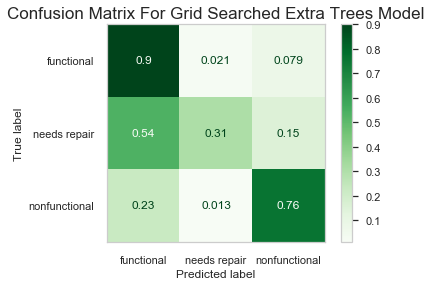

__________________________________________________________________


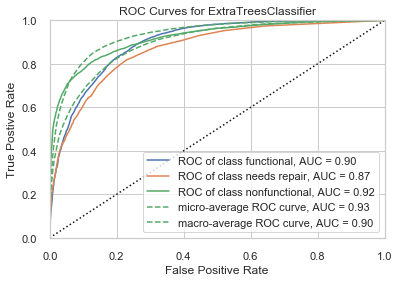

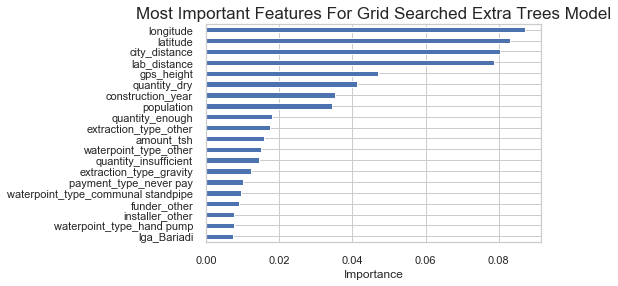

In [539]:
evaluate_model(extratrees_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Grid Searched Extra Trees Model')

## SMOTE Model

In [389]:
extratrees_gridmodel

ExtraTreesClassifier(bootstrap=True, class_weight='balanced_subsample',
                     max_samples=0.3, n_estimators=150, random_state=123)

In [557]:
extratrees_clf = ExtraTreesClassifier(bootstrap=True, 
                        class_weight='balanced_subsample', n_jobs=-1,
                        max_samples=0.3, random_state=123)

extratrees_smote = extratrees_clf.fit(X_train_smote, y_train_smote)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	SMOTE Extra Trees Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.83      0.81      0.82      8065
 needs repair       0.35      0.51      0.42      1079
nonfunctional       0.82      0.78      0.80      5706

     accuracy                           0.77     14850
    macro avg       0.67      0.70      0.68     14850
 weighted avg       0.79      0.77      0.78     14850

__________________________________________________________________


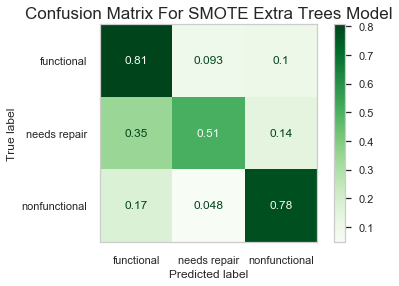

__________________________________________________________________


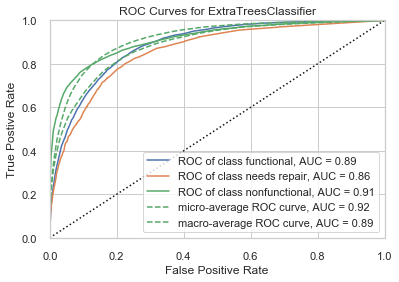

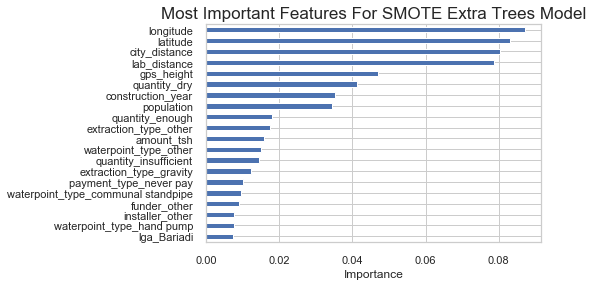

In [558]:
evaluate_model(extratrees_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               tree=True, title='SMOTE Extra Trees Model')

## Pickle

In [559]:
# pickle.dump(extratrees_grid, open('extratrees_grid.sav', 'wb'))
# pickle.dump(extratrees_grid2, open('extratrees_grid2.sav', 'wb'))
# pickle.dump(extratrees_base, open('extratrees_base.sav', 'wb'))
# pickle.dump(extratrees_gridmodel, open('extratrees_gridmodel.sav', 'wb'))
# pickle.dump(extratrees_smote, open('extratrees_smote.sav', 'wb'))

# ADABOOSTING

## Base Model

In [323]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

In [326]:
ada_clf = AdaBoostClassifier(n_estimators=100, random_state=123, 
                             base_estimator=DecisionTreeClassifier(max_depth=3, 
                                                                   class_weight='balanced'))

ada_base = ada_clf.fit(X_train_tf, y_train)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Base AdaBoost Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.80      0.65      0.72      8065
 needs repair       0.23      0.67      0.35      1079
nonfunctional       0.76      0.70      0.73      5706

     accuracy                           0.67     14850
    macro avg       0.60      0.67      0.60     14850
 weighted avg       0.74      0.67      0.69     14850

__________________________________________________________________


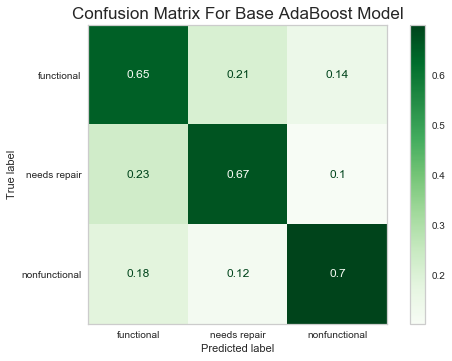

__________________________________________________________________


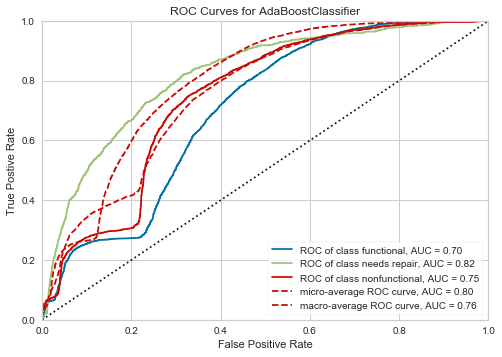

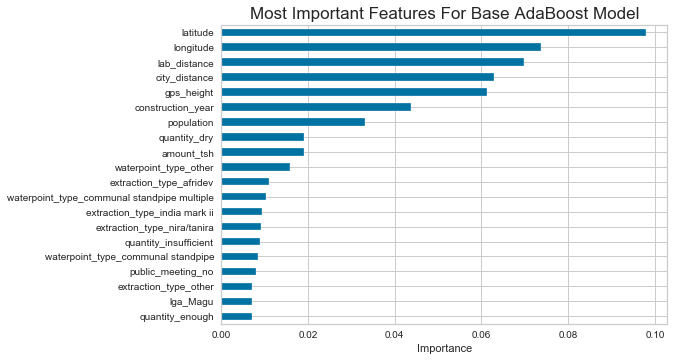

In [328]:
evaluate_model(ada_base, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Base AdaBoost Model')

In [329]:
ada_clf = AdaBoostClassifier(n_estimators=100, random_state=123, 
                             base_estimator=DecisionTreeClassifier(max_depth=3))

ada_smote_base = ada_clf.fit(X_train_smote, y_train_smote)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Base AdaBoost Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.80      0.69      0.74      8065
 needs repair       0.25      0.58      0.35      1079
nonfunctional       0.75      0.71      0.73      5706

     accuracy                           0.69     14850
    macro avg       0.60      0.66      0.61     14850
 weighted avg       0.74      0.69      0.71     14850

__________________________________________________________________


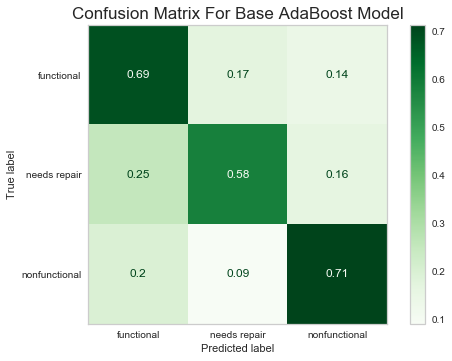

__________________________________________________________________


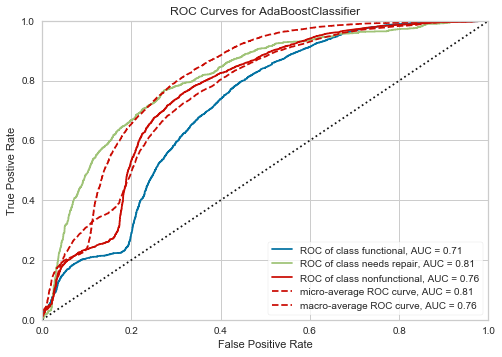

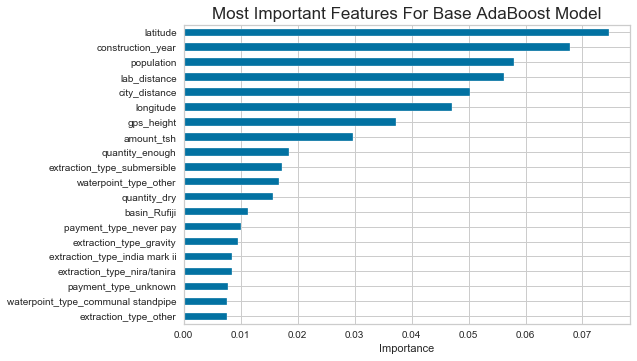

In [330]:
evaluate_model(ada_smote_base, X_train_smote, y_train_smote, X_test_tf, y_test, 
               tree=True, title='Base AdaBoost Model')

## Grid Search

In [333]:
ada_params = {'n_estimators': [25, 50, 100], 
              'learning_rate': [.5, 1], 
              'base_estimator__max_depth': [None, 3, 7], 
              'base_estimator__max_features': [None, 'auto'], 
              'base_estimator__min_samples_split': [2, 10, 20]}

ada_clf = AdaBoostClassifier(random_state=123, 
                             base_estimator=DecisionTreeClassifier(class_weight='balanced'))

grid = GridSearchCV(ada_clf, ada_params, scoring='recall_weighted', 
                    n_jobs=-1, cv=3)

ada_grid = grid.fit(X_train_tf, y_train)

In [334]:
ada_grid.best_params_

{'base_estimator__max_depth': None,
 'base_estimator__max_features': None,
 'base_estimator__min_samples_split': 20,
 'learning_rate': 0.5,
 'n_estimators': 100}

```python
{'base_estimator__max_depth': None,
 'base_estimator__max_features': None,
 'base_estimator__min_samples_split': 20,
 'learning_rate': 0.5,
 'n_estimators': 100}
```

In [341]:
ada_params = {'n_estimators': [100, 200, 300], 
              'learning_rate': [.1, .25, .5], 
              'base_estimator__max_depth': [None, 20, 50],  
              'base_estimator__min_samples_split': [20, 50, 80]}

ada_clf = AdaBoostClassifier(random_state=123, 
                             base_estimator=DecisionTreeClassifier(max_features=None, 
                                                                   class_weight='balanced'))

grid = GridSearchCV(ada_clf, ada_params, scoring='recall_weighted', 
                    n_jobs=-1, cv=3)

ada_grid2 = grid.fit(X_train_tf, y_train)

In [342]:
ada_grid2.best_params_

{'base_estimator__max_depth': None,
 'base_estimator__min_samples_split': 20,
 'learning_rate': 0.1,
 'n_estimators': 200}

```python
{'base_estimator__max_depth': None,
 'base_estimator__min_samples_split': 20,
 'learning_rate': 0.1,
 'n_estimators': 200}
```

In [349]:
ada_gridmodel = ada_grid2.best_estimator_
ada_gridmodel

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                         min_samples_split=20),
                   learning_rate=0.1, n_estimators=200, random_state=123)

```python
AdaBoostClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                         min_samples_split=20),
                   learning_rate=0.1, n_estimators=200, random_state=123)
```

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Grid Searched AdaBoost Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.80      0.87      0.84      8065
 needs repair       0.51      0.34      0.41      1079
nonfunctional       0.82      0.77      0.80      5706

     accuracy                           0.80     14850
    macro avg       0.71      0.66      0.68     14850
 weighted avg       0.79      0.80      0.79     14850

__________________________________________________________________


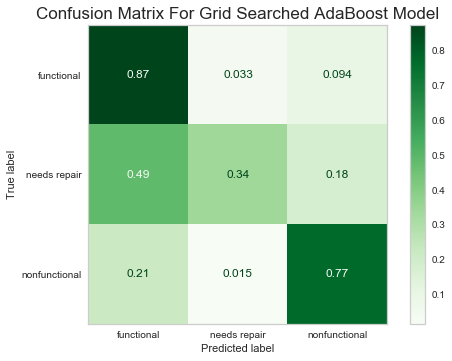

__________________________________________________________________


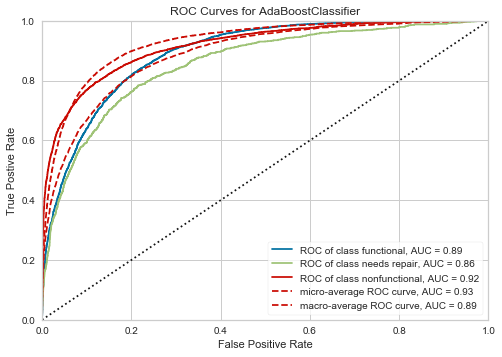

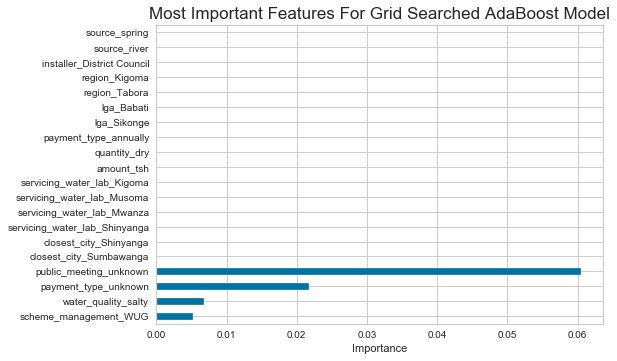

In [351]:
evaluate_model(ada_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Grid Searched AdaBoost Model')

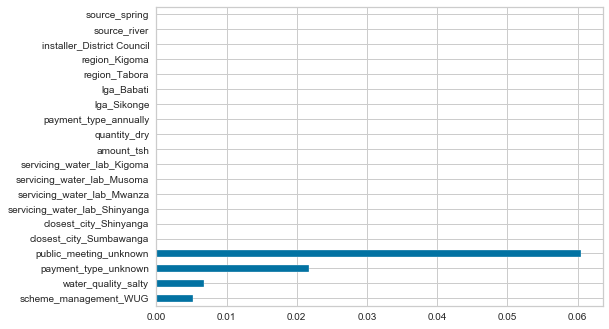

In [379]:
importances = pd.Series(ada_gridmodel.feature_importances_, index=X_train_tf.columns)
importances.nlargest(20).sort_values().plot(kind='barh')

In [383]:
importances = pd.Series(ada_gridmodel.feature_importances_, index=X_train_tf.columns)
importances

amount_tsh                                      inf
gps_height                                      nan
longitude                                       nan
latitude                                        nan
population                                      nan
construction_year                               nan
lab_distance                                    nan
city_distance                                   nan
funder_Danida                                 0.000
funder_Dhv                                    0.000
funder_District Council                       0.000
funder_Dwsp                                     nan
funder_Germany Republi                        0.000
funder_Government Of Tanzania                   nan
funder_Hesawa                                   nan
funder_Kkkt                                   0.000
funder_Norad                                  0.000
funder_Private Individual                     0.000
funder_Rwssp                                  0.000
funder_Tasaf

## SMOTE Model

In [352]:
ada_gridmodel

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                         min_samples_split=20),
                   learning_rate=0.1, n_estimators=200, random_state=123)

```python
AdaBoostClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                         min_samples_split=20),
                   learning_rate=0.1, n_estimators=200, random_state=123)
```

In [354]:
ada_clf = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(min_samples_split=20),
                   learning_rate=0.1, n_estimators=200, random_state=123)

ada_smote = ada_clf.fit(X_train_smote, y_train_smote)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	SMOTE AdaBoost Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.82      0.83      0.82      8065
 needs repair       0.40      0.45      0.42      1079
nonfunctional       0.81      0.78      0.79      5706

     accuracy                           0.78     14850
    macro avg       0.68      0.69      0.68     14850
 weighted avg       0.79      0.78      0.78     14850

__________________________________________________________________


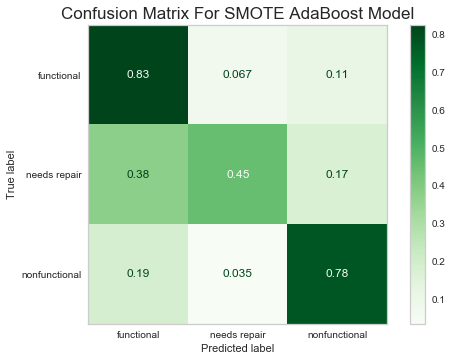

__________________________________________________________________


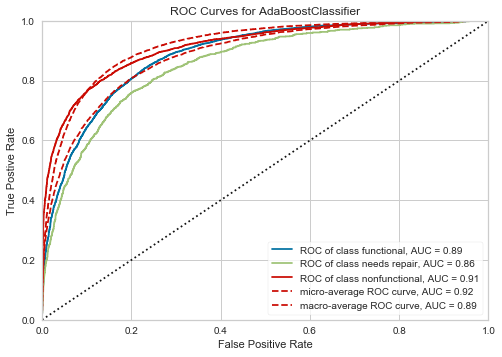

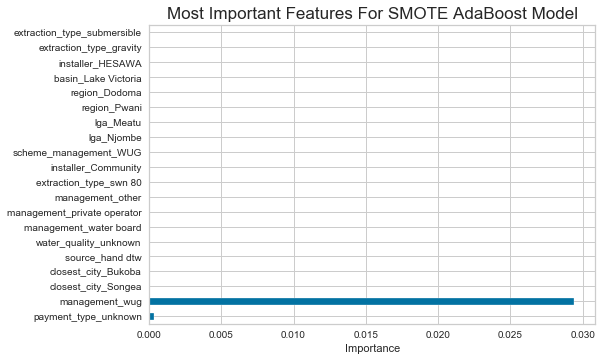

In [355]:
evaluate_model(ada_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               tree=True, title='SMOTE AdaBoost Model')

## Pickle

In [356]:
# pickle.dump(ada_base, open('ada_base.sav', 'wb'))
# pickle.dump(ada_smote_base, open('ada_smote_base.sav', 'wb'))
# pickle.dump(ada_gridmodel, open('ada_gridmodel.sav', 'wb'))
# pickle.dump(ada_smote, open('ada_smote.sav', 'wb'))

# GRADIENT BOOSTING

In [343]:
from sklearn.ensemble import GradientBoostingClassifier

In [347]:
gboost_clf = GradientBoostingClassifier(random_state=123)

gboost_base = gboost_clf.fit(X_train_tf, y_train)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Base Gradient Boosted
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.73      0.93      0.81      8065
 needs repair       0.64      0.17      0.26      1079
nonfunctional       0.84      0.63      0.72      5706

     accuracy                           0.76     14850
    macro avg       0.73      0.57      0.60     14850
 weighted avg       0.76      0.76      0.74     14850

__________________________________________________________________


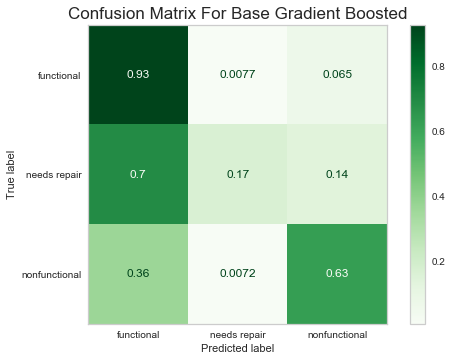

__________________________________________________________________


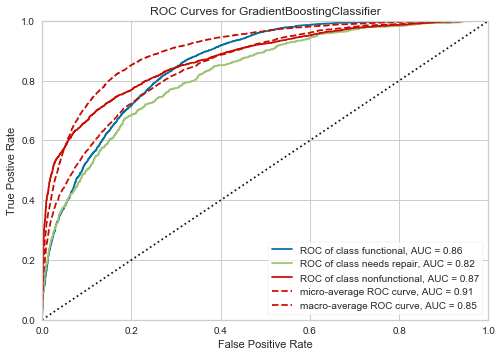

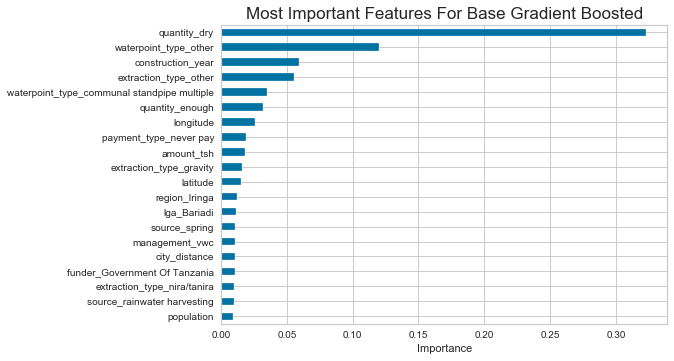

In [348]:
evaluate_model(gboost_base, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Base Gradient Boosted')

# XGBOOST

## Base Model

In [192]:
# Calculate class weight
from sklearn.utils import class_weight
k_train = class_weight.compute_class_weight('balanced', np.unique(y_train), y_train)
wt = dict(zip(np.unique(y_train), k_train))

# Map class weights to corresponding target class values, make sure class labels have range (0, n_classes-1)
w_array = y_train.map(wt)
set(zip(y_train,w_array))

# Convert wt series to wt array
w_array = w_array.values

In [264]:
from xgboost import XGBClassifier
eval_set = [(X_train_tf, y_train), (X_test_tf, y_test)]
xgb_clf = XGBClassifier(n_jobs=-1, random_state=123)
xgb_base = xgb_clf.fit(X_train_tf, y_train, sample_weight=w_array, 
                       early_stopping_rounds=10, eval_metric='mlogloss', 
                       eval_set=eval_set)

[0]	validation_0-mlogloss:1.07254	validation_1-mlogloss:1.07329
Multiple eval metrics have been passed: 'validation_1-mlogloss' will be used for early stopping.

Will train until validation_1-mlogloss hasn't improved in 10 rounds.
[1]	validation_0-mlogloss:1.05002	validation_1-mlogloss:1.05162
[2]	validation_0-mlogloss:1.03037	validation_1-mlogloss:1.0327
[3]	validation_0-mlogloss:1.01353	validation_1-mlogloss:1.01665
[4]	validation_0-mlogloss:0.998316	validation_1-mlogloss:1.00197
[5]	validation_0-mlogloss:0.984373	validation_1-mlogloss:0.988588
[6]	validation_0-mlogloss:0.972724	validation_1-mlogloss:0.977535
[7]	validation_0-mlogloss:0.961355	validation_1-mlogloss:0.966486
[8]	validation_0-mlogloss:0.951222	validation_1-mlogloss:0.95664
[9]	validation_0-mlogloss:0.941833	validation_1-mlogloss:0.947702
[10]	validation_0-mlogloss:0.933401	validation_1-mlogloss:0.939657
[11]	validation_0-mlogloss:0.924716	validation_1-mlogloss:0.931382
[12]	validation_0-mlogloss:0.917998	validation_1-m

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Base XGBoost Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.79      0.68      0.73      8065
 needs repair       0.20      0.68      0.31      1079
nonfunctional       0.82      0.61      0.70      5706

     accuracy                           0.66     14850
    macro avg       0.60      0.66      0.58     14850
 weighted avg       0.76      0.66      0.69     14850

__________________________________________________________________


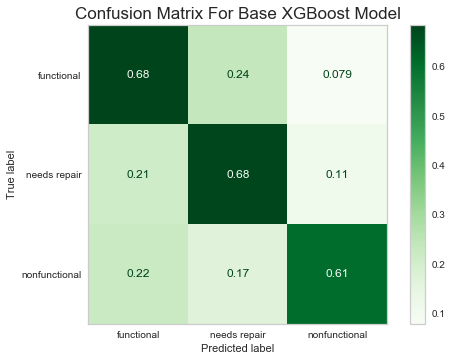

__________________________________________________________________


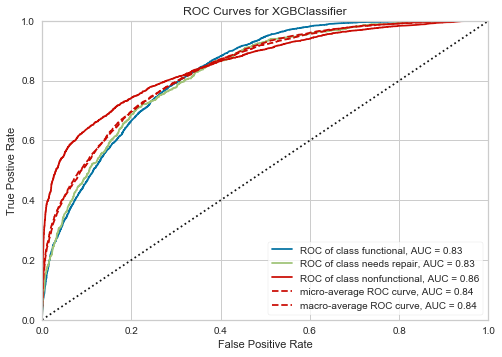

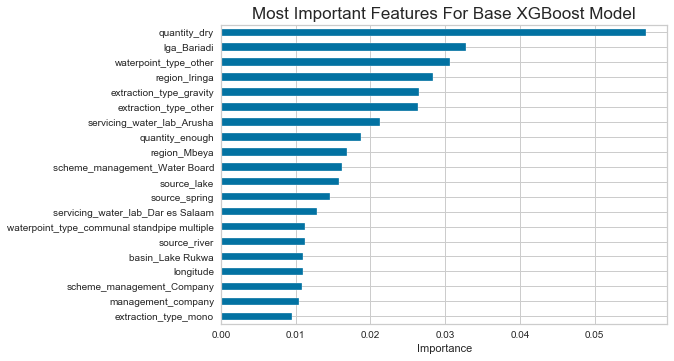

In [265]:
evaluate_model(xgb_base, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Base XGBoost Model')

## Grid Search

In [563]:
xgb_params = {'max_depth': [None, 3, 10], 
              'learning_rate': [.1, .05], 
              'min_child_weight': [1, 5, 10], 
              'subsample': [.3, .5, .7]}
xgb_clf = XGBClassifier(n_jobs=-1, random_state=123)
grid = GridSearchCV(xgb_clf, xgb_params, scoring='recall_weighted', 
                    n_jobs=-1, cv=3)

xgb_grid = grid.fit(X_train_tf, y_train)

In [564]:
xgb_grid.best_params_

{'learning_rate': 0.1,
 'max_depth': 10,
 'min_child_weight': 1,
 'subsample': 0.7}

```python
{'learning_rate': 0.1,
 'max_depth': 10,
 'min_child_weight': 1,
 'subsample': 0.7}
```

In [565]:
xgb_params = {'max_depth': [8, 10, 12], 
              'learning_rate': [.1, .08], 
              'min_child_weight': [1, 3], 
              'subsample': [.6, .7, .8]}
xgb_clf = XGBClassifier(n_jobs=-1, random_state=123)
grid = GridSearchCV(xgb_clf, xgb_params, scoring='recall_weighted', 
                    n_jobs=-1, cv=3)

xgb_grid2 = grid.fit(X_train_tf, y_train)

In [569]:
xgb_grid2.best_params_

{'learning_rate': 0.1,
 'max_depth': 12,
 'min_child_weight': 1,
 'subsample': 0.7}

```python
{'learning_rate': 0.1,
 'max_depth': 12,
 'min_child_weight': 1,
 'subsample': 0.7}
```

In [568]:
xgb_gridmodel = xgb_grid2.best_estimator_
xgb_gridmodel

XGBClassifier(max_depth=12, n_jobs=-1, objective='multi:softprob',
              random_state=123, subsample=0.7)

```python
XGBClassifier(max_depth=12, n_jobs=-1, objective='multi:softprob',
              random_state=123, subsample=0.7)
```

In [266]:
eval_set = [(X_train_tf, y_train), (X_test_tf, y_test)]
xgb_clf = XGBClassifier(n_jobs=-1, random_state=123, max_depth=12, 
                        subsample=.7, n_estimators=400)
xgb_gridmodel = xgb_clf.fit(X_train_tf, y_train, sample_weight=w_array, 
                       early_stopping_rounds=10, eval_metric='mlogloss', 
                       eval_set=eval_set)

[0]	validation_0-mlogloss:1.03878	validation_1-mlogloss:1.04401
Multiple eval metrics have been passed: 'validation_1-mlogloss' will be used for early stopping.

Will train until validation_1-mlogloss hasn't improved in 10 rounds.
[1]	validation_0-mlogloss:0.987348	validation_1-mlogloss:0.997903
[2]	validation_0-mlogloss:0.942948	validation_1-mlogloss:0.957924
[3]	validation_0-mlogloss:0.903413	validation_1-mlogloss:0.922875
[4]	validation_0-mlogloss:0.867878	validation_1-mlogloss:0.891494
[5]	validation_0-mlogloss:0.836261	validation_1-mlogloss:0.864103
[6]	validation_0-mlogloss:0.808646	validation_1-mlogloss:0.840302
[7]	validation_0-mlogloss:0.783556	validation_1-mlogloss:0.819054
[8]	validation_0-mlogloss:0.759717	validation_1-mlogloss:0.799326
[9]	validation_0-mlogloss:0.737512	validation_1-mlogloss:0.780914
[10]	validation_0-mlogloss:0.718664	validation_1-mlogloss:0.765538
[11]	validation_0-mlogloss:0.701817	validation_1-mlogloss:0.752115
[12]	validation_0-mlogloss:0.684202	valid

[121]	validation_0-mlogloss:0.344892	validation_1-mlogloss:0.545898
[122]	validation_0-mlogloss:0.343924	validation_1-mlogloss:0.545661
[123]	validation_0-mlogloss:0.342025	validation_1-mlogloss:0.544946
[124]	validation_0-mlogloss:0.340719	validation_1-mlogloss:0.544484
[125]	validation_0-mlogloss:0.339169	validation_1-mlogloss:0.543763
[126]	validation_0-mlogloss:0.337573	validation_1-mlogloss:0.543293
[127]	validation_0-mlogloss:0.336648	validation_1-mlogloss:0.542894
[128]	validation_0-mlogloss:0.335309	validation_1-mlogloss:0.542554
[129]	validation_0-mlogloss:0.333489	validation_1-mlogloss:0.541932
[130]	validation_0-mlogloss:0.332221	validation_1-mlogloss:0.541685
[131]	validation_0-mlogloss:0.331153	validation_1-mlogloss:0.541513
[132]	validation_0-mlogloss:0.32975	validation_1-mlogloss:0.541018
[133]	validation_0-mlogloss:0.328631	validation_1-mlogloss:0.540654
[134]	validation_0-mlogloss:0.327409	validation_1-mlogloss:0.54025
[135]	validation_0-mlogloss:0.325601	validation_1-

[242]	validation_0-mlogloss:0.228373	validation_1-mlogloss:0.522468
[243]	validation_0-mlogloss:0.227727	validation_1-mlogloss:0.522524
[244]	validation_0-mlogloss:0.227066	validation_1-mlogloss:0.522489
[245]	validation_0-mlogloss:0.22628	validation_1-mlogloss:0.522318
[246]	validation_0-mlogloss:0.225285	validation_1-mlogloss:0.522225
[247]	validation_0-mlogloss:0.22463	validation_1-mlogloss:0.522067
[248]	validation_0-mlogloss:0.224015	validation_1-mlogloss:0.521907
[249]	validation_0-mlogloss:0.22324	validation_1-mlogloss:0.52176
[250]	validation_0-mlogloss:0.222163	validation_1-mlogloss:0.521615
[251]	validation_0-mlogloss:0.221434	validation_1-mlogloss:0.52155
[252]	validation_0-mlogloss:0.220844	validation_1-mlogloss:0.521475
[253]	validation_0-mlogloss:0.220179	validation_1-mlogloss:0.521508
[254]	validation_0-mlogloss:0.219156	validation_1-mlogloss:0.521502
[255]	validation_0-mlogloss:0.218375	validation_1-mlogloss:0.521522
[256]	validation_0-mlogloss:0.217799	validation_1-mlo

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Grid Searched XGBoost Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.83      0.82      0.83      8065
 needs repair       0.40      0.53      0.46      1079
nonfunctional       0.83      0.79      0.81      5706

     accuracy                           0.79     14850
    macro avg       0.69      0.71      0.70     14850
 weighted avg       0.80      0.79      0.79     14850

__________________________________________________________________


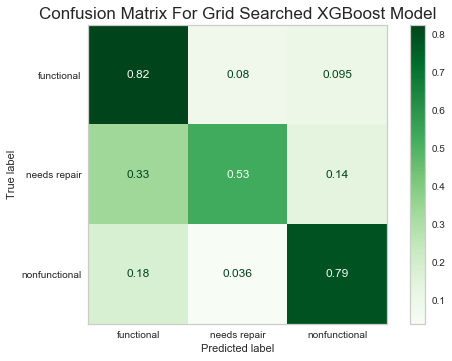

__________________________________________________________________


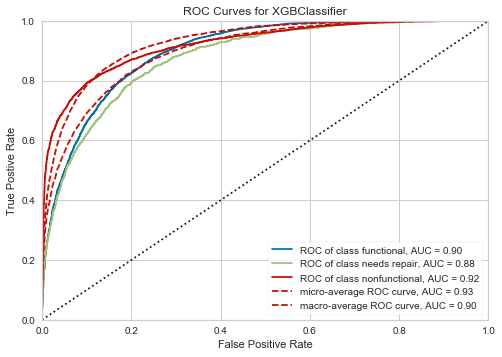

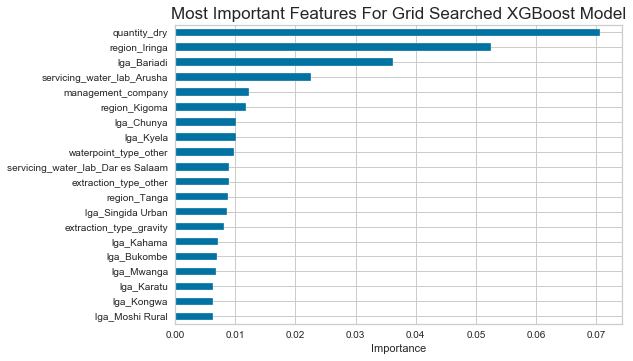

In [267]:
evaluate_model(xgb_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               tree=True, title='Grid Searched XGBoost Model')

## SMOTE Model

In [268]:
eval_set = [(X_train_smote, y_train_smote), (X_test_tf, y_test)]
xgb_clf = XGBClassifier(n_jobs=-1, random_state=123, max_depth=12, 
                        subsample=.7, n_estimators=400)
xgb_smote = xgb_clf.fit(X_train_smote, y_train_smote, 
                       early_stopping_rounds=10, eval_metric='mlogloss', 
                       eval_set=eval_set)

[0]	validation_0-mlogloss:1.03277	validation_1-mlogloss:1.04288
Multiple eval metrics have been passed: 'validation_1-mlogloss' will be used for early stopping.

Will train until validation_1-mlogloss hasn't improved in 10 rounds.
[1]	validation_0-mlogloss:0.978038	validation_1-mlogloss:0.996866
[2]	validation_0-mlogloss:0.930274	validation_1-mlogloss:0.956997
[3]	validation_0-mlogloss:0.888939	validation_1-mlogloss:0.923493
[4]	validation_0-mlogloss:0.850588	validation_1-mlogloss:0.892732
[5]	validation_0-mlogloss:0.816551	validation_1-mlogloss:0.865832
[6]	validation_0-mlogloss:0.784849	validation_1-mlogloss:0.841192
[7]	validation_0-mlogloss:0.757888	validation_1-mlogloss:0.819917
[8]	validation_0-mlogloss:0.732014	validation_1-mlogloss:0.800356
[9]	validation_0-mlogloss:0.708718	validation_1-mlogloss:0.782654
[10]	validation_0-mlogloss:0.68673	validation_1-mlogloss:0.766385
[11]	validation_0-mlogloss:0.667237	validation_1-mlogloss:0.752307
[12]	validation_0-mlogloss:0.649548	valida

[120]	validation_0-mlogloss:0.304297	validation_1-mlogloss:0.549774
[121]	validation_0-mlogloss:0.30256	validation_1-mlogloss:0.549116
[122]	validation_0-mlogloss:0.301111	validation_1-mlogloss:0.548429
[123]	validation_0-mlogloss:0.299442	validation_1-mlogloss:0.547938
[124]	validation_0-mlogloss:0.297808	validation_1-mlogloss:0.547546
[125]	validation_0-mlogloss:0.296797	validation_1-mlogloss:0.547402
[126]	validation_0-mlogloss:0.295747	validation_1-mlogloss:0.547066
[127]	validation_0-mlogloss:0.294345	validation_1-mlogloss:0.546551
[128]	validation_0-mlogloss:0.292861	validation_1-mlogloss:0.546188
[129]	validation_0-mlogloss:0.291328	validation_1-mlogloss:0.545702
[130]	validation_0-mlogloss:0.290545	validation_1-mlogloss:0.545644
[131]	validation_0-mlogloss:0.289174	validation_1-mlogloss:0.545379
[132]	validation_0-mlogloss:0.288626	validation_1-mlogloss:0.545324
[133]	validation_0-mlogloss:0.287874	validation_1-mlogloss:0.54526
[134]	validation_0-mlogloss:0.28711	validation_1-m

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	SMOTE XGBoost Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.83      0.82      0.83      8065
 needs repair       0.37      0.51      0.43      1079
nonfunctional       0.84      0.78      0.81      5706

     accuracy                           0.78     14850
    macro avg       0.68      0.70      0.69     14850
 weighted avg       0.80      0.78      0.79     14850

__________________________________________________________________


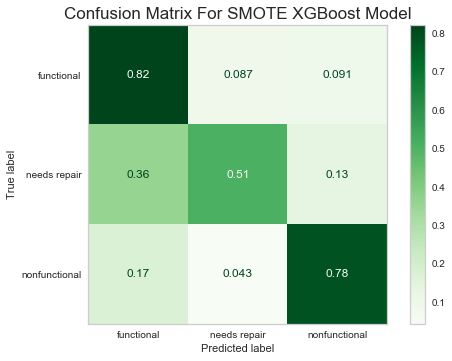

__________________________________________________________________


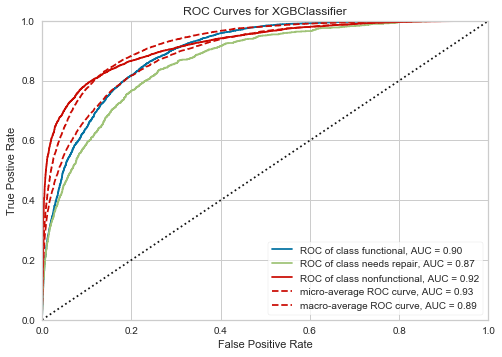

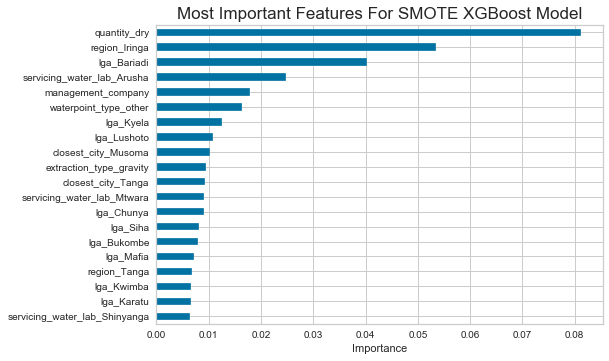

In [269]:
evaluate_model(xgb_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               tree=True, title='SMOTE XGBoost Model')

## Pickle

In [270]:
# pickle.dump(xgb_base, open('xgb_base.sav', 'wb'))
# pickle.dump(xgb_gridmodel, open('xgb_gridmodel.sav', 'wb'))
# pickle.dump(xgb_smote, open('xgb_smote.sav', 'wb'))

# CATBOOST

## Base Model

In [198]:
from catboost import CatBoostClassifier

In [244]:
cat_clf = CatBoostClassifier(iterations=10,
                           learning_rate=1,
                           depth=2,
                           loss_function='MultiClass')
cat_base = cat_clf.fit(X_train_smote, y_train_smote)

0:	learn: 0.9715244	total: 12.7ms	remaining: 114ms
1:	learn: 0.9265869	total: 23ms	remaining: 92.1ms
2:	learn: 0.9016587	total: 33.4ms	remaining: 78ms
3:	learn: 0.8866242	total: 45.6ms	remaining: 68.3ms
4:	learn: 0.8729226	total: 58.4ms	remaining: 58.4ms
5:	learn: 0.8609532	total: 70.3ms	remaining: 46.9ms
6:	learn: 0.8528087	total: 81.4ms	remaining: 34.9ms
7:	learn: 0.8454337	total: 93.3ms	remaining: 23.3ms
8:	learn: 0.8403055	total: 104ms	remaining: 11.6ms
9:	learn: 0.8332377	total: 118ms	remaining: 0us


__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	CatBoost Base Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.75      0.61      0.67      8065
 needs repair       0.17      0.57      0.26      1079
nonfunctional       0.71      0.59      0.64      5706

     accuracy                           0.60     14850
    macro avg       0.54      0.59      0.53     14850
 weighted avg       0.69      0.60      0.63     14850

__________________________________________________________________


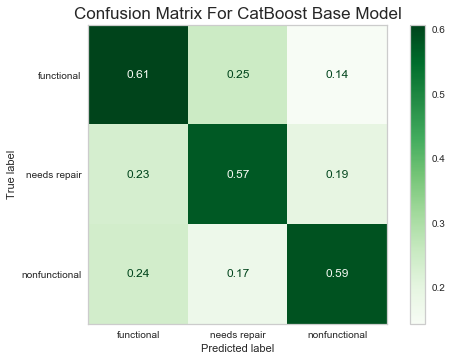

__________________________________________________________________


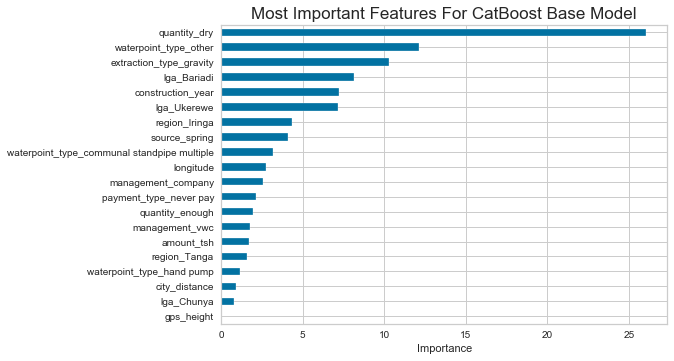

In [275]:
evaluate_model(cat_base, X_train_smote, y_train_smote, X_test_tf, y_test, 
               tree=True, catboost=True, title='CatBoost Base Model')

# POLYNOMIAL SVM

## Base Model

In [308]:
from sklearn.svm import SVC

In [360]:
svm_clf = SVC(random_state=123, class_weight='balanced', 
              decision_function_shape='ovo', kernel='poly')
svc_poly_base = svm_clf.fit(X_train_tf, y_train)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Base Polynomial SVM Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.82      0.72      0.77      8065
 needs repair       0.26      0.71      0.38      1079
nonfunctional       0.83      0.70      0.76      5706

     accuracy                           0.71     14850
    macro avg       0.63      0.71      0.63     14850
 weighted avg       0.78      0.71      0.73     14850

__________________________________________________________________


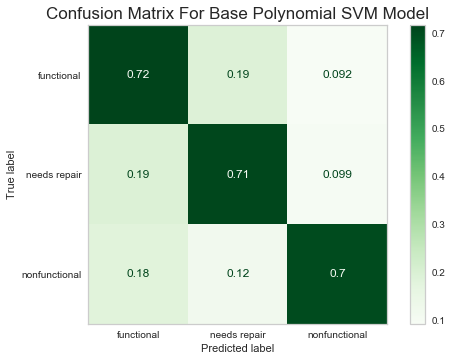

__________________________________________________________________


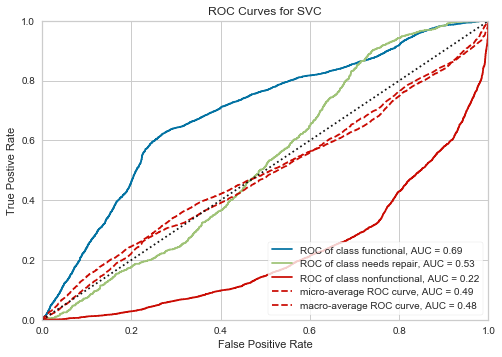

In [366]:
evaluate_model(svc_poly_base, X_train_tf, y_train, X_test_tf, y_test, 
               title='Base Polynomial SVM Model')

##  Grid Search

In [367]:
svc_params = {'C': [1, 5, 10], 
              'degree': [3, 10], 
              'coef0': [0, 1], 
              'decision_function_shape': ['ovo', 'ovr']}

svm_clf = SVC(random_state=123, class_weight='balanced')
grid = GridSearchCV(svm_clf, svc_params, scoring='recall_weighted', 
                    n_jobs=-1, cv=3)
svc_grid = grid.fit(X_train_tf, y_train)

In [368]:
svc_grid.best_params_

{'C': 10, 'coef0': 0, 'decision_function_shape': 'ovo', 'degree': 3}

```python
{'C': 10, 'coef0': 0, 'decision_function_shape': 'ovo', 'degree': 3}
```

In [370]:
svc_params = {'C': [10, 15, 20], 
              'degree': [2, 3, 4, 5]}

svm_clf = SVC(random_state=123, coef0=0, decision_function_shape='ovo', 
              class_weight='balanced')

grid = GridSearchCV(svm_clf, svc_params, scoring='recall_weighted', 
                    n_jobs=-1, cv=3)
svc_grid2 = grid.fit(X_train_tf, y_train)

In [371]:
svc_grid2.best_params_

{'C': 20, 'degree': 2}

```python 
{'C': 20, 'degree': 2}
```

In [373]:
svc_poly_gridmodel = svc_grid2.best_estimator_
svc_poly_gridmodel

SVC(C=20, class_weight='balanced', coef0=0, decision_function_shape='ovo',
    degree=2, random_state=123)

```python
SVC(C=20, class_weight='balanced', coef0=0, decision_function_shape='ovo',
    degree=2, random_state=123)
```

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Grid Searched Polynomial SVM Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.82      0.73      0.78      8065
 needs repair       0.28      0.66      0.39      1079
nonfunctional       0.82      0.73      0.78      5706

     accuracy                           0.73     14850
    macro avg       0.64      0.71      0.65     14850
 weighted avg       0.78      0.73      0.75     14850

__________________________________________________________________


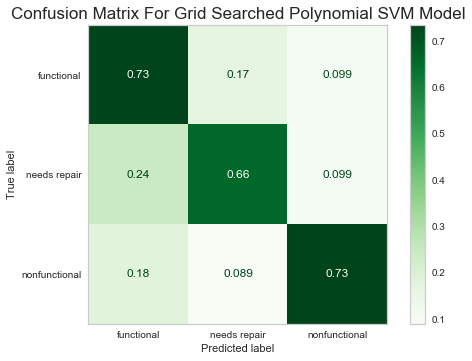

__________________________________________________________________


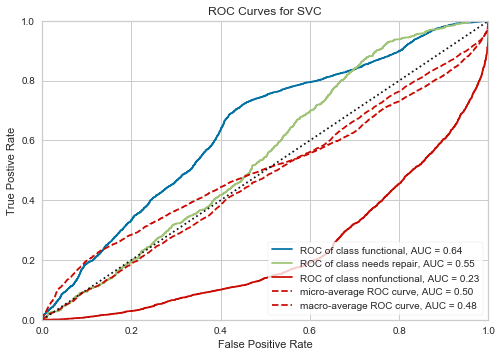

In [374]:
evaluate_model(svc_poly_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               title='Grid Searched Polynomial SVM Model')

## SMOTE Model

In [384]:
svc_poly_gridmodel

SVC(C=20, class_weight='balanced', coef0=0, decision_function_shape='ovo',
    degree=2, random_state=123)

```python
SVC(C=20, class_weight='balanced', coef0=0, decision_function_shape='ovo',
    degree=2, random_state=123)
```

In [ ]:
svm_clf = SVC(random_state=123, degree=2, coef0=0, C=20, 
              decision_function_shape='ovo', kernel='poly')
svc_poly_smote = svm_clf.fit(X_train_smote, y_train_smote)

In [ ]:
evaluate_model(svc_poly_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               title='SMOTE Polynomial SVM Model')

## Pickle

In [377]:
pickle.dump(svc_poly_base, open('svc_poly_base.sav', 'wb'))
pickle.dump(svc_poly_gridmodel, open('svc_poly_gridmodel.sav', 'wb'))

# pickle.dump(svc_poly_smote, open('svc_poly_smote.sav', 'wb'))

# LINEAR SVM

## Base Model

In [276]:
from sklearn.svm import LinearSVC

In [288]:
svm_clf = LinearSVC(random_state=123, dual=False, 
                    class_weight='balanced')
svm_base = svm_clf.fit(X_train_tf, y_train)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Linear SVM Base Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.77      0.80      0.79      8065
 needs repair       0.28      0.47      0.35      1079
nonfunctional       0.79      0.66      0.72      5706

     accuracy                           0.72     14850
    macro avg       0.62      0.64      0.62     14850
 weighted avg       0.75      0.72      0.73     14850

__________________________________________________________________


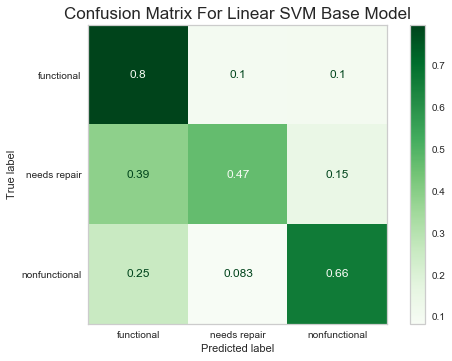

__________________________________________________________________


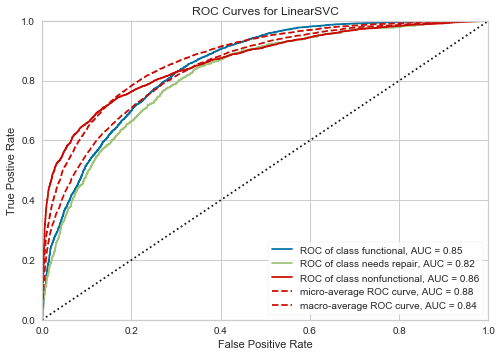

In [289]:
evaluate_model(svm_base, X_train_tf, y_train, X_test_tf, y_test, 
               title='Linear SVM Base Model')

In [293]:
svm_clf = LinearSVC(random_state=123, dual=False)
svm_base_smote = svm_clf.fit(X_train_smote, y_train_smote)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Linear SVM Base SMOTE Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.80      0.68      0.73      8065
 needs repair       0.21      0.63      0.32      1079
nonfunctional       0.79      0.65      0.71      5706

     accuracy                           0.67     14850
    macro avg       0.60      0.66      0.59     14850
 weighted avg       0.75      0.67      0.70     14850

__________________________________________________________________


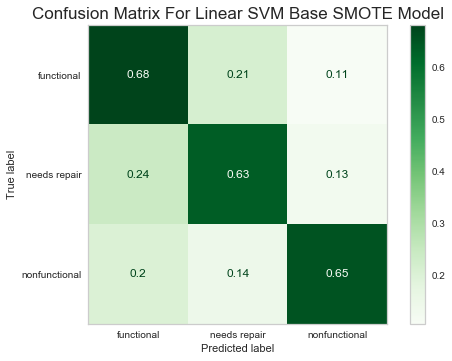

__________________________________________________________________


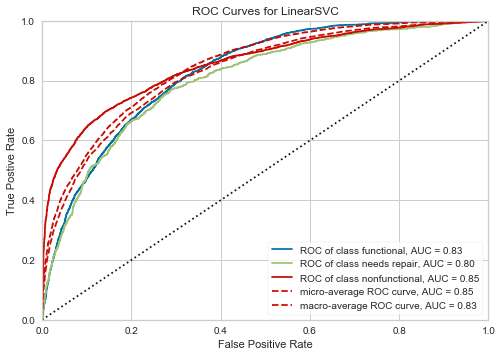

In [294]:
evaluate_model(svm_base_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               title='Linear SVM Base SMOTE Model')

## Grid Search

In [295]:
svm_params = {'C': [1, 10, 50, 100], 
              'fit_intercept': [True, False]}

svm_clf = LinearSVC(random_state=123, dual=False, class_weight='balanced')
grid = GridSearchCV(svm_clf, svm_params, scoring='recall_weighted', 
                    n_jobs=-1, cv=3)
svm_grid = grid.fit(X_train_tf, y_train)

In [296]:
svm_grid.best_params_

{'C': 1, 'fit_intercept': True}

```python
{'C': 1, 'fit_intercept': True}
```

In [299]:
svm_params = {'C': [1, 2, 3]}

svm_clf = LinearSVC(random_state=123, fit_intercept=True, dual=False, 
                    class_weight='balanced')
grid = GridSearchCV(svm_clf, svm_params, scoring='recall_weighted', 
                    n_jobs=-1, cv=3)
svm_grid2 = grid.fit(X_train_tf, y_train)

In [300]:
svm_grid2.best_params_

{'C': 2}

```python
{'C': 2}
```

In [302]:
svm_gridmodel = svm_grid2.best_estimator_
svm_gridmodel

LinearSVC(C=2, class_weight='balanced', dual=False, random_state=123)

```python
LinearSVC(C=2, class_weight='balanced', dual=False, random_state=123)
```

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	Grid Searched Linear SVM Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.77      0.80      0.79      8065
 needs repair       0.28      0.47      0.35      1079
nonfunctional       0.79      0.66      0.72      5706

     accuracy                           0.72     14850
    macro avg       0.62      0.64      0.62     14850
 weighted avg       0.75      0.72      0.73     14850

__________________________________________________________________


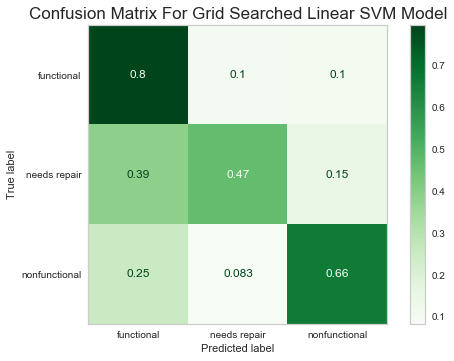

__________________________________________________________________


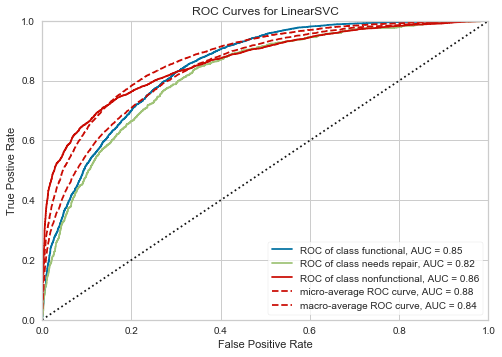

In [303]:
evaluate_model(svm_gridmodel, X_train_tf, y_train, X_test_tf, y_test, 
               title='Grid Searched Linear SVM Model')

## SMOTE Model

In [304]:
svm_gridmodel

LinearSVC(C=2, class_weight='balanced', dual=False, random_state=123)

In [305]:
svm_clf = LinearSVC(random_state=123, dual=False, C=2)
svm_smote = svm_clf.fit(X_train_smote, y_train_smote)

__________________________________________________________________
CLASSIFICATION REPORT FOR: 
	SMOTE Linear SVM Model
__________________________________________________________________


               precision    recall  f1-score   support

   functional       0.79      0.68      0.73      8065
 needs repair       0.21      0.63      0.32      1079
nonfunctional       0.79      0.65      0.71      5706

     accuracy                           0.67     14850
    macro avg       0.60      0.66      0.59     14850
 weighted avg       0.75      0.67      0.70     14850

__________________________________________________________________


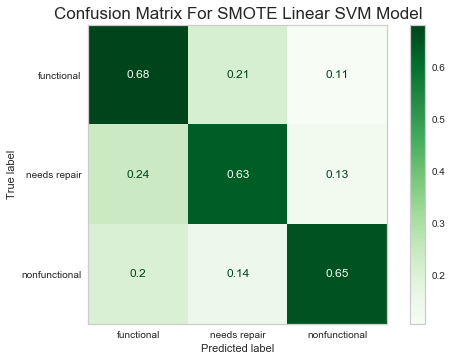

__________________________________________________________________


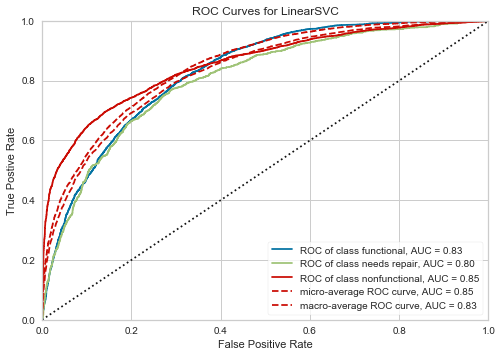

In [306]:
evaluate_model(svm_smote, X_train_smote, y_train_smote, X_test_tf, y_test, 
               title='SMOTE Linear SVM Model')

## Pickle

In [307]:
# pickle.dump(svm_base, open('svm_base.sav', 'wb'))
# pickle.dump(svm_base_smote, open('svm_base_smote.sav', 'wb'))
# pickle.dump(svm_gridmodel, open('svm_gridmodel.sav', 'wb'))
# pickle.dump(svm_smote, open('svm_smote.sav', 'wb'))

# STACKING

# INTERPRETATION

In [334]:
import shap

In [335]:
shap.__version__

'0.36.0'

# FUTURE DIRECTIONS

In [ ]:
# preprocessing with clusters
# Catboost
# further tuning
# more feature engineering